In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from xgboost import XGBRegressor
import shap
from sklearn.model_selection import GridSearchCV
from tqdm import tqdm
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer
from sklearn.model_selection import KFold
from matplotlib.colors import ListedColormap
import seaborn as sns
from sklearn.metrics import median_absolute_error

In [2]:
# Load data
# File path to the saved final CSV
output_path = r'../../data/tidy/NTD_Energy.csv'

# Read the CSV file and set the index to 'Agency'
df_all = pd.read_csv(output_path)

df_all

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
3,4,10.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,0.0,...,-0.029473,-0.033120,-0.010230,-0.022373,0.005070,0.113705,0.062222,0.042510,0.036662,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,-0.026031,-0.020982,-0.008634,0.013648,0.000441,-0.001489,-0.004645,0.003926,0.002403,1
2201,99442,22.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,...,-0.004121,-0.011112,-0.010444,0.037352,0.008943,0.006808,0.035971,-0.035651,-0.001554,1
2202,99452,1.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,1.0,...,-0.009811,-0.012703,-0.010356,0.036326,0.009249,0.006531,0.035939,-0.036598,-0.001457,1
2203,99453,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,2.0,...,-0.023657,-0.018853,-0.007855,0.012265,0.000470,-0.001496,-0.004490,0.003510,0.002307,1


In [3]:
# Drop rows where 'total_diesel(gal)' is NaN or empty
df = df_all.dropna(subset=['total_diesel(gal)'])

df

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.078395,0.030379,0.014236,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.064851,-0.028811,-0.044823,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,-0.027546,-0.054012,0.190610,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.013527,-0.035974,0.011565,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.000601,-0.026962,0.013826,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4


In [4]:
df.loc[df['Agency VOMS']<2]
#20228

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
228,11147,1.0,20933.0,78813.0,544.25,0.0,0.0,0.0,0.0,0.0,...,-0.045304,-0.054609,-0.004635,-0.102168,-0.004281,0.191053,0.068126,0.102764,0.058549,3
308,20228,1.0,4990.0,500000.0,180.53,0.0,0.0,0.0,0.0,0.0,...,-0.035575,-0.025760,-0.001932,-0.006155,-0.004020,-0.007184,-0.026806,0.025014,0.004381,4
1579,70057,1.0,1650.0,50580.0,910.37,0.0,0.0,0.0,0.0,0.0,...,-0.036429,-0.031923,0.003212,-0.030756,-0.011617,-0.014142,-0.054491,0.050103,0.008916,4


In [5]:
#df=df.loc[df['NTD ID']!=20228]
#df

In [6]:
df['Cluster'].unique()

array([0, 3, 2, 4], dtype=int64)

In [7]:
# Drop columns with more than 10% missing values
threshold = len(df) * 0.95
df = df.dropna(axis=1, thresh=threshold)
df

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.078395,0.030379,0.014236,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.064851,-0.028811,-0.044823,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,-0.027546,-0.054012,0.190610,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.013527,-0.035974,0.011565,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.000601,-0.026962,0.013826,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4


In [8]:
def clean_numeric_columns(df):
    # Replace commas with empty strings and convert to numeric
    for col in df.select_dtypes(include='object').columns:
        df[col] = df[col].str.replace(',', '')
        df[col] = pd.to_numeric(df[col], errors='ignore')
    return df

# Clean the data
df = clean_numeric_columns(df)
df

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\3598043038.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].str.replace(',', '')
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\3598043038.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = pd.to_numeric(df[col], errors='ignore')


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.078395,0.030379,0.014236,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.064851,-0.028811,-0.044823,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,-0.027546,-0.054012,0.190610,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.013527,-0.035974,0.011565,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.000601,-0.026962,0.013826,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4


In [9]:
df.Cluster.unique()

array([0, 3, 2, 4], dtype=int64)

In [10]:
## Display all column names in list format
#for col in df.columns:
#    print(col)

In [11]:
df= df.dropna(subset=['total_diesel(gal)'])
df

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.078395,0.030379,0.014236,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.064851,-0.028811,-0.044823,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,-0.027546,-0.054012,0.190610,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.013527,-0.035974,0.011565,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.000601,-0.026962,0.013826,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\2107073566.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\2107073566.py:12: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.boxplot(x='Cluster', y='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\2107073566.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='total_kWh', data=df, ax=axes[1], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\2107073566.py:18: UserWarning: Th

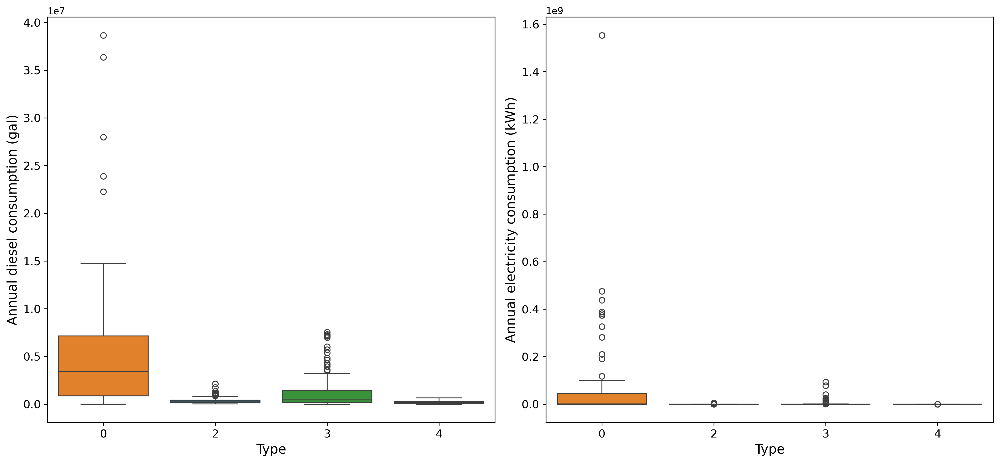

In [12]:
# Define the colors for the clusters
colors = ['#ff7f0e', '#1f77b4', '#2ca02c', '#d62728', '#9467bd']
discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create box plots
fig, axes = plt.subplots(1, 2, figsize=(15, 7), dpi=300)

# Boxplot for total_diesel(gal)
sns.boxplot(x='Cluster', y='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
axes[0].set_ylabel('Annual diesel consumption (gal)', fontsize=14)
axes[0].tick_params(axis='both', which='major', labelsize=12)
axes[0].set_xlabel('Type', fontsize=14)

# Boxplot for total_kWh
sns.boxplot(x='Cluster', y='total_kWh', data=df, ax=axes[1], palette=colors)
axes[1].set_ylabel('Annual electricity consumption (kWh)', fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=12)
axes[1].set_xlabel('Type', fontsize=14)

plt.tight_layout()
plt.show()


In [13]:
df['Cluster'].unique()

array([0, 3, 2, 4], dtype=int64)

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\693748921.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\693748921.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='total_kWh', data=df, ax=axes[1], palette=colors)


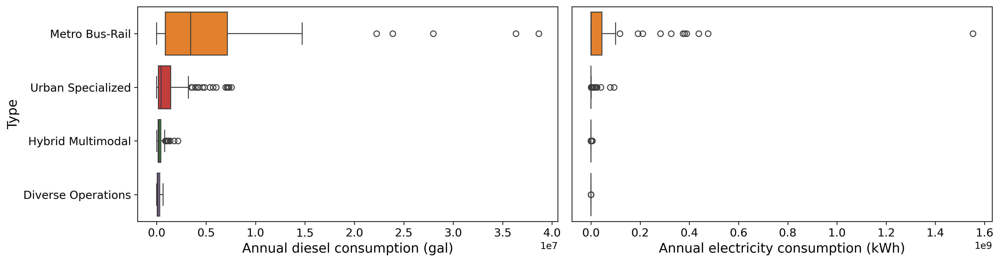

In [14]:
# Calculate per capita values
df['Diesel Consumption per Capita'] = df['total_diesel(gal)'] / df['Service Area Pop']
df['Electricity Consumption per Capita'] = df['total_kWh'] / df['Service Area Pop']

# Define the mapping of clusters to names
cluster_names = {
    0: 'Metro Bus-Rail',
#    1: 'Mid-Urban Multimodal',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Define the colors for the clusters
#colors = ['#ff7f0e', '#1f77b4', '#2ca02c', '#d62728', '#9467bd']
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']

discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create horizontal box plots
fig, axes = plt.subplots(1, 2, figsize=(15, 4), dpi=300)

# Boxplot for Diesel Consumption per Capita
sns.boxplot(y='Cluster Name', x='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
axes[0].set_xlabel('Annual diesel consumption (gal)', fontsize=14)
axes[0].tick_params(axis='both', which='major', labelsize=12)
axes[0].set_ylabel('Type', fontsize=14)
plt.setp(axes[0].get_yticklabels(), rotation=0, ha="right", fontsize=12)

# Boxplot for Electricity Consumption per Capita
sns.boxplot(y='Cluster Name', x='total_kWh', data=df, ax=axes[1], palette=colors)
axes[1].set_xlabel('Annual electricity consumption (kWh)', fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=12)
axes[1].set_ylabel('', fontsize=14)
axes[1].set_yticklabels([])
axes[1].set_yticks([])

plt.tight_layout()
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\370111363.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='total_diesel(gal)', data=df, palette=colors)


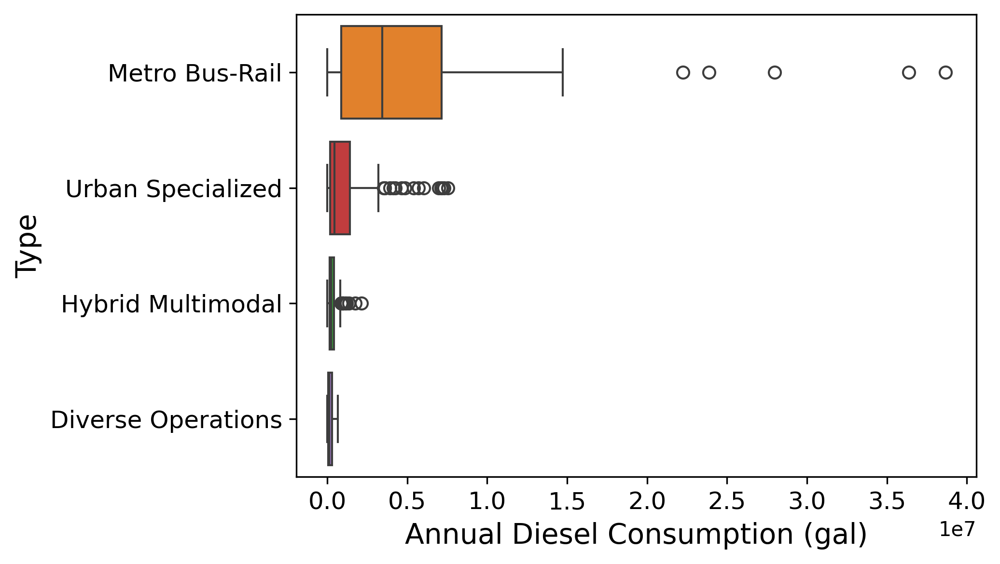

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Calculate per capita values
df['Diesel Consumption per Capita'] = df['total_diesel(gal)'] / df['Service Area Pop']

# Define the mapping of clusters to names
cluster_names = {
    0: 'Metro Bus-Rail',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Define the colors for the clusters
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']
discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create a box plot for Diesel Consumption per Capita
plt.figure(figsize=(7, 4), dpi=300)
sns.boxplot(y='Cluster Name', x='total_diesel(gal)', data=df, palette=colors)
plt.xlabel('Annual Diesel Consumption (gal)', fontsize=14)
plt.ylabel('Type', fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.tight_layout()
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\437199922.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='Diesel Consumption per Capita', data=df, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\437199922.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='Electricity Consumption per Capita', data=df, ax=axes[1], palette=colors)


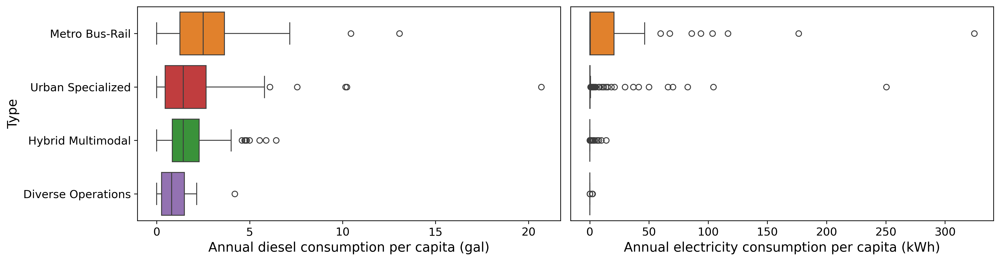

In [16]:
# Calculate per capita values
df['Diesel Consumption per Capita'] = df['total_diesel(gal)'] / df['Service Area Pop']
df['Electricity Consumption per Capita'] = df['total_kWh'] / df['Service Area Pop']

# Define the mapping of clusters to names
cluster_names = {
    0: 'Metro Bus-Rail',
#    1: 'Mid-Urban Multimodal',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Define the colors for the clusters
#colors = ['#ff7f0e', '#1f77b4', '#2ca02c', '#d62728', '#9467bd']
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']

discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create horizontal box plots
fig, axes = plt.subplots(1, 2, figsize=(15, 4), dpi=300)

# Boxplot for Diesel Consumption per Capita
sns.boxplot(y='Cluster Name', x='Diesel Consumption per Capita', data=df, ax=axes[0], palette=colors)
axes[0].set_xlabel('Annual diesel consumption per capita (gal)', fontsize=14)
axes[0].tick_params(axis='both', which='major', labelsize=12)
axes[0].set_ylabel('Type', fontsize=14)
plt.setp(axes[0].get_yticklabels(), rotation=0, ha="right", fontsize=12)

# Boxplot for Electricity Consumption per Capita
sns.boxplot(y='Cluster Name', x='Electricity Consumption per Capita', data=df, ax=axes[1], palette=colors)
axes[1].set_xlabel('Annual electricity consumption per capita (kWh)', fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=12)
axes[1].set_ylabel('', fontsize=14)
axes[1].set_yticklabels([])
axes[1].set_yticks([])

plt.tight_layout()
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\3186163996.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='Diesel Consumption per Capita', data=df, palette=colors)


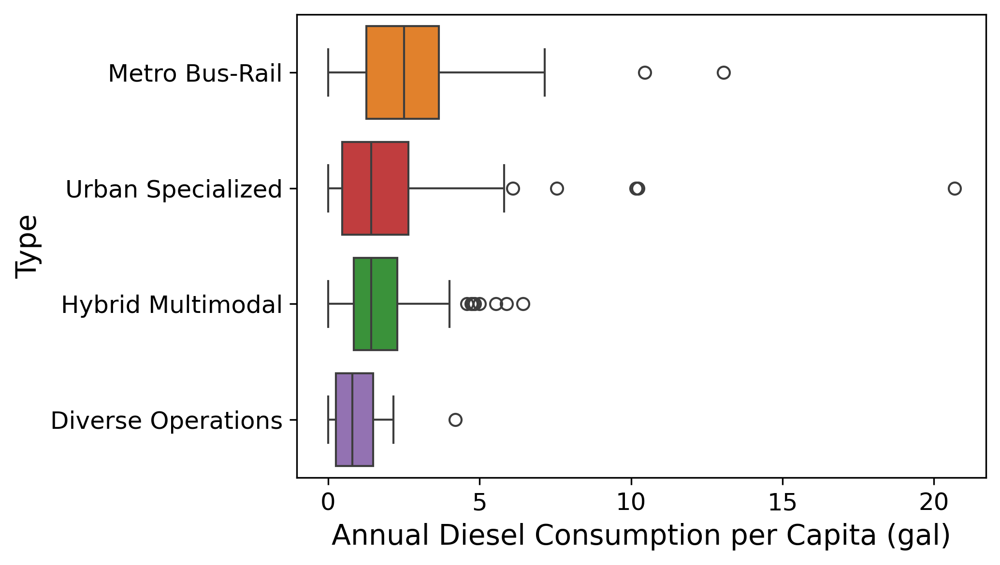

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Calculate per capita values
df['Diesel Consumption per Capita'] = df['total_diesel(gal)'] / df['Service Area Pop']

# Define the mapping of clusters to names
cluster_names = {
    0: 'Metro Bus-Rail',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Define the colors for the clusters
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']
discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create a box plot for Diesel Consumption per Capita
plt.figure(figsize=(7, 4), dpi=300)
sns.boxplot(y='Cluster Name', x='Diesel Consumption per Capita', data=df, palette=colors)
plt.xlabel('Annual Diesel Consumption per Capita (gal)', fontsize=14)
plt.ylabel('Type', fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.tight_layout()
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\3185200340.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\3185200340.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='Diesel Consumption per Capita', data=df, ax=axes[1], palette=colors)


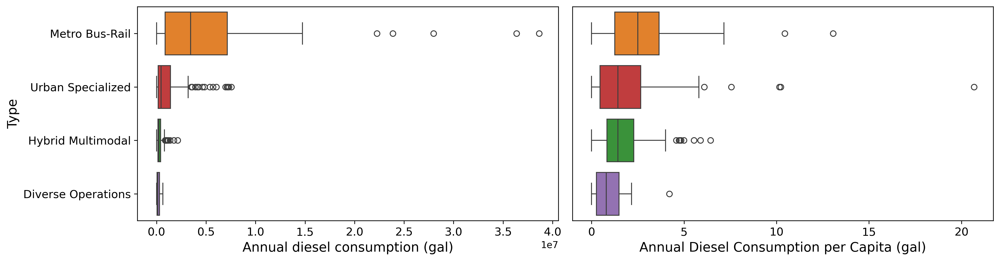

In [18]:
# Calculate per capita values
df['Diesel Consumption per Capita'] = df['total_diesel(gal)'] / df['Service Area Pop']
df['Electricity Consumption per Capita'] = df['total_kWh'] / df['Service Area Pop']

# Define the mapping of clusters to names
cluster_names = {
    0: 'Metro Bus-Rail',
#    1: 'Mid-Urban Multimodal',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Define the colors for the clusters
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']
#colors = ['#ff7f0e', '#1f77b4', '#2ca02c', '#d62728', '#9467bd']
#colors = ['#ff7f0e', '#9467bd', '#2ca02c', '#d62728']

discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create horizontal box plots
fig, axes = plt.subplots(1, 2, figsize=(15, 4), dpi=300)

# Boxplot for Diesel Consumption per Capita
sns.boxplot(y='Cluster Name', x='total_diesel(gal)', data=df, ax=axes[0], palette=colors)
axes[0].set_xlabel('Annual diesel consumption (gal)', fontsize=14)
axes[0].tick_params(axis='both', which='major', labelsize=12)
axes[0].set_ylabel('Type', fontsize=14)
plt.setp(axes[0].get_yticklabels(), rotation=0, ha="right", fontsize=12)

# Boxplot for Electricity Consumption per Capita
sns.boxplot(y='Cluster Name', x='Diesel Consumption per Capita', data=df, ax=axes[1], palette=colors)
axes[1].set_xlabel('Annual Diesel Consumption per Capita (gal)', fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=12)
axes[1].set_ylabel('', fontsize=14)
axes[1].set_yticklabels([])
axes[1].set_yticks([])

plt.tight_layout()
plt.show()


## Model 1: a) Predict gal, b) using variables, c)with clusters 

In [19]:
# Show rows where total_diesel(gal) is zero
zero_diesel_rows = df[df['total_diesel(gal)'] == 0]
print("Rows where total_diesel(gal) is zero:")
zero_diesel_rows

Rows where total_diesel(gal) is zero:


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC7,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name
21,23,8.0,228303.0,753655.0,982.52,0.0,0.0,0.0,0.0,0.0,...,-0.037869,-0.008939,-0.010514,-0.021933,-0.045832,-0.031461,0,0.0,0.651707,Metro Bus-Rail
44,58,28.0,381460.0,97377.0,519.30,0.0,0.0,0.0,0.0,0.0,...,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0,0.0,29.088317,Metro Bus-Rail
247,20075,60.0,5119230.0,159726.0,1898.19,0.0,0.0,0.0,0.0,0.0,...,-0.079894,-0.010579,-0.025363,-0.062045,0.054387,0.015775,3,0.0,250.476460,Urban Specialized
255,20098,274.0,12974558.0,3134256.0,3248.12,0.0,0.0,0.0,0.0,0.0,...,-0.054568,-0.001552,0.071607,0.032062,0.012705,0.062970,3,0.0,29.780582,Urban Specialized
256,20099,44.0,2663396.0,495747.0,3248.12,0.0,0.0,0.0,0.0,0.0,...,-0.043366,-0.007804,-0.010381,0.006914,-0.017430,-0.007059,3,0.0,50.032464,Urban Specialized
385,30057,20.0,1606581.0,3371466.0,1898.19,0.0,0.0,0.0,20.0,0.0,...,-0.139599,-0.011507,-0.075848,-0.158956,-0.078150,0.370152,3,0.0,4.036343,Urban Specialized
417,30107,48.0,522735.0,60547.0,40.70,0.0,0.0,0.0,0.0,0.0,...,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0,0.0,15.833518,Metro Bus-Rail
1004,50104,70.0,2727755.0,958644.0,2337.89,0.0,0.0,0.0,70.0,0.0,...,-0.146000,-0.010512,-0.087397,-0.177586,-0.128153,0.477667,3,0.0,13.711294,Urban Specialized
1016,50141,4.0,20123.0,92477.0,1284.83,0.0,0.0,0.0,0.0,0.0,...,-0.039384,-0.012658,-0.014256,-0.047244,0.008843,-0.008122,3,0.0,18.285195,Urban Specialized
1063,50213,4.0,122684.0,21738.0,1284.83,0.0,0.0,0.0,0.0,0.0,...,-0.081422,-0.029298,-0.015340,-0.076860,0.055153,-0.010770,3,0.0,104.357899,Urban Specialized


In [20]:
# Drop rows where total_diesel(gal) is zero
df_model1 = df[df['total_diesel(gal)'] != 0]

In [21]:
df_model1

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC7,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0,4.046211,7.773562,Metro Bus-Rail
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3,3.493069,0.551362,Urban Specialized
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3,2.838323,0.410315,Urban Specialized
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2,2.611268,6.380551,Hybrid Multimodal
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3,2.038247,0.000000,Urban Specialized
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0,0.431131,0.000000,Metro Bus-Rail
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0,0.499378,0.000000,Metro Bus-Rail
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4,1.646274,0.000000,Diverse Operations
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4,2.053929,0.000000,Diverse Operations


In [22]:
df.columns

Index(['NTD ID', 'Agency VOMS', 'Actual Vehicle/Passenger Car Miles',
       'Service Area Population', 'Primary UZA Area Sq Miles', 'Mode VOMS_AR',
       'Mode VOMS_CB', 'Mode VOMS_CC', 'Mode VOMS_CR', 'Mode VOMS_DR',
       ...
       'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'Cluster',
       'Diesel Consumption per Capita', 'Electricity Consumption per Capita',
       'Cluster Name'],
      dtype='object', length=189)

In [23]:
# Define the columns to exclude
columns_to_exclude = ['total_kWh', 'total_diesel(gal)', 'NTD ID', 'City', 'State', 'UZA', 'Latitude', 'Longitude', 'PC1', 'Diesel Consumption per Capita', 'Diesel Consumption per Capita', 'Cluster', 'PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12']

# Select features (X) and target variables (y)
X_model1 = df_model1.drop(columns=columns_to_exclude)
y_model1 = df_model1['total_diesel(gal)']

In [24]:
# Display rows that contain NaN values
rows_with_nan = X_model1[X_model1.isna().any(axis=1)]

# Show the result
rows_with_nan


,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,Mode VOMS_FB,...,Days of Service Operated,Days Not Operated Due to Emergencies,Non-Statutory Mixed Traffic,DRM Mixed Traffic ROW,Service Area Sq Miles,Service Area Pop,Operating,Capital,Electricity Consumption per Capita,Cluster Name


In [25]:
# Split data into training and test sets
X_train_model1, X_test_model1, y_train_model1, y_test_model1 = train_test_split(X_model1, y_model1, test_size=0.2, random_state=42)


In [26]:
# Identify categorical and numerical columns
categorical_features = ['Cluster Name']  
numerical_features = [col for col in X_model1.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [27]:
# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


#### XGBoost model1

XGBoost (eXtreme Gradient Boosting) is a machine learning algorithm based on the gradient boosting framework, which builds an ensemble of decision trees to improve prediction accuracy. It works by sequentially training trees, where each tree corrects the errors of the previous ones. Known for its efficiency, speed, and scalability, XGBoost includes features like regularization to prevent overfitting, parallel computation, and handling of missing data, making it highly effective for structured data tasks such as classification and regression.

In [28]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model1, y_train_model1)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model1)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model1, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


n_estimators: 50, max_depth: 2 => MAPE: 0.4101686070389744
n_estimators: 50, max_depth: 3 => MAPE: 0.3371340123055511
n_estimators: 50, max_depth: 4 => MAPE: 0.28725146731351164
n_estimators: 50, max_depth: 5 => MAPE: 0.27558855882357913
n_estimators: 50, max_depth: 6 => MAPE: 0.2772910946724152
n_estimators: 50, max_depth: 7 => MAPE: 0.2708967896116149
n_estimators: 50, max_depth: 8 => MAPE: 0.2819485419250374
n_estimators: 50, max_depth: 9 => MAPE: 0.294203360587027
n_estimators: 100, max_depth: 2 => MAPE: 0.35277597872639355
n_estimators: 100, max_depth: 3 => MAPE: 0.31318897377936405
n_estimators: 100, max_depth: 4 => MAPE: 0.285866757086453
n_estimators: 100, max_depth: 5 => MAPE: 0.2674444458940716
n_estimators: 100, max_depth: 6 => MAPE: 0.28373030228929297
n_estimators: 100, max_depth: 7 => MAPE: 0.27023696318240104
n_estimators: 100, max_depth: 8 => MAPE: 0.2805431723401713
n_estimators: 100, max_depth: 9 => MAPE: 0.2944469056047631
n_estimators: 150, max_depth: 2 => MAPE: 0.3

In [29]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model1 = XGBRegressor(n_estimators=150, max_depth=5, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline1 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model1)])

# Train the XGBoost model
xgboost_pipeline1.fit(X_train_model1, y_train_model1)

# Make predictions
y_pred_xgb_model1 = xgboost_pipeline1.predict(X_test_model1)

# Evaluate the XGBoost model
mse_xgb_model1 = mean_squared_error(y_test_model1, y_pred_xgb_model1)
mape_xgb_model1 = mean_absolute_percentage_error(y_test_model1, y_pred_xgb_model1)

print(f'Mean Squared Error for XGBoost model1: {mse_xgb_model1}')
print(f'Mean Absolute Percentage Error for XGBoost model1: {mape_xgb_model1}')

Mean Squared Error for XGBoost model1: 8302500258136.73
Mean Absolute Percentage Error for XGBoost model1: 0.26594512727392916


In [30]:
# Compute Absolute Percentage Error (APE)
ape = np.abs((y_test_model1 - y_pred_xgb_model1) / y_test_model1) * 100

# Compute Median Absolute Percentage Error (MdAPE)
mdape_xgb_model1 = np.median(ape)

# Print results
print(f'Median Absolute Percentage Error (MdAPE) for XGBoost model1: {mdape_xgb_model1}')


Median Absolute Percentage Error (MdAPE) for XGBoost model1: 19.271750430767025


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\1114659963.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_model1['y_pred'] = y_pred_full  # Add predictions to the dataframe


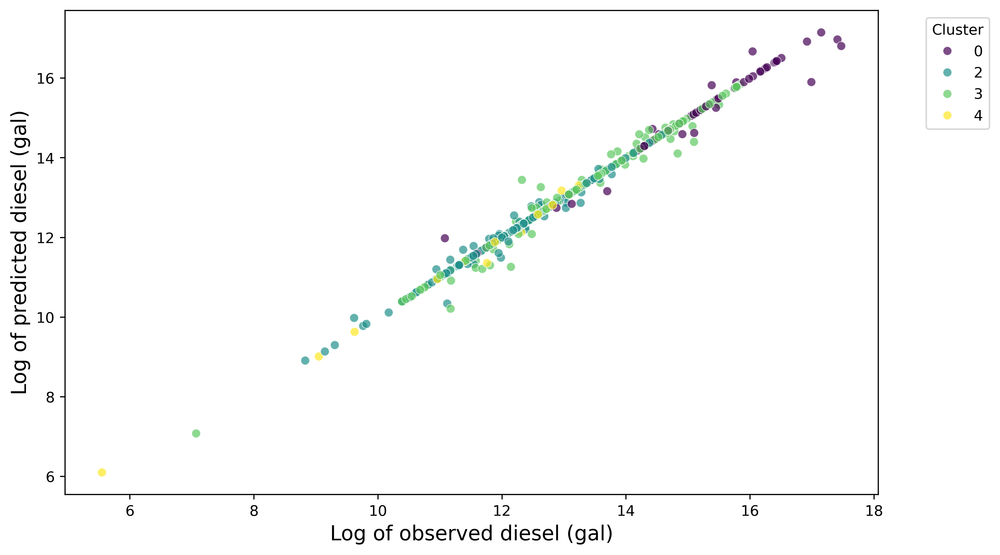

In [31]:
# Make predictions on the full dataset (X_model1)
y_pred_full = xgboost_pipeline1.predict(X_model1)

# Prepare data for plotting
df_model1['y_pred'] = y_pred_full  # Add predictions to the dataframe

# Ensure no negative or zero values before applying log
df_model1 = df_model1[(df_model1['y_pred'] > 0) & (df_model1['total_diesel(gal)'] > 0)]

# Plot
plt.figure(figsize=(10, 6), dpi=400)
sns.scatterplot(
    x=np.log(df_model1['total_diesel(gal)']),
    y=np.log(df_model1['y_pred']),
    hue=df_model1['Cluster'],
    palette='viridis',  # Choose a color palette
    alpha=0.7
)

# Add log-log labels and titles
plt.xlabel('Log of observed diesel (gal)', fontsize=14)
plt.ylabel('Log of predicted diesel (gal)', fontsize=14)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\1345465143.py:20: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.scatterplot(


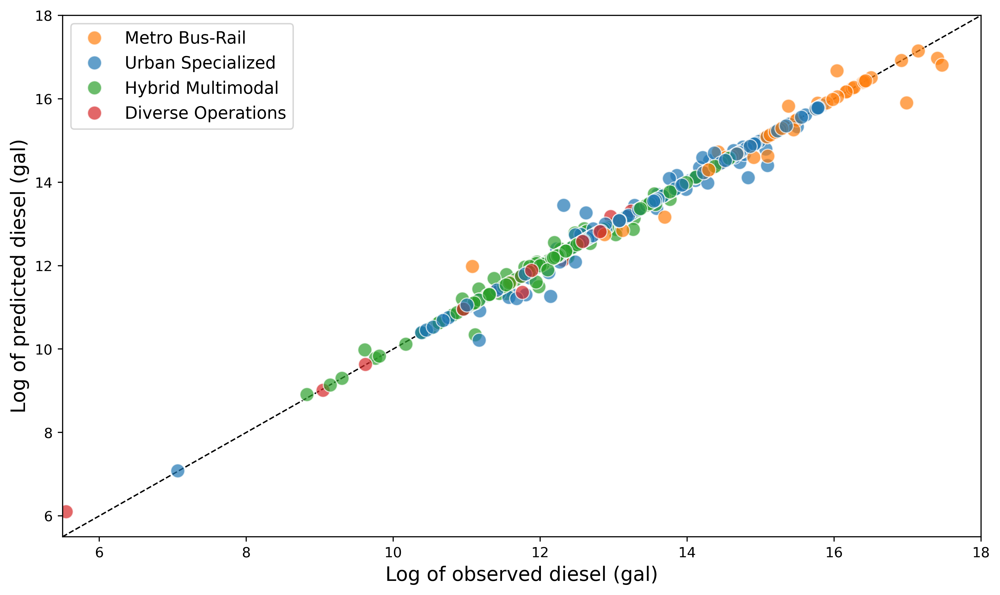

In [32]:
# Mapping of cluster numbers to names
cluster_names = {
    0: 'Metro Bus-Rail',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df_model1['Cluster Name'] = df_model1['Cluster'].map(cluster_names)

# Define the same color palette as in the box plot
colors = ['#ff7f0e', '#1f77b4', '#2ca02c', '#d62728', '#9467bd']

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Plot
plt.figure(figsize=(10, 6), dpi=400)
sns.scatterplot(
    x=np.log(df_model1['total_diesel(gal)']),
    y=np.log(df_model1['y_pred']),
    hue=df_model1['Cluster Name'],
    palette=colors,  # Use the same color palette as the box plot
    alpha=0.7,
    s=100,  # Increase the size of the points
    zorder=2
)

# Set the x- and y-limits to be the same
plt.xlim(5.5, 18)  # Adjust limits based on your data range
plt.ylim(5.5, 18)  # Keep the same range for both axes

# Plot the y=x line for reference
plt.plot([5.5, 18], [5.5, 18], color='black', linestyle='--', linewidth=1, zorder=1)

# Add log-log labels and titles
plt.xlabel('Log of observed diesel (gal)', fontsize=14)
plt.ylabel('Log of predicted diesel (gal)', fontsize=14)

# Adjust the legend to be inside the plot at the top left
plt.legend(title='', loc='upper left', fontsize=12)

# Show plot
plt.tight_layout()
plt.show()


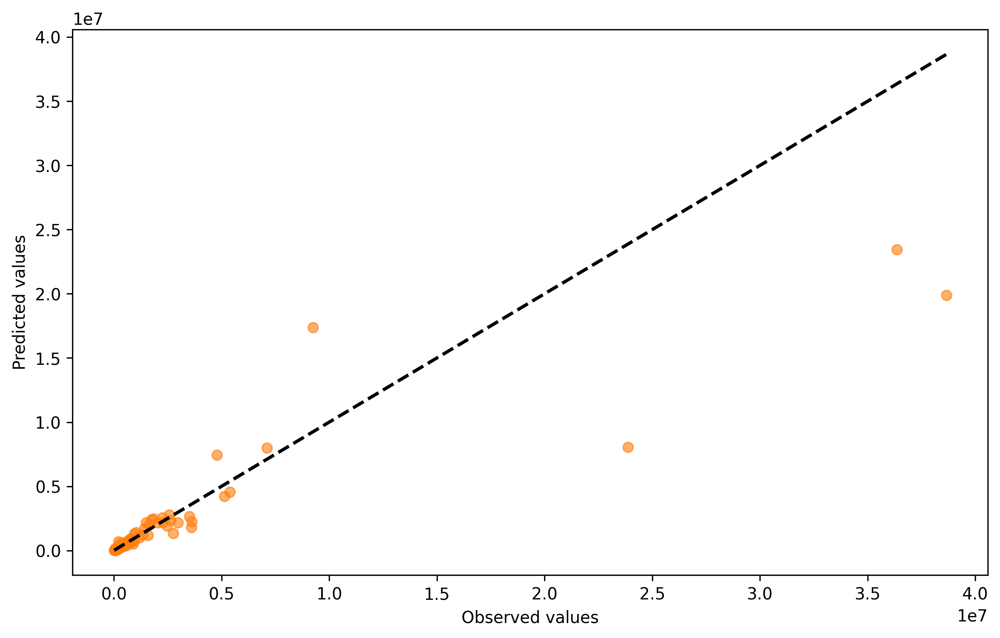

In [33]:
# Scatter plot for actual vs. predicted values
plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(y_test_model1, y_pred_xgb_model1, alpha=0.6)
plt.plot([y_test_model1.min(), y_test_model1.max()], [y_test_model1.min(), y_test_model1.max()], 'k--', lw=2)
plt.xlabel('Observed values')
plt.ylabel('Predicted values')
#plt.title('Actual vs Predicted Values')
plt.show()


SHAP (SHapley Additive exPlanations) values measure the contribution of each feature to the model's output, based on Shapley values from cooperative game theory.

SHAP value shows how much a feature contributes to pushing a prediction away from the average prediction. If the SHAP value is positive, it means the feature increases the predicted outcome; if it's negative, the feature reduces it.

These values are calculated by considering all possible combinations of features, measuring the change in the model's output as the feature in question is added to the set.

Shapley values are computed by comparing the output of the model with and without the feature across all possible subsets of features. This results in an attribution value for each feature based on its contribution to the output of the model.
The process is as follows:
Take all combinations of features excluding the feature of interest.
Compute the model's output for these combinations.
Add the feature of interest to the combinations and again compute the model's output.
Measure the change in output, which becomes the SHAP value for that feature.

Text(0.5, 149.4444444444444, 'SHAP value')

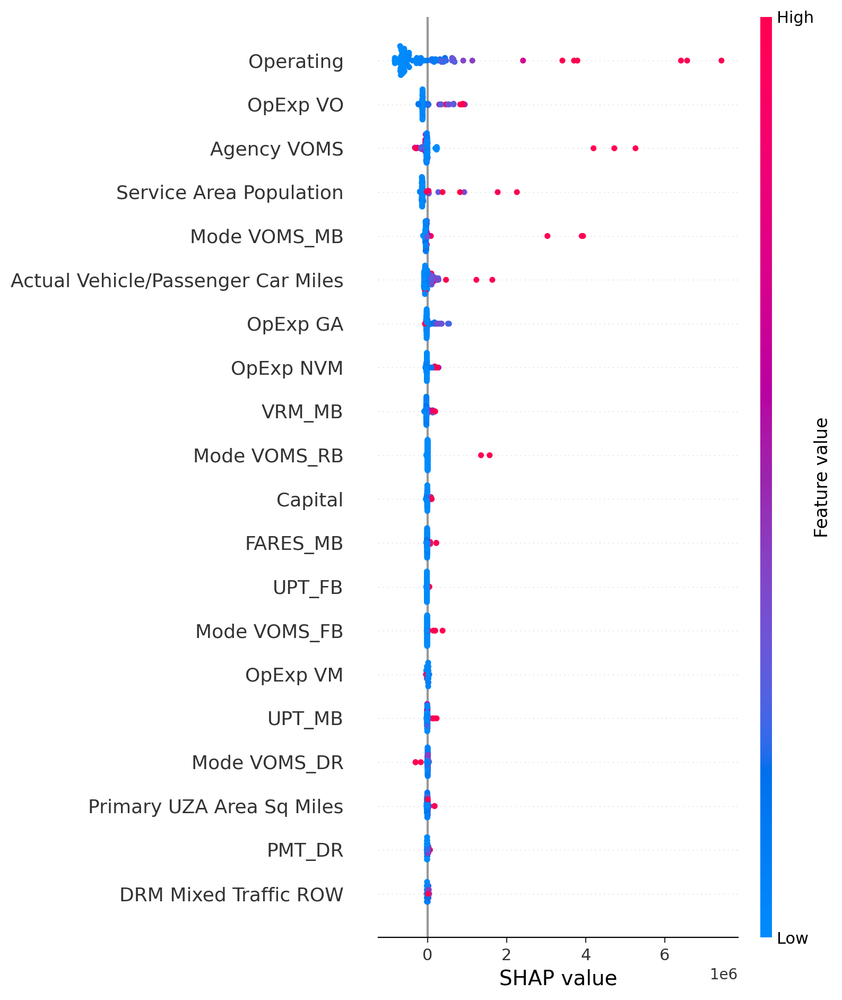

In [34]:
# Get feature names for the transformed data
# Numerical feature names remain the same
numerical_features_transformed = numerical_features

# Get the categorical feature names after encoding
categorical_features_transformed = xgboost_pipeline1.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features)

# Combine both numerical and categorical feature names
feature_names = list(numerical_features_transformed) + list(categorical_features_transformed)

# Transform the training and test data using the pipeline's preprocessor step (without fitting the model)
X_train_transformed1 = xgboost_pipeline1.named_steps['preprocessor'].transform(X_train_model1)
X_test_transformed1 = xgboost_pipeline1.named_steps['preprocessor'].transform(X_test_model1)

# Create a SHAP explainer object for the XGBoost model
explainer1 = shap.Explainer(xgboost_pipeline1.named_steps['model'], X_train_transformed1)

# Calculate SHAP values for the test data
shap_values1 = explainer1(X_test_transformed1)

plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot with proper feature names
shap.summary_plot(shap_values1, X_test_transformed1, feature_names=feature_names, show=False)

plt.xlabel("SHAP value", fontsize=14)


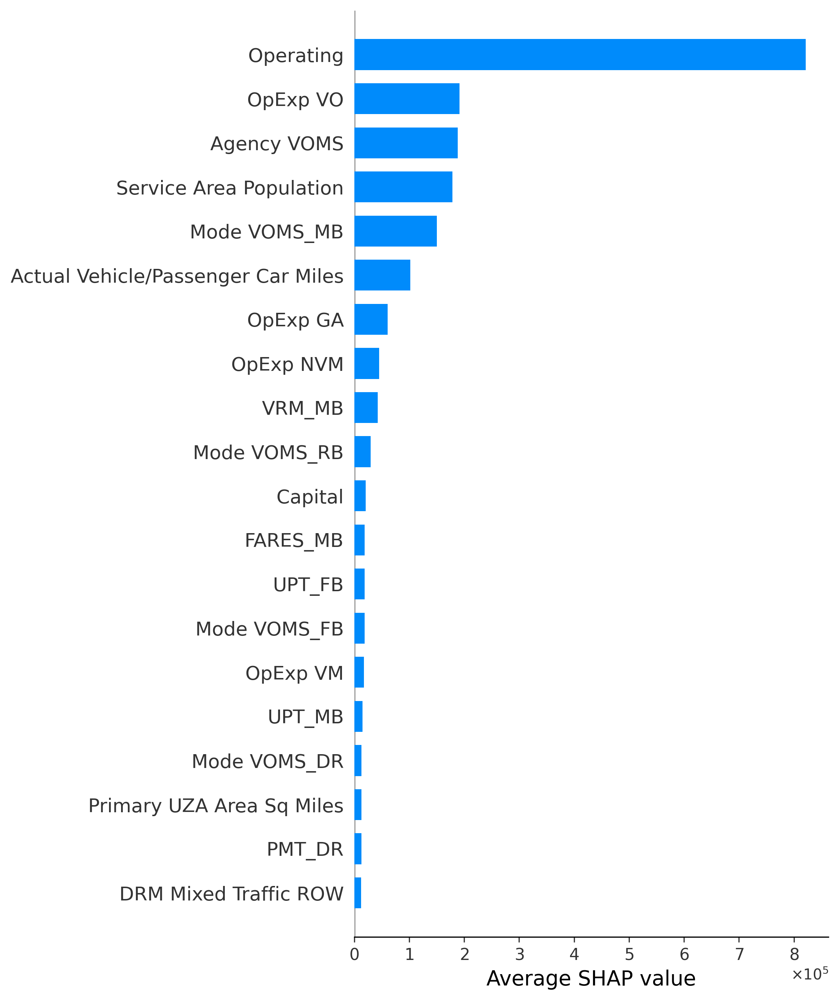

In [35]:
import matplotlib.ticker as mticker

plt.figure(figsize=(10, 6), dpi=300)

# Plot SHAP bar plot for feature importance with proper feature names
shap.summary_plot(shap_values1, X_test_transformed1, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()


## Try to improve the best model performnace even furthur:


In [37]:
# Define the parameter grid for XGBoost
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [3, 5, 7],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__subsample': [0.8, 1.0],
    'model__colsample_bytree': [0.8, 1.0]
}

# Create a pipeline with preprocessing and XGBoost model
xgboost_pipeline_cv = Pipeline(steps=[('preprocessor', preprocessor),
                                      ('model', XGBRegressor(random_state=42))])

# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=xgboost_pipeline_cv, param_grid=param_grid, cv=5, scoring='neg_mean_absolute_percentage_error', verbose=1)

# Fit the grid search
grid_search.fit(X_train_model1, y_train_model1)

# Best model and parameters
best_model = grid_search.best_estimator_
print(f'Best parameters: {grid_search.best_params_}')

# Evaluate the best model
y_pred_best_model = best_model.predict(X_test_model1)
best_mape = mean_absolute_percentage_error(y_test_model1, y_pred_best_model)
print(f'Best Model MAPE: {best_mape}')

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters: {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 300, 'model__subsample': 1.0}
Best Model MAPE: 0.29533332500728954


In [38]:
from sklearn.preprocessing import PolynomialFeatures

# Identify categorical and numerical columns
categorical_features = ['Cluster Name']  # Update with your actual categorical columns
numerical_features = [col for col in X_model1.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and test sets
X_train_model1, X_test_model1, y_train_model1, y_test_model1 = train_test_split(X_model1, y_model1, test_size=0.2, random_state=42)

# 1. Non-Polynomial Version
xgboost_pipeline_non_poly = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', XGBRegressor(random_state=42))
])

# Train and evaluate the non-polynomial model
xgboost_pipeline_non_poly.fit(X_train_model1, y_train_model1)
y_pred_non_poly = xgboost_pipeline_non_poly.predict(X_test_model1)
non_poly_mape = mean_absolute_percentage_error(y_test_model1, y_pred_non_poly)

# 2. Polynomial Version
poly = PolynomialFeatures(degree=2, interaction_only=True)

xgboost_pipeline_poly = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('poly', poly),  # Apply polynomial features to preprocessed data
    ('model', XGBRegressor(random_state=42))
])

# Train and evaluate the polynomial model
xgboost_pipeline_poly.fit(X_train_model1, y_train_model1)
y_pred_poly = xgboost_pipeline_poly.predict(X_test_model1)
poly_mape = mean_absolute_percentage_error(y_test_model1, y_pred_poly)

# Print both MAPEs for comparison
print(f'MAPE without Polynomial Features: {non_poly_mape}')
print(f'MAPE with Polynomial Features: {poly_mape}')


MAPE without Polynomial Features: 0.28373030228929297
MAPE with Polynomial Features: 0.2728537261076951


In [39]:
# Define a wider parameter grid for XGBoost
param_grid = {
    'model__n_estimators': [150, 200, 300],
    'model__max_depth': [5, 6, 7],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__subsample': [0.8, 1.0],
    'model__colsample_bytree': [0.8, 1.0],
    'model__alpha': [0, 0.5, 1],  # L1 regularization
    'model__lambda': [1, 1.5, 2]  # L2 regularization
}

# Initialize the pipeline again
xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', XGBRegressor(random_state=42))])

# Use GridSearchCV to find the best parameters
grid_search = GridSearchCV(estimator=xgboost_pipeline, param_grid=param_grid, cv=5, scoring='neg_mean_absolute_percentage_error')

# Train the model with GridSearchCV
grid_search.fit(X_train_model1, y_train_model1)

# Get the best model and parameters
best_model = grid_search.best_estimator_
print(f'Best parameters: {grid_search.best_params_}')

# Predict and evaluate the best model
y_pred_best = best_model.predict(X_test_model1)
best_mape = mean_absolute_percentage_error(y_test_model1, y_pred_best)
print(f'Best Model MAPE: {best_mape}')


Best parameters: {'model__alpha': 1, 'model__colsample_bytree': 0.8, 'model__lambda': 1.5, 'model__learning_rate': 0.1, 'model__max_depth': 5, 'model__n_estimators': 300, 'model__subsample': 1.0}
Best Model MAPE: 0.24593399285751388


In [40]:
import pandas as pd
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_percentage_error

# Define a wider parameter grid for XGBoost
param_grid = {
    'model__n_estimators': [50, 100, 150, 200, 250, 300],
    'model__max_depth': [2, 3, 4, 5, 6, 7],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__alpha': [0, 0.5, 1],  # L1 regularization
    'model__lambda': [1, 1.5, 2]  # L2 regularization
}

# Initialize the pipeline
xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', XGBRegressor(random_state=42))])

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgboost_pipeline, param_grid=param_grid, cv=5, scoring='neg_mean_absolute_percentage_error', return_train_score=True)

# Train the model with GridSearchCV
grid_search.fit(X_train_model1, y_train_model1)

# Create a DataFrame from the cross-validation results
cv_results_df = pd.DataFrame(grid_search.cv_results_)

# Convert the negative MAPE back to positive values for both train and test scores
cv_results_df['mean_train_score'] = -cv_results_df['mean_train_score']
cv_results_df['mean_test_score'] = -cv_results_df['mean_test_score']

# Select relevant columns for hyperparameters and their mean cross-validated train/test scores
cv_results_df = cv_results_df[['param_model__n_estimators', 'param_model__max_depth', 
                               'param_model__learning_rate', 'param_model__alpha', 
                               'param_model__lambda', 'mean_train_score', 'mean_test_score', 
                               'rank_test_score']]

# Sort the DataFrame by rank (best to worst)
cv_results_df = cv_results_df.sort_values(by='rank_test_score')

# Display the training and test errors for each explored model
cv_results_df

# Print the best parameters based on the GridSearchCV results
print(f'Best parameters: {grid_search.best_params_}')


Best parameters: {'model__alpha': 0, 'model__lambda': 1.5, 'model__learning_rate': 0.1, 'model__max_depth': 5, 'model__n_estimators': 300}


In [36]:
### The best model found
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model1 = XGBRegressor(alpha= 0, reg_lambda= 1.5, learning_rate= 0.1, max_depth= 5, n_estimators= 300, random_state=42)
#xgboost_model1 = XGBRegressor(alpha= 0.5, reg_lambda= 1.5, learning_rate= 0.1, max_depth= 5, n_estimators= 300, random_state=42)
#xgboost_model1 = XGBRegressor(alpha= 0, reg_lambda= 1.5, learning_rate= 0.1, max_depth= 3, n_estimators= 300, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline1 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model1)])

# Train the XGBoost model
xgboost_pipeline1.fit(X_train_model1, y_train_model1)

# Predict on the training set
y_train_pred = xgboost_pipeline1.predict(X_train_model1)
train_mape = mean_absolute_percentage_error(y_train_model1, y_train_pred)
print(f'Training MAPE: {train_mape}')

# Predict on the test set
y_pred_xgb_model1 = xgboost_pipeline1.predict(X_test_model1)

# Evaluate the XGBoost model
mse_xgb_model1 = mean_squared_error(y_test_model1, y_pred_xgb_model1)
mape_xgb_model1 = mean_absolute_percentage_error(y_test_model1, y_pred_xgb_model1)

print(f'Mean Squared Error for XGBoost model1: {mse_xgb_model1}')
print(f'Mean Absolute Percentage Error for XGBoost model1: {mape_xgb_model1}')

Training MAPE: 0.016279854113092358
Mean Squared Error for XGBoost model1: 8025023734019.336
Mean Absolute Percentage Error for XGBoost model1: 0.2392445164338064


In [37]:
# Compute Absolute Percentage Error (APE)
ape = np.abs((y_test_model1 - y_pred_xgb_model1) / y_test_model1) * 100

# Compute Median Absolute Percentage Error (MdAPE)
mdape_xgb_model1 = np.median(ape)

# Print results
print(f'Median Absolute Percentage Error (MdAPE) for XGBoost model1: {mdape_xgb_model1}')


Median Absolute Percentage Error (MdAPE) for XGBoost model1: 17.714814519492627


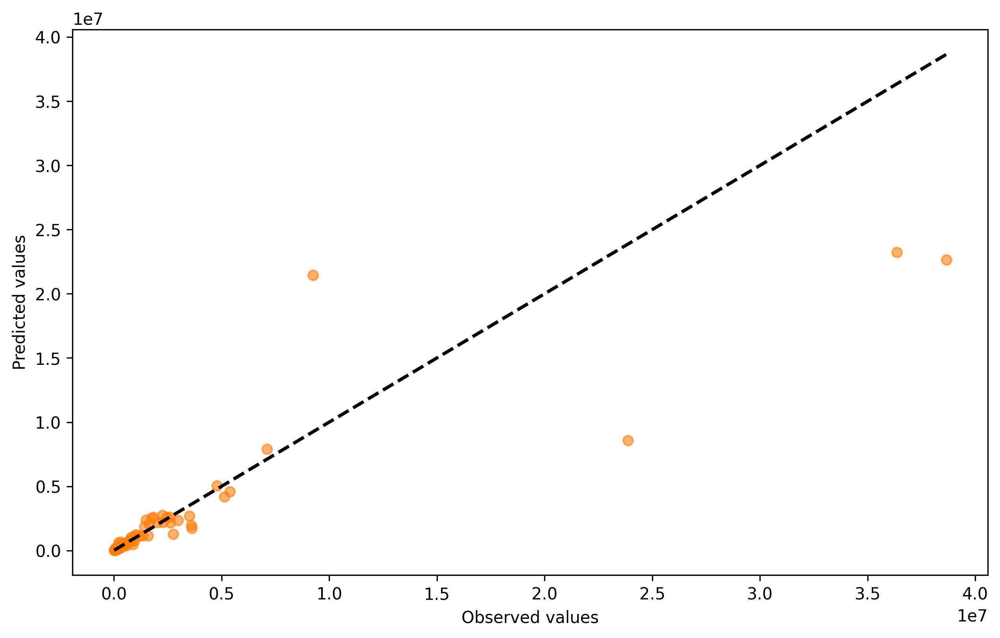

In [38]:
# Scatter plot for actual vs. predicted values
plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(y_test_model1, y_pred_xgb_model1, alpha=0.6)
plt.plot([y_test_model1.min(), y_test_model1.max()], [y_test_model1.min(), y_test_model1.max()], 'k--', lw=2)
plt.xlabel('Observed values')
plt.ylabel('Predicted values')
#plt.title('Actual vs Predicted Values')
plt.show()


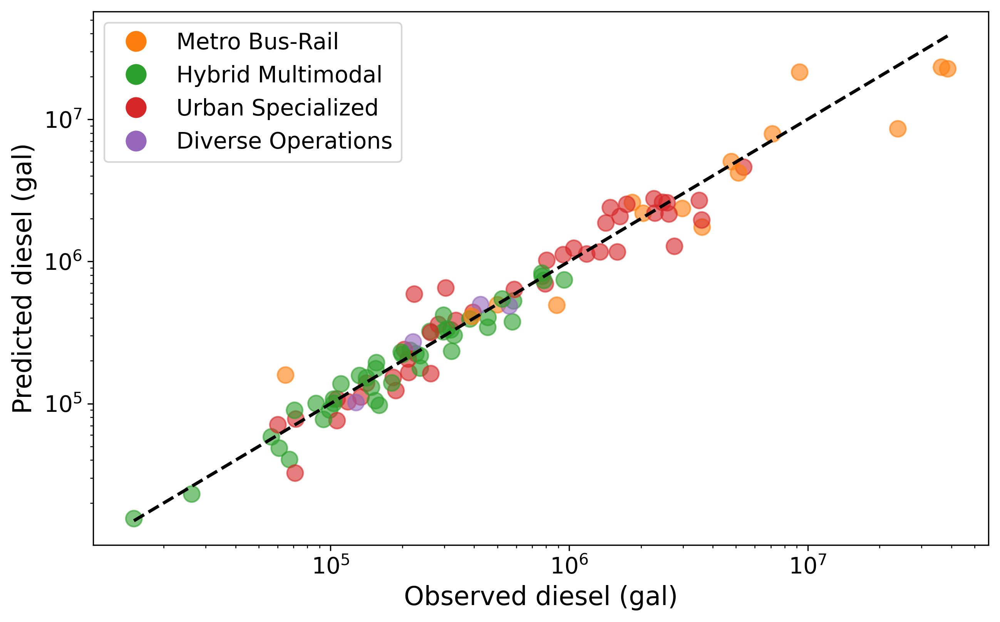

In [39]:
# Assuming df_model1 includes all data (train + test), let's extract only the test set rows using the test indices
test_indices = X_test_model1.index  # Get the indices of the test set

# Filter df_model1 to include only the rows corresponding to the test set
df_model1_test = df_model1.loc[test_indices]

# Mapping of cluster numbers to names
cluster_names = {
    0: 'Metro Bus-Rail',
    1: 'Mid-Urban Multimodal',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df_model1_test['Cluster Name'] = df_model1_test['Cluster'].map(cluster_names)

# Define color palette corresponding to cluster names
cluster_colors = {
    'Metro Bus-Rail': '#ff7f0e',       # Orange
#    'Mid-Sized Urban': '#1f77b4', # Blue
    'Hybrid Multimodal': '#2ca02c',    # Green
    'Urban Specialized': '#d62728',    # Red
    'Diverse Operations': '#9467bd'    # Purple
}


# Assign colors based on cluster names in the test dataframe
colors_test = df_model1_test['Cluster Name'].map(cluster_colors)

# Create scatter plot with log-scaled axes (not log-transformed data)
plt.figure(figsize=(10, 6), dpi=300)

# Scatter plot with color mapping from clusters and actual test set data
plt.scatter(y_test_model1, y_pred_xgb_model1, alpha=0.6, c=colors_test, s=100)

# Plotting diagonal line for reference
plt.plot([y_test_model1.min(), y_test_model1.max()], 
         [y_test_model1.min(), y_test_model1.max()], 'k--', lw=2)

# Set log scale for both axes
plt.xscale('log')
plt.yscale('log')


# Add log-log labels and titles
plt.xlabel('Observed diesel (gal)', fontsize=16)
plt.ylabel('Predicted diesel (gal)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Adjust the legend to be inside the plot at the top left
# Create a custom legend
legend_labels = list(cluster_colors.keys())
legend_colors = list(cluster_colors.values())
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=col, markersize=14) 
                    for col in legend_colors], labels=legend_labels, title='', loc='upper left', fontsize=14)

# Show plot

# Show plot
plt.show()


In [40]:
cluster_counts = df_model1_test['Cluster'].value_counts()

# Display the counts of unique values in the 'Cluster' column
cluster_counts


Cluster
2    43
3    41
0    15
4     4
Name: count, dtype: int64

In [41]:
df_model1_test = df_model1.loc[X_test_model1.index]

# Add the true and predicted values to the test dataframe
df_model1_test['y_true'] = y_test_model1
df_model1_test['y_pred'] = y_pred_xgb_model1

# Group by the clusters and calculate metrics for each cluster
cluster_metrics = {}
for cluster_name, group in df_model1_test.groupby('Cluster Name'):
    mse = mean_squared_error(group['y_true'], group['y_pred'])
    mape = mean_absolute_percentage_error(group['y_true'], group['y_pred'])
    cluster_metrics[cluster_name] = {'MSE': mse, 'MAPE': mape}

# Print the metrics for each cluster
for cluster_name, metrics in cluster_metrics.items():
    print(f"Metrics for {cluster_name}:")
    print(f"  Mean Squared Error: {metrics['MSE']}")
    print(f"  Mean Absolute Percentage Error: {metrics['MAPE']}\n")


Metrics for Diverse Operations:
  Mean Squared Error: 3449648312.87941
  Mean Absolute Percentage Error: 0.18184913934869484

Metrics for Hybrid Multimodal:
  Mean Squared Error: 3702148372.39683
  Mean Absolute Percentage Error: 0.15503787982945452

Metrics for Metro Bus-Rail:
  Mean Squared Error: 54485300216754.45
  Mean Absolute Percentage Error: 0.4157654757564354

Metrics for Urban Specialized:
  Mean Squared Error: 222559765351.47324
  Mean Absolute Percentage Error: 0.2685775040554685



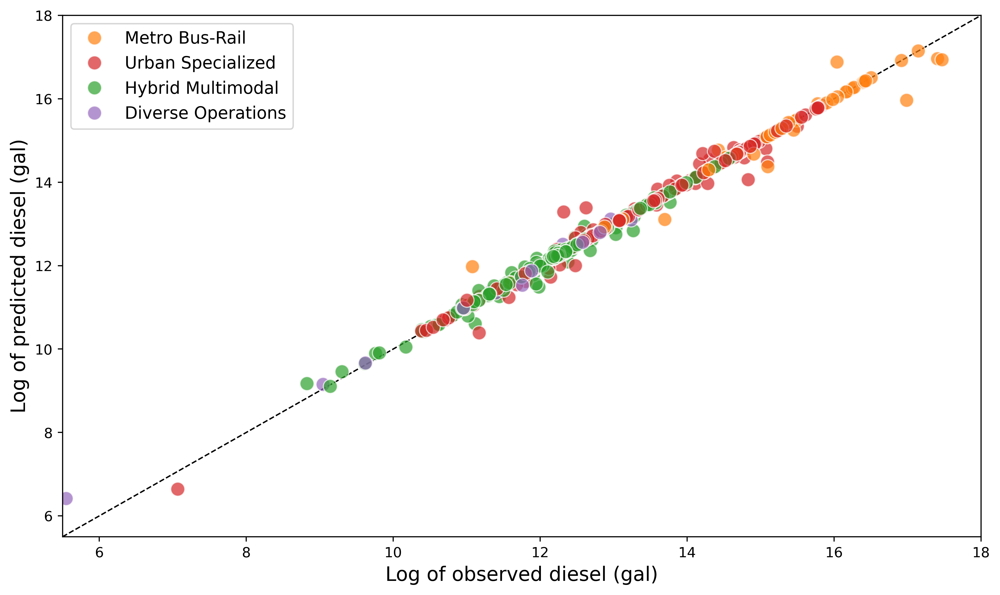

In [42]:
# Make predictions on the full dataset (X_model1)
y_pred_full = xgboost_pipeline1.predict(X_model1)

# Prepare data for plotting
df_model1['y_pred'] = y_pred_full  # Add predictions to the dataframe

# Ensure no negative or zero values before applying log
df_model1 = df_model1[(df_model1['y_pred'] > 0) & (df_model1['total_diesel(gal)'] > 0)]


# Mapping of cluster numbers to names
cluster_names = {
    0: 'Metro Bus-Rail',
#    1: 'Mid-Urban Multimodal',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df_model1['Cluster Name'] = df_model1['Cluster'].map(cluster_names)

# Define the same color palette as in the box plot
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']

## Define color palette corresponding to cluster names
#cluster_colors = {
#    'Metro Bus-Rail': '#ff7f0e',       # Orange
##    'Mid-Sized Urban': '#1f77b4', # Blue
#    'Hybrid Multimodal': '#2ca02c',    # Green
##    'Urban Specialized': '#d62728',    # Red
#    'Diverse Operations': '#9467bd'    # Purple
#}



# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Plot
plt.figure(figsize=(10, 6), dpi=400)
sns.scatterplot(
    x=np.log(df_model1['total_diesel(gal)']),
    y=np.log(df_model1['y_pred']),
    hue=df_model1['Cluster Name'],
    palette=colors,  # Use the same color palette as the box plot
    alpha=0.7,
    s=100,  # Increase the size of the points
    zorder=2
)

# Set the x- and y-limits to be the same
plt.xlim(5.5, 18)  # Adjust limits based on your data range
plt.ylim(5.5, 18)  # Keep the same range for both axes

# Plot the y=x line for reference
plt.plot([5.5, 18], [5.5, 18], color='black', linestyle='--', linewidth=1, zorder=1)

# Add log-log labels and titles
plt.xlabel('Log of observed diesel (gal)', fontsize=14)
plt.ylabel('Log of predicted diesel (gal)', fontsize=14)

# Adjust the legend to be inside the plot at the top left
plt.legend(title='', loc='upper left', fontsize=12)

# Show plot
plt.tight_layout()
plt.show()


In [43]:
df_model1['Cluster Name'].unique()

array(['Metro Bus-Rail', 'Urban Specialized', 'Hybrid Multimodal',
       'Diverse Operations'], dtype=object)

In [44]:
df_model1.loc[df_model1['Cluster']==5]

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name,y_pred


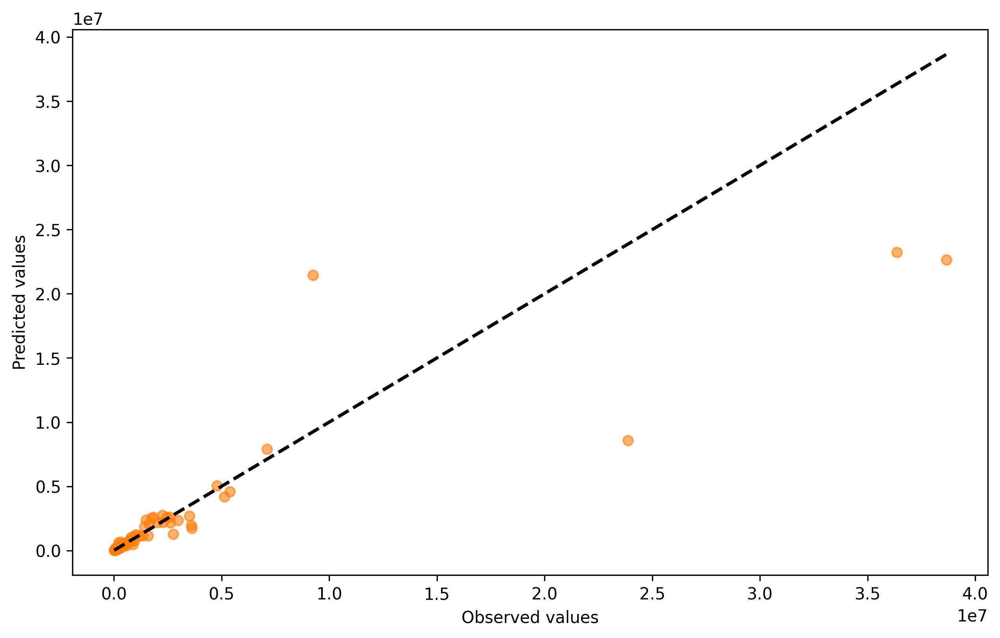

In [45]:
# Scatter plot for actual vs. predicted values
plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(y_test_model1, y_pred_xgb_model1, alpha=0.6)
plt.plot([y_test_model1.min(), y_test_model1.max()], [y_test_model1.min(), y_test_model1.max()], 'k--', lw=2)
plt.xlabel('Observed values')
plt.ylabel('Predicted values')
#plt.title('Actual vs Predicted Values')
plt.show()


In [46]:
### Explore the outlier:

# Calculate the log of observed and predicted values
df_model1['log_observed'] = np.log(df_model1['total_diesel(gal)'])
df_model1['log_predicted'] = np.log(df_model1['y_pred'])

# Calculate the residuals (difference between log-observed and log-predicted)
df_model1['residual'] = np.abs(df_model1['log_observed'] - df_model1['log_predicted'])

# Sort the data by the largest residuals to identify the biggest outliers
outliers = df_model1.sort_values(by='residual', ascending=False)

# Display the top outlier
outliers.head(1)


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name,y_pred,log_observed,log_predicted,residual
1011,50118,1778.0,39319881.0,7261176.0,2337.89,0.0,0.0,0.0,889.0,0.0,...,-0.054463,-0.005704,0,3.287676,8.590058,Metro Bus-Rail,8564667.0,16.988233,15.963156,1.025077


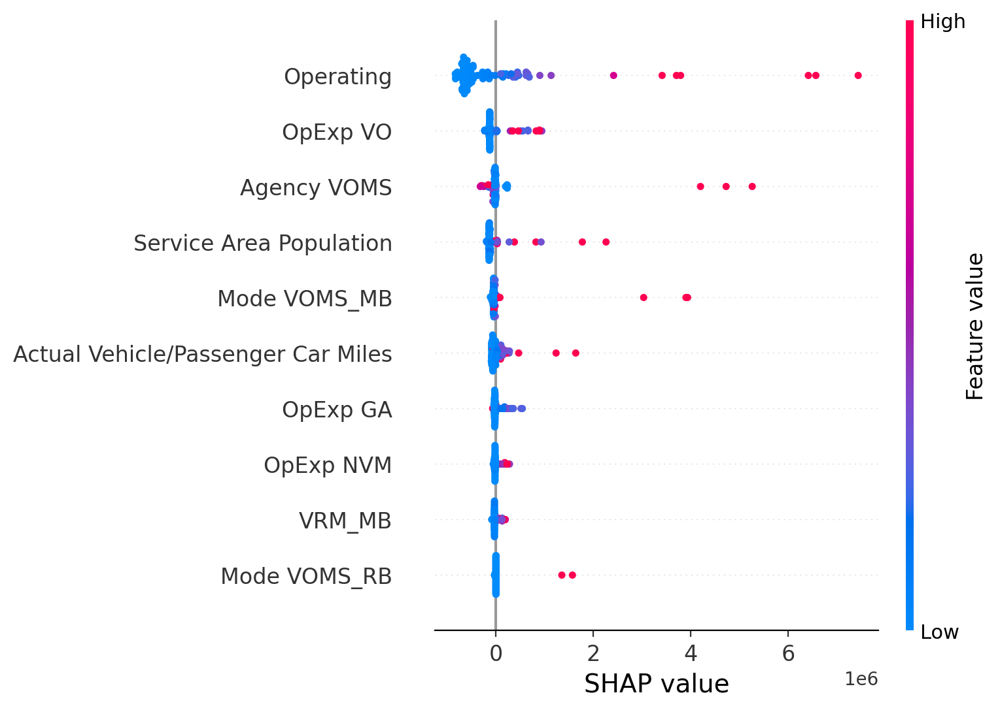

In [47]:
# Calculate the mean absolute SHAP value for each feature to determine feature importance
shap_importance = np.abs(shap_values1.values).mean(axis=0)

# Get the indices of the top 10 most important features
top_10_indices = np.argsort(shap_importance)[-10:]

# Get the corresponding top 10 feature names and SHAP values
top_10_feature_names = [feature_names[i] for i in top_10_indices]
top_10_shap_values = shap_values1[:, top_10_indices]

# Plot the SHAP summary plot for the top 10 features
plt.figure(figsize=(8, 6), dpi=200)
shap.summary_plot(top_10_shap_values, X_test_transformed1[:, top_10_indices], feature_names=top_10_feature_names, show=False)

# Increase the font size of the x-axis and y-axis ticks
plt.xlabel("SHAP value", fontsize=14)  # SHAP value label
plt.xticks(fontsize=12)  # Increase the font size of the x-axis ticks
plt.yticks(fontsize=12)  # Increase the font size of the y-axis ticks (feature names)

plt.show()


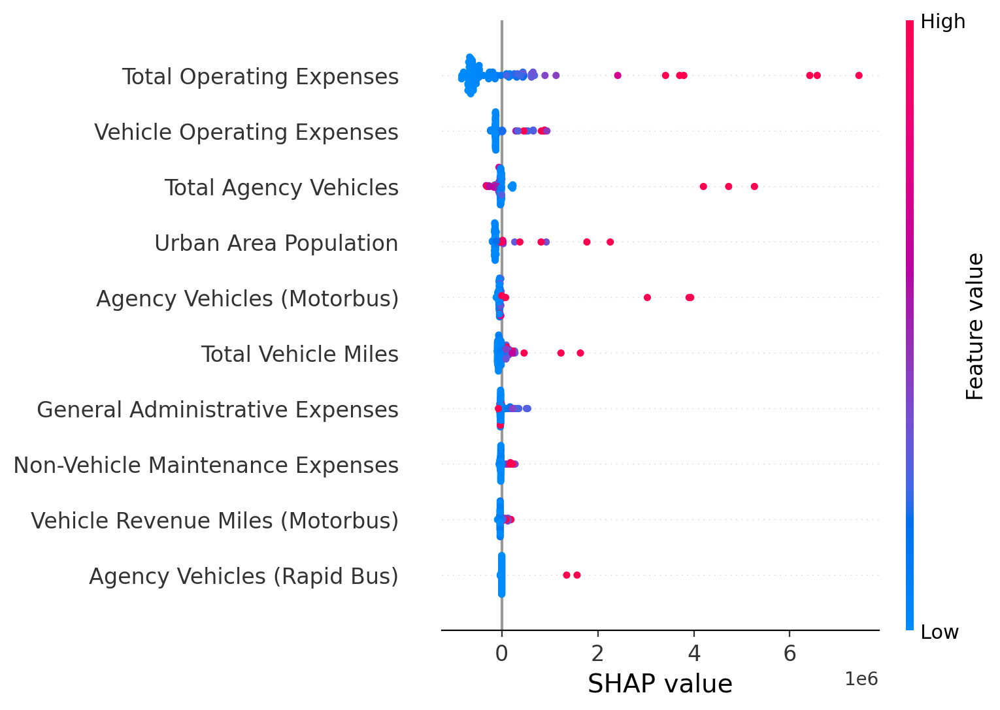

In [48]:
# Define feature name mappings for y-axis labels
feature_name_mappings = {
    'Operating': 'Total Operating Expenses',
    'OpExp VO': 'Vehicle Operating Expenses',
    'Agency VOMS': 'Total Agency Vehicles',
    'Service Area Population': 'Urban Area Population',
    'Mode VOMS_MB': 'Agency Vehicles (Motorbus)',
    'Actual Vehicle/Passenger Car Miles': 'Total Vehicle Miles',
    'OpExp GA': 'General Administrative Expenses',
    'OpExp NVM': 'Non-Vehicle Maintenance Expenses',
    'VRM_MB': 'Vehicle Revenue Miles (Motorbus)',
    'Mode VOMS_RB': 'Agency Vehicles (Rapid Bus)'
}


# Calculate mean absolute SHAP values for each feature
shap_importance = np.abs(shap_values1.values).mean(axis=0)

# Get indices of the top 10 most important features
top_10_indices = np.argsort(shap_importance)[-10:]

# Get the top 10 feature names and their SHAP values
top_10_feature_names = [feature_names[i] for i in top_10_indices]
top_10_feature_names_mapped = [feature_name_mappings.get(name, name) for name in top_10_feature_names]  # Map names if in dictionary
top_10_shap_values = shap_values1[:, top_10_indices]

# Plot SHAP summary plot for top 10 features with custom y-axis labels
plt.figure(figsize=(8, 6), dpi=200)
shap.summary_plot(top_10_shap_values, X_test_transformed1[:, top_10_indices], feature_names=top_10_feature_names_mapped, show=False)

# Customize x and y axis font sizes
plt.xlabel("SHAP value", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()


Text(0.5, 149.4444444444444, 'SHAP value')

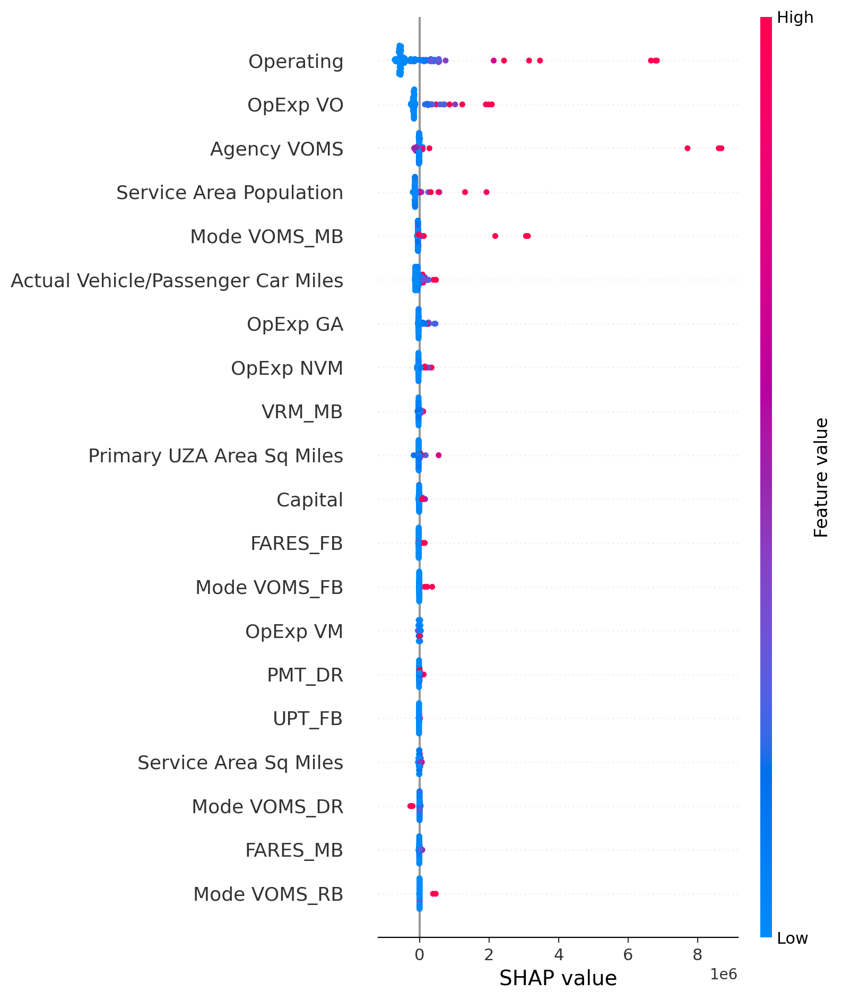

In [49]:
# Get feature names for the transformed data
# Numerical feature names remain the same
numerical_features_transformed = numerical_features

# Get the categorical feature names after encoding
categorical_features_transformed = xgboost_pipeline1.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features)

# Combine both numerical and categorical feature names
feature_names = list(numerical_features_transformed) + list(categorical_features_transformed)

# Transform the training and test data using the pipeline's preprocessor step (without fitting the model)
X_train_transformed1 = xgboost_pipeline1.named_steps['preprocessor'].transform(X_train_model1)
X_test_transformed1 = xgboost_pipeline1.named_steps['preprocessor'].transform(X_test_model1)

# Create a SHAP explainer object for the XGBoost model
explainer1 = shap.Explainer(xgboost_pipeline1.named_steps['model'], X_train_transformed1)

# Calculate SHAP values for the test data
shap_values1 = explainer1(X_test_transformed1)

plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot with proper feature names
shap.summary_plot(shap_values1, X_test_transformed1, feature_names=feature_names, show=False)

plt.xlabel("SHAP value", fontsize=14)


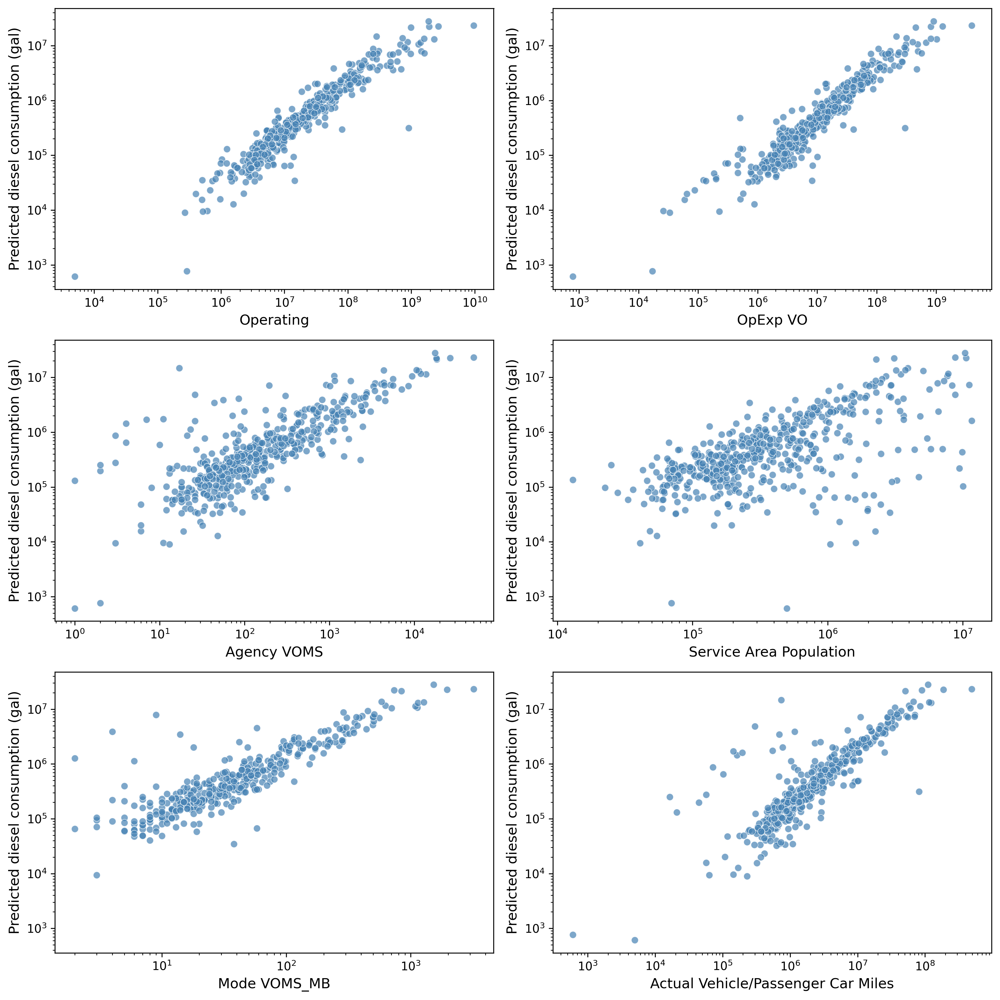

In [50]:
# Get the SHAP values in a DataFrame for easy handling
shap_df = pd.DataFrame(shap_values1.values, columns=feature_names)

# Get the top 4 important features based on SHAP importance
top_features = shap_df.abs().mean().sort_values(ascending=False).head(6).index

# Scatter plot for each top feature against the target (energy consumption)
plt.figure(figsize=(12, 12), dpi=300)

for i, feature in enumerate(top_features):
    plt.subplot(3, 2, i+1)
    sns.scatterplot(x=df_model1[feature], y=df_model1['y_pred'], alpha=0.7, color='steelblue')
    plt.xlabel(f"{feature}", fontsize=12)
    plt.ylabel("Predicted diesel consumption (gal)", fontsize=12)
    #plt.title(f"Scatter plot of {feature} vs Diesel Consumption", fontsize=14)
    
    # Apply log scale to both axes
    plt.xscale('log')
    plt.yscale('log')

plt.tight_layout()
plt.show()


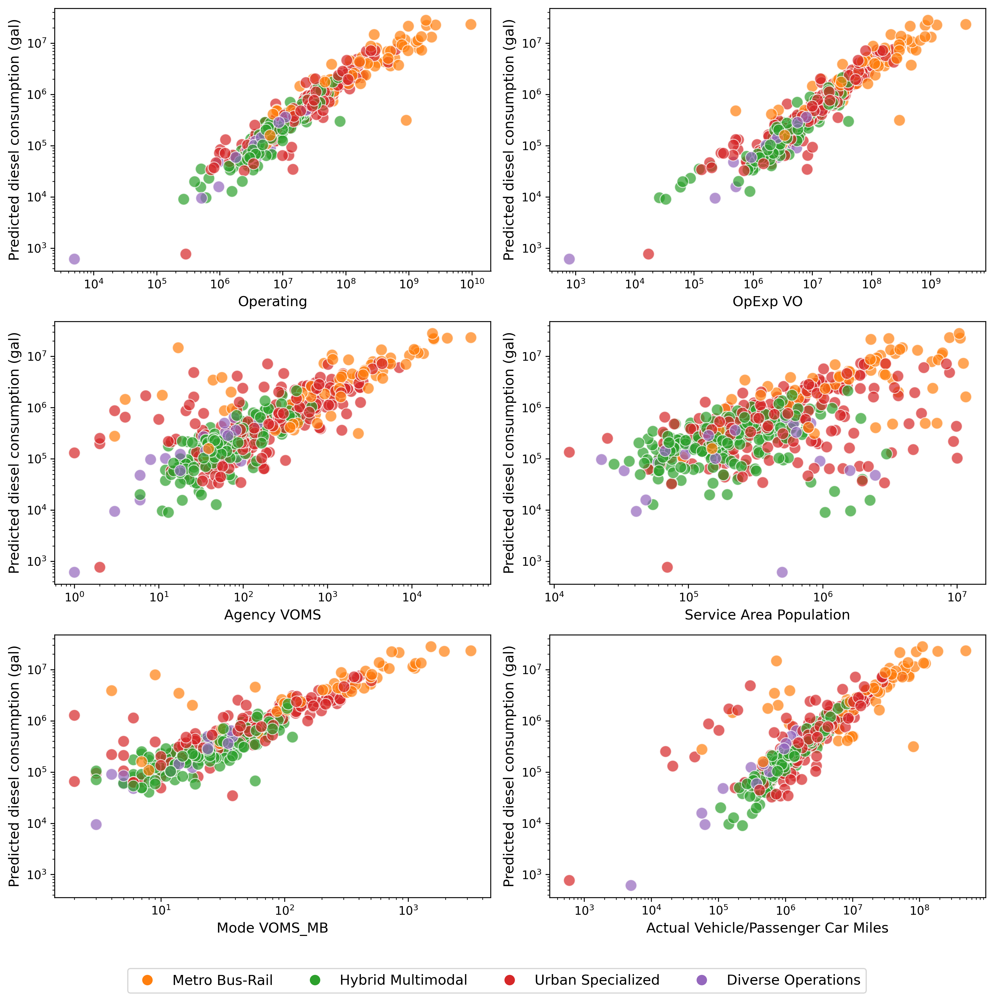

In [51]:
# Mapping of cluster numbers to names (as you have done)
cluster_names = {
    0: 'Metro Bus-Rail',
#    1: 'Mid-Urban Multimodal',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df_model1['Cluster Name'] = df_model1['Cluster'].map(cluster_names)

# Define color palette corresponding to cluster names
cluster_colors = {
    'Metro Bus-Rail': '#ff7f0e',  # Orange
    'Hybrid Multimodal': '#2ca02c',  # Green
    'Urban Specialized': '#d62728',  # Red
    'Diverse Operations': '#9467bd'  # Purple
}

# Assign colors based on cluster names in the dataframe
colors = df_model1['Cluster Name'].map(cluster_colors)

# Scatter plot for each top feature against the target (energy consumption)
plt.figure(figsize=(12, 12), dpi=300)

for i, feature in enumerate(top_features):
    plt.subplot(3, 2, i+1)
    # Use colors based on clusters, but suppress individual legends
    sns.scatterplot(x=df_model1[feature], y=df_model1['y_pred'], alpha=0.7, hue=df_model1['Cluster Name'], 
                    palette=cluster_colors, s=100, legend=False)  # Suppress individual plot legends
    
    plt.xlabel(f"{feature}", fontsize=12)
    plt.ylabel("Predicted diesel consumption (gal)", fontsize=12)
    
    # Apply log scale to both axes
    plt.xscale('log')
    plt.yscale('log')

# Create custom legend once for the entire figure
# Custom legend handles
legend_labels = list(cluster_colors.keys())
legend_colors = list(cluster_colors.values())

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=col, markersize=10) 
           for col in legend_colors]

# Add legend at the bottom of the figure (one row, centered)
plt.figlegend(handles, legend_labels, loc='lower center', ncol=len(legend_labels), fontsize=12)

# Adjust layout to fit the legend
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Adjust the bottom to make room for the legend
plt.show()


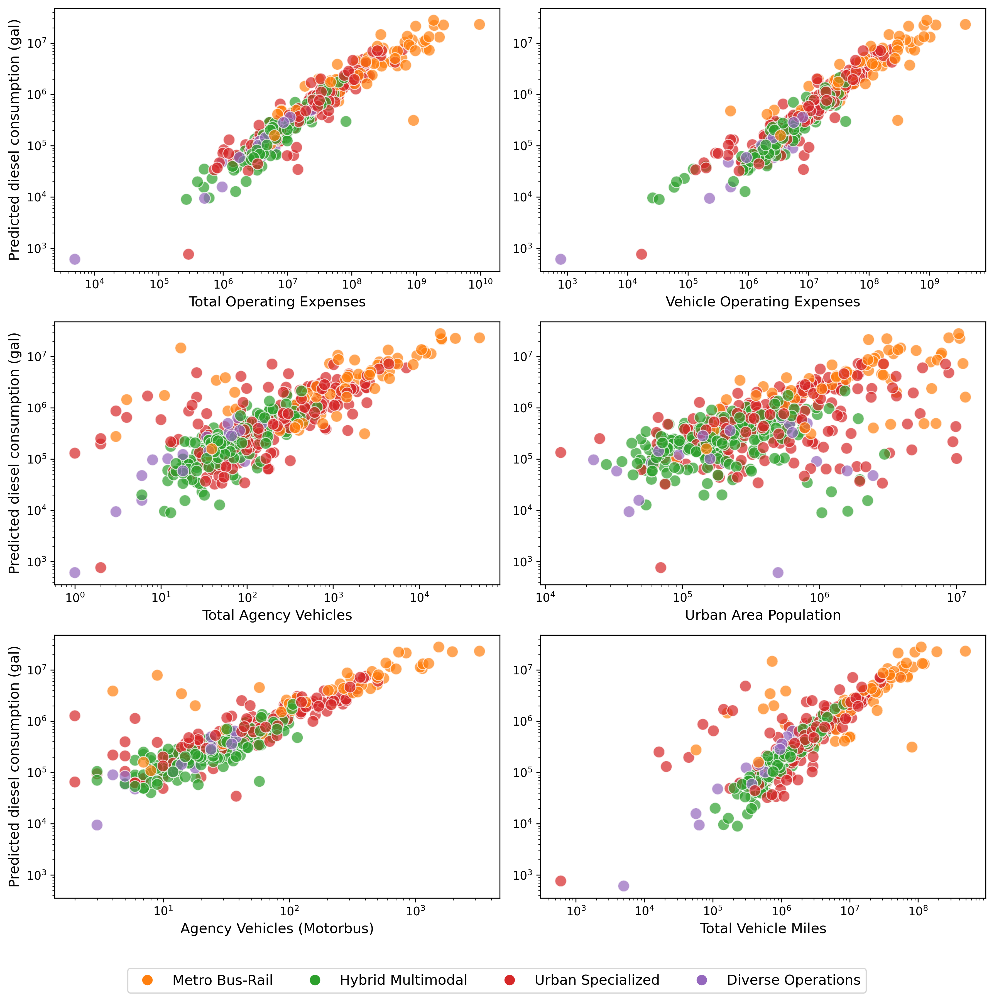

In [52]:
# Updated x-axis label mapping
x_labels = {
    'Operating': 'Total Operating Expenses',
    'OpExp VO': 'Vehicle Operating Expenses',
    'Agency VOMS': 'Total Agency Vehicles',
    'Service Area Population': 'Urban Area Population',
    'Mode VOMS_MB': 'Agency Vehicles (Motorbus)',
    'Actual Vehicle/Passenger Car Miles': 'Total Vehicle Miles'
}

# Map cluster numbers to names
cluster_names = {
    0: 'Metro Bus-Rail',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Define color palette corresponding to cluster names
cluster_colors = {
    'Metro Bus-Rail': '#ff7f0e',  # Orange
    'Hybrid Multimodal': '#2ca02c',   # Red
    'Urban Specialized': '#d62728', # Green
    'Diverse Operations': '#9467bd'  # Purple
}


# Assuming df_model1 and top_features are defined as per your data context

# Map clusters to names and assign colors
df_model1['Cluster Name'] = df_model1['Cluster'].map(cluster_names)
colors = df_model1['Cluster Name'].map(cluster_colors)

# Create the scatter plot for each feature against the target variable
plt.figure(figsize=(12, 12), dpi=300)
for i, feature in enumerate(top_features):
    ax = plt.subplot(3, 2, i+1)
    sns.scatterplot(
        x=df_model1[feature],
        y=df_model1['y_pred'],
        hue=df_model1['Cluster Name'],
        palette=cluster_colors,
        s=100,
        legend=False,
        alpha=0.7
    )
    
    # Apply x-axis label from mapping if exists
    plt.xlabel(x_labels.get(feature, feature), fontsize=12)
    
    # Remove y-axis labels and ticks from right-side plots
    if i % 2 == 0:
        plt.ylabel("Predicted diesel consumption (gal)", fontsize=12)
    else:
        plt.ylabel("")  # Remove y-axis label for right-side plots
        ax.set_yticks([])  # Set y-ticks to an empty list for right-side plots
    
    # Set log scale for both axes
    plt.xscale('log')
    plt.yscale('log')

# Create a custom legend at the bottom of the figure
legend_labels = list(cluster_colors.keys())
legend_colors = list(cluster_colors.values())
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=col, markersize=10) for col in legend_colors]
plt.figlegend(handles, legend_labels, loc='lower center', ncol=len(legend_labels), fontsize=12)

# Adjust layout to fit the legend
plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()


### Predict the energy for all transit agency using the best model

In [53]:
df_all

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
3,4,10.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,0.0,...,-0.029473,-0.033120,-0.010230,-0.022373,0.005070,0.113705,0.062222,0.042510,0.036662,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,-0.026031,-0.020982,-0.008634,0.013648,0.000441,-0.001489,-0.004645,0.003926,0.002403,1
2201,99442,22.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,...,-0.004121,-0.011112,-0.010444,0.037352,0.008943,0.006808,0.035971,-0.035651,-0.001554,1
2202,99452,1.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,1.0,...,-0.009811,-0.012703,-0.010356,0.036326,0.009249,0.006531,0.035939,-0.036598,-0.001457,1
2203,99453,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,2.0,...,-0.023657,-0.018853,-0.007855,0.012265,0.000470,-0.001496,-0.004490,0.003510,0.002307,1


In [54]:
# Find the columns that are in df_complete but not in df
extra_columns = df_all.columns.difference(df.columns)

# Drop the additional columns from df_complete
df_all_trimmed = df_all.drop(columns=extra_columns)

# Display the modified dataframe
df_all


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
3,4,10.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,0.0,...,-0.029473,-0.033120,-0.010230,-0.022373,0.005070,0.113705,0.062222,0.042510,0.036662,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,-0.026031,-0.020982,-0.008634,0.013648,0.000441,-0.001489,-0.004645,0.003926,0.002403,1
2201,99442,22.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,...,-0.004121,-0.011112,-0.010444,0.037352,0.008943,0.006808,0.035971,-0.035651,-0.001554,1
2202,99452,1.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,1.0,...,-0.009811,-0.012703,-0.010356,0.036326,0.009249,0.006531,0.035939,-0.036598,-0.001457,1
2203,99453,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,2.0,...,-0.023657,-0.018853,-0.007855,0.012265,0.000470,-0.001496,-0.004490,0.003510,0.002307,1


In [55]:
df

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC7,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0,4.046211,7.773562,Metro Bus-Rail
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3,3.493069,0.551362,Urban Specialized
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3,2.838323,0.410315,Urban Specialized
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2,2.611268,6.380551,Hybrid Multimodal
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3,2.038247,0.000000,Urban Specialized
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0,0.431131,0.000000,Metro Bus-Rail
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0,0.499378,0.000000,Metro Bus-Rail
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4,1.646274,0.000000,Diverse Operations
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4,2.053929,0.000000,Diverse Operations


In [56]:
# Strip leading/trailing spaces from column names in both dataframes
df_all.columns = df_all.columns.str.strip()
df.columns = df.columns.str.strip()

# Find the columns that are in df_all but not in df
extra_columns = df_all.columns.difference(df.columns)

# Print the extra columns to check the differences
print("Extra columns:", extra_columns)

# Drop the additional columns from df_all
df_all_trimmed = df_all.drop(columns=extra_columns)

# Display the modified dataframe
df_all_trimmed


Extra columns: Index(['Total Employees', 'Total Operating Hours'], dtype='object')


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
3,4,10.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,0.0,...,-0.029473,-0.033120,-0.010230,-0.022373,0.005070,0.113705,0.062222,0.042510,0.036662,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,-0.026031,-0.020982,-0.008634,0.013648,0.000441,-0.001489,-0.004645,0.003926,0.002403,1
2201,99442,22.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,5.0,...,-0.004121,-0.011112,-0.010444,0.037352,0.008943,0.006808,0.035971,-0.035651,-0.001554,1
2202,99452,1.0,0.0,NaN,0.00,0.0,0.0,0.0,0.0,1.0,...,-0.009811,-0.012703,-0.010356,0.036326,0.009249,0.006531,0.035939,-0.036598,-0.001457,1
2203,99453,2.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,2.0,...,-0.023657,-0.018853,-0.007855,0.012265,0.000470,-0.001496,-0.004490,0.003510,0.002307,1


In [57]:
# Fill NAN values in df_all_trimmed with zero
df_all_trimmed = df_all_trimmed.fillna(0)
df_all_trimmed

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Cluster
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.004643,-0.034000,-0.032924,-0.037869,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,0.079114,-0.154299,0.124937,0.223711,-0.060014,0.042044,0.011579,0.008407,0.016438,3
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.059251,-0.059665,0.702281,0.196466,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3
3,4,10.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,-0.029473,-0.033120,-0.010230,-0.022373,0.005070,0.113705,0.062222,0.042510,0.036662,3
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.001985,-0.028263,0.016044,-0.078176,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,-0.026031,-0.020982,-0.008634,0.013648,0.000441,-0.001489,-0.004645,0.003926,0.002403,1
2201,99442,22.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,5.0,...,-0.004121,-0.011112,-0.010444,0.037352,0.008943,0.006808,0.035971,-0.035651,-0.001554,1
2202,99452,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0,...,-0.009811,-0.012703,-0.010356,0.036326,0.009249,0.006531,0.035939,-0.036598,-0.001457,1
2203,99453,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,2.0,...,-0.023657,-0.018853,-0.007855,0.012265,0.000470,-0.001496,-0.004490,0.003510,0.002307,1


In [58]:
# Calculate per capita values
df_all_trimmed['Diesel Consumption per Capita'] = df_all_trimmed['total_diesel(gal)'] / df_all_trimmed['Service Area Pop']
df_all_trimmed['Electricity Consumption per Capita'] = df_all_trimmed['total_kWh'] / df_all_trimmed['Service Area Pop']

# Define the mapping of clusters to names
cluster_names = {
    0: 'Metro Bus-Rail',
    1: 'Mid-Sized Urban',
    2: 'Hybrid Multimodal',
    3: 'Urban Specialized',
    4: 'Diverse Operations'
}

# Map the clusters to names
df_all_trimmed['Cluster Name'] = df_all_trimmed['Cluster'].map(cluster_names)

In [59]:
# Define the columns to exclude
columns_to_exclude = ['total_kWh', 'total_diesel(gal)', 'NTD ID', 'City', 'State', 'UZA', 'Latitude', 'Longitude', 'Diesel Consumption per Capita', 'Diesel Consumption per Capita', 'Cluster', 'PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12']

# Select features (X) and target variables (y)
X_all_trimmed = df_all_trimmed.drop(columns=columns_to_exclude)
X_all_trimmed

,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,Mode VOMS_FB,...,Days of Service Operated,Days Not Operated Due to Emergencies,Non-Statutory Mixed Traffic,DRM Mixed Traffic ROW,Service Area Sq Miles,Service Area Pop,Operating,Capital,Electricity Consumption per Capita,Cluster Name
0,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,2.0,...,2896.0,0.0,0.0,1299.03,2134.0,2287050.0,984364098.0,164646549.0,7.773562,Metro Bus-Rail
1,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,0.0,...,1349.0,0.0,0.0,958.10,248.0,459007.0,94356558.0,40289227.0,0.551362,Urban Specialized
2,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,0.0,...,1350.0,0.0,0.0,499.74,292.0,575963.0,142722484.0,45755527.0,0.410315,Urban Specialized
3,10.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.00,0.0,0.0,1490917.0,0.0,NaN,Urban Specialized
4,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,0.0,...,722.0,0.0,0.0,118.40,34.0,110629.0,23789684.0,945068.0,6.380551,Hybrid Multimodal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,208973.0,0.0,NaN,Mid-Sized Urban
2201,22.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,1143254.0,72083.0,NaN,Mid-Sized Urban
2202,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,28844.0,0.0,NaN,Mid-Sized Urban
2203,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,128375.0,0.0,NaN,Mid-Sized Urban


In [60]:
# Identify categorical and numerical columns
categorical_features = ['Cluster Name']  
numerical_features = [col for col in X_all_trimmed.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [61]:
# Extract the features (X) from df_all_trimmed
X_all_trimmed = df_all_trimmed[numerical_features + categorical_features]

# Use the trained pipeline to predict diesel consumption for the entire dataset
df_all_trimmed['predicted_diesel'] = xgboost_pipeline1.predict(X_all_trimmed)

# Display the first few rows to confirm the new column
df_all_trimmed.head()


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name,predicted_diesel
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,-0.008939,-0.010514,-0.021933,-0.045833,-0.031461,0,4.046211,7.773562,Metro Bus-Rail,2.144563e+07
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,-0.060014,0.042044,0.011579,0.008407,0.016438,3,3.493069,0.551362,Urban Specialized,1.607244e+06
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,-0.048377,0.038672,-0.001234,-0.010424,-0.001315,3,2.838323,0.410315,Urban Specialized,2.068638e+06
3,4,10.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.005070,0.113705,0.062222,0.042510,0.036662,3,NaN,NaN,Urban Specialized,1.650525e+04
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,-0.010599,-0.016816,-0.016438,0.007552,-0.013636,2,2.611268,6.380551,Hybrid Multimodal,2.896811e+05


In [62]:
df_all_trimmed['predicted_diesel'].sum()

735767740.0

In [63]:
df_all_trimmed['Cluster Name'].value_counts()


Cluster Name
Mid-Sized Urban       1286
Hybrid Multimodal      317
Diverse Operations     268
Urban Specialized      251
Metro Bus-Rail          83
Name: count, dtype: int64

In [64]:
df_all_trimmed['Cluster Name'].value_counts().sum()


2205

In [65]:
df_all_trimmed.groupby('Cluster Name')['Primary UZA Area Sq Miles'].sum()


Cluster Name
Diverse Operations    219349.03
Hybrid Multimodal      64758.52
Metro Bus-Rail         75758.34
Mid-Sized Urban        52998.07
Urban Specialized     193618.27
Name: Primary UZA Area Sq Miles, dtype: float64

In [66]:
df_all_trimmed.groupby('Cluster Name')['Primary UZA Area Sq Miles'].mean()


Cluster Name
Diverse Operations    818.466530
Hybrid Multimodal     204.285552
Metro Bus-Rail        912.751084
Mid-Sized Urban        41.211563
Urban Specialized     771.387530
Name: Primary UZA Area Sq Miles, dtype: float64

In [67]:
df_all_trimmed.groupby('Cluster Name')['Service Area Population'].sum()


Cluster Name
Diverse Operations     28623119.0
Hybrid Multimodal      83089480.0
Metro Bus-Rail        190212588.0
Mid-Sized Urban        45041727.0
Urban Specialized     218842925.0
Name: Service Area Population, dtype: float64

In [68]:
df_all_trimmed.groupby('Cluster Name')['Service Area Population'].mean()

Cluster Name
Diverse Operations    1.068027e+05
Hybrid Multimodal     2.621119e+05
Metro Bus-Rail        2.291718e+06
Mid-Sized Urban       3.502467e+04
Urban Specialized     8.718842e+05
Name: Service Area Population, dtype: float64

In [69]:
df_all_trimmed.groupby('Cluster Name')['Actual Vehicle/Passenger Car Miles'].sum()


Cluster Name
Diverse Operations    1.637787e+07
Hybrid Multimodal     3.924090e+08
Metro Bus-Rail        2.501361e+09
Mid-Sized Urban       0.000000e+00
Urban Specialized     1.074167e+09
Name: Actual Vehicle/Passenger Car Miles, dtype: float64

In [70]:
df_all_trimmed.groupby('Cluster Name')['OpExp VO'].sum()


Cluster Name
Diverse Operations    1.032100e+08
Hybrid Multimodal     1.737686e+09
Metro Bus-Rail        1.765502e+10
Mid-Sized Urban       0.000000e+00
Urban Specialized     5.532579e+09
Name: OpExp VO, dtype: float64

In [71]:
df_all_trimmed.groupby('Cluster Name')['Agency VOMS'].sum()


Cluster Name
Diverse Operations      6663.0
Hybrid Multimodal      30920.0
Metro Bus-Rail        282121.0
Mid-Sized Urban        20449.0
Urban Specialized     107305.0
Name: Agency VOMS, dtype: float64

In [72]:
df_all_trimmed.groupby('Cluster Name')['Agency VOMS'].mean()


Cluster Name
Diverse Operations      24.861940
Hybrid Multimodal       97.539432
Metro Bus-Rail        3399.048193
Mid-Sized Urban         15.901244
Urban Specialized      427.509960
Name: Agency VOMS, dtype: float64

In [73]:
df_all_trimmed.columns
#for col in df_all_trimmed.columns:
#    print(col)

Index(['NTD ID', 'Agency VOMS', 'Actual Vehicle/Passenger Car Miles',
       'Service Area Population', 'Primary UZA Area Sq Miles', 'Mode VOMS_AR',
       'Mode VOMS_CB', 'Mode VOMS_CC', 'Mode VOMS_CR', 'Mode VOMS_DR',
       ...
       'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'Cluster',
       'Diesel Consumption per Capita', 'Electricity Consumption per Capita',
       'Cluster Name', 'predicted_diesel'],
      dtype='object', length=190)

In [74]:
df_all_trimmed.groupby('Cluster Name')['Actual Vehicle/Passenger Car Miles'].mean()

Cluster Name
Diverse Operations    6.111146e+04
Hybrid Multimodal     1.237883e+06
Metro Bus-Rail        3.013687e+07
Mid-Sized Urban       0.000000e+00
Urban Specialized     4.279548e+06
Name: Actual Vehicle/Passenger Car Miles, dtype: float64

In [75]:
df_all_trimmed.loc[df_all_trimmed['City']=='Albany']

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name,predicted_diesel
47,61,30.0,0.0,50724.0,23.05,0.0,0.0,0.0,0.0,9.0,...,-0.004821,-0.003115,-0.023415,0.036993,-0.001021,4,0.000000,0.00000,Diverse Operations,2.482739e+04
237,20002,1615.0,13708198.0,511949.0,271.30,0.0,6.0,0.0,0.0,62.0,...,0.462050,0.008241,-0.010044,0.023877,0.052826,3,5.028499,0.05355,Urban Specialized,2.586501e+06


## Emissions prediction (from diesel)

In [76]:
df_all_trimmed['kgco2']=df_all_trimmed['predicted_diesel']* 10.25 # 10.21 only from CO2 and 10.25 considering CH4 and N2O

In [77]:
#df_all_trimmed['kgCH4']=df_all_trimmed['predicted_diesel']*0.0000323

In [78]:
#df_all_trimmed['kgCH4'].sum()

In [79]:
#df_all_trimmed['kgN2O']=df_all_trimmed['predicted_diesel']*0.00014654

In [80]:
#df_all_trimmed['kgN2O'].sum()

In [81]:
#df_all_trimmed['kgCH4_to_kgco2']=df_all_trimmed['kgCH4']*28

In [82]:
#df_all_trimmed['kgN2O_to_kgco2']=df_all_trimmed['kgN2O']*265

In [83]:
#df_all_trimmed['kgco2_total'] = df_all_trimmed['kgco2'] + df_all_trimmed['kgCH4_to_kgco2'] + df_all_trimmed['kgN2O_to_kgco2']

In [84]:
df_all_trimmed['kgco2'].sum()

7541619700.0

In [85]:
#df_all_trimmed['kgco2_total'].sum()

In [86]:
df_all_trimmed['WTT_kgco2']=df_all_trimmed['predicted_diesel']* 2.03 

In [87]:
df_all_trimmed['WTT_kgco2'].sum()

1493608600.0

In [88]:
df_all_trimmed['kgco2_WTW'] = df_all_trimmed['kgco2'] + df_all_trimmed['WTT_kgco2']

In [89]:
df_all_trimmed['kgco2_WTW'].sum()

9035229000.0

In [90]:
df_all_trimmed.columns

Index(['NTD ID', 'Agency VOMS', 'Actual Vehicle/Passenger Car Miles',
       'Service Area Population', 'Primary UZA Area Sq Miles', 'Mode VOMS_AR',
       'Mode VOMS_CB', 'Mode VOMS_CC', 'Mode VOMS_CR', 'Mode VOMS_DR',
       ...
       'PC11', 'PC12', 'Cluster', 'Diesel Consumption per Capita',
       'Electricity Consumption per Capita', 'Cluster Name',
       'predicted_diesel', 'kgco2', 'WTT_kgco2', 'kgco2_WTW'],
      dtype='object', length=193)

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\966004435.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='predicted_diesel', data=df_all_trimmed, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\966004435.py:13: UserWarning: 
The palette list has fewer values (4) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(y='Cluster Name', x='predicted_diesel', data=df_all_trimmed, ax=axes[0], palette=colors)
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_10064\966004435.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='Cluster Name', x='kgco2', data=df_all_trimmed, ax=axes[1], palette=colors)
C:\Users

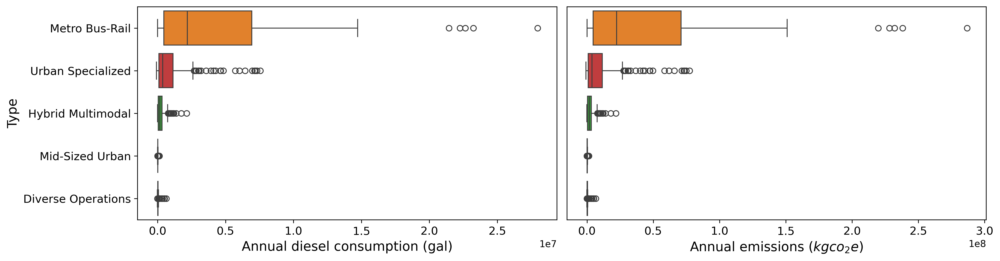

In [91]:
# Define the colors for the clusters
colors = ['#ff7f0e', '#d62728', '#2ca02c', '#9467bd']

discrete_cmap = ListedColormap(colors)

# Set the color palette to match the clusters
sns.set_palette(sns.color_palette(colors))

# Create horizontal box plots
fig, axes = plt.subplots(1, 2, figsize=(15, 4), dpi=300)

# Boxplot for Diesel Consumption per Capita
sns.boxplot(y='Cluster Name', x='predicted_diesel', data=df_all_trimmed, ax=axes[0], palette=colors)
axes[0].set_xlabel('Annual diesel consumption (gal)', fontsize=14)
axes[0].tick_params(axis='both', which='major', labelsize=12)
axes[0].set_ylabel('Type', fontsize=14)
plt.setp(axes[0].get_yticklabels(), rotation=0, ha="right", fontsize=12)

# Boxplot for Electricity Consumption per Capita
sns.boxplot(y='Cluster Name', x='kgco2', data=df_all_trimmed, ax=axes[1], palette=colors)
axes[1].set_xlabel('Annual emissions ($kgco_2e$)', fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=12)
axes[1].set_ylabel('', fontsize=14)
axes[1].set_yticklabels([])
axes[1].set_yticks([])

plt.tight_layout()
plt.show()


In [92]:
aggregated_data2 = df_all_trimmed.groupby('Cluster Name')[['predicted_diesel', 'kgco2_WTW', 'Service Area Population']].sum().reset_index()
aggregated_data2

,Cluster Name,predicted_diesel,kgco2_WTW,Service Area Population
0,Diverse Operations,9675238.0,1.188119e+08,28623119.0
1,Hybrid Multimodal,76618184.0,9.408713e+08,83089480.0
2,Metro Bus-Rail,388901472.0,4.775710e+09,190212588.0
3,Mid-Sized Urban,20808744.0,2.555314e+08,45041727.0
4,Urban Specialized,239764160.0,2.944304e+09,218842925.0


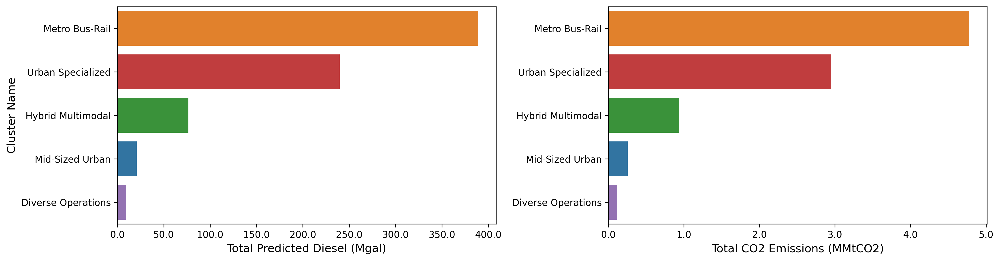

In [93]:
# Sort the aggregated data by predicted_diesel in descending order
aggregated_data2 = aggregated_data2.sort_values(by='predicted_diesel', ascending=False)

cluster_colors = {
    'Metro Bus-Rail': '#ff7f0e',   # Orange
    'Hybrid Multimodal': '#2ca02c', # Green 
    'Urban Specialized': '#d62728', # Red
    'Diverse Operations': '#9467bd', # Purple
    'Mid-Sized Urban': '#1f77b4' # Blue,
}

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 4), dpi=300)

# Bar plot for total predicted diesel
sns.barplot(
    y='Cluster Name', 
    x='predicted_diesel', 
    data=aggregated_data2, 
    ax=axes[0], 
    hue='Cluster Name',
    palette=cluster_colors
)

#axes[0].set_title('Total Predicted Diesel Consumption', fontsize=14)
axes[0].set_xlabel('Total Predicted Diesel (Mgal)', fontsize=12)
axes[0].set_ylabel('Cluster Name', fontsize=12)
axes[0].tick_params(axis='both', which='major', labelsize=10)

# Adjust x-axis labels to show values in Mgal
axes[0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.1f}'))

# Bar plot for total CO2 emissions
sns.barplot(
    y='Cluster Name', 
    x='kgco2_WTW', 
    data=aggregated_data2, 
    ax=axes[1], 
    hue='Cluster Name',  # Assigning hue
    palette=cluster_colors
)
#axes[1].set_title('Total CO2 Emissions', fontsize=14)
axes[1].set_xlabel('Total CO2 Emissions (MMtCO2)', fontsize=12)
axes[1].set_ylabel('', fontsize=12)
axes[1].tick_params(axis='both', which='major', labelsize=10)

# Adjust x-axis labels to show values in MMtCO2
axes[1].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000_000:.1f}'))

plt.tight_layout()
plt.show()


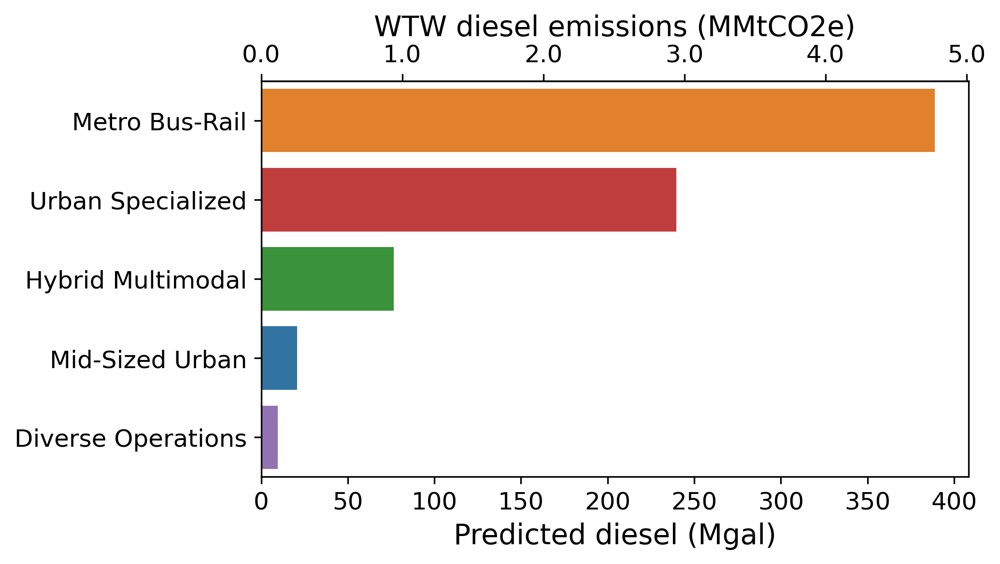

In [94]:
# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Bar plot for total predicted diesel (primary x-axis)
sns.barplot(
    y='Cluster Name', 
    x='predicted_diesel', 
    data=aggregated_data2, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors
)

# Adjust diesel x-axis labels (primary x-axis)
ax.set_xlabel('Predicted diesel (Mgal)', fontsize=14)
ax.set_ylabel('', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.0f}'))

aggregated_data2['toneco2_WTW'] = aggregated_data2['kgco2_WTW'] / 1000


# Compute the scale factor for CO2 emissions
scale_factor = aggregated_data2['toneco2_WTW'].sum() / aggregated_data2['predicted_diesel'].sum()

# Create secondary x-axis for CO2 emissions
secax = ax.secondary_xaxis(
    'top', 
    functions=(
        lambda x: x * scale_factor,  # Scale diesel to CO2 emissions
        lambda x: x / scale_factor   # Inverse scale
    )
)
#secax.set_xlabel('Predicted CO2 emissions (MMtCO2)', fontsize=14)
secax.set_xlabel('WTW diesel emissions (MMtCO2e)', fontsize=14)

secax.tick_params(axis='x', labelsize=12)

# Format the secondary axis tick labels
secax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.1f}'))

# Add legend outside the plot if needed
# ax.legend(title='Cluster Name', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


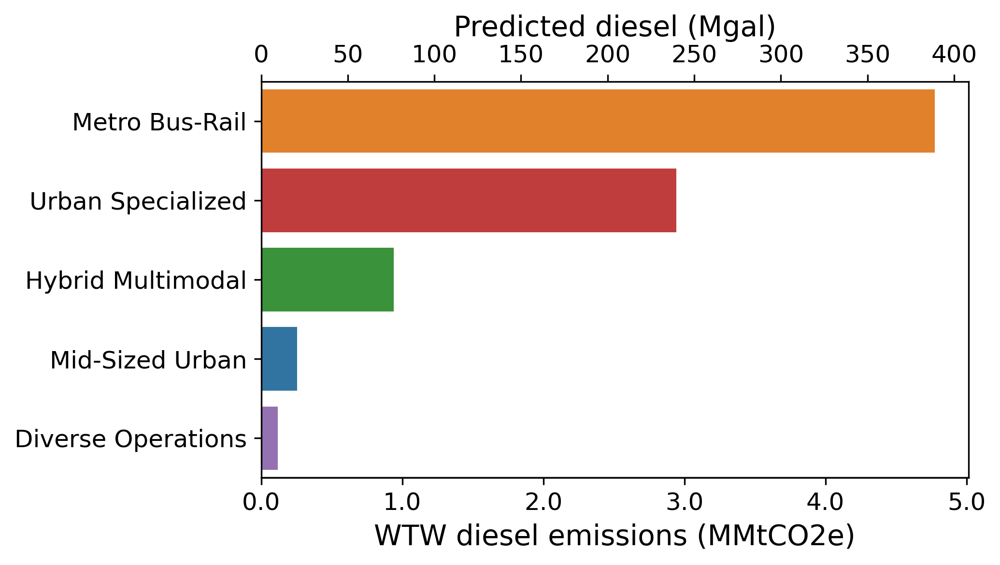

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Bar plot for total predicted diesel (now the secondary x-axis)
sns.barplot(
    y='Cluster Name', 
    x='predicted_diesel', 
    data=aggregated_data2, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors
)

# Move primary x-axis (diesel) to the top
ax.xaxis.set_label_position('top')  # Move label to the top
ax.xaxis.tick_top()  # Move ticks to the top
ax.set_xlabel('Predicted diesel (Mgal)', fontsize=14)
ax.set_ylabel('', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.0f}'))

aggregated_data2['toneco2_WTW'] = aggregated_data2['kgco2_WTW'] / 1000

# Compute the scale factor for CO2 emissions
scale_factor = aggregated_data2['toneco2_WTW'].sum() / aggregated_data2['predicted_diesel'].sum()

# Create secondary x-axis for CO2 emissions at the bottom
secax = ax.secondary_xaxis(
    'bottom',  # Move secondary axis to bottom
    functions=(
        lambda x: x * scale_factor,  # Scale diesel to CO2 emissions
        lambda x: x / scale_factor   # Inverse scale
    )
)
secax.set_xlabel('WTW diesel emissions (MMtCO2e)', fontsize=14)
secax.tick_params(axis='x', labelsize=12)

# Format the secondary axis tick labels
secax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.1f}'))

plt.tight_layout()
plt.show()


In [96]:
aggregated_data2['toneco2_per_capita'] = aggregated_data2['toneco2_WTW'] / aggregated_data2['Service Area Population']

aggregated_data2['predicted_diesel_per_capita'] = aggregated_data2['predicted_diesel'] / aggregated_data2['Service Area Population']

In [97]:
aggregated_data2

,Cluster Name,predicted_diesel,kgco2_WTW,Service Area Population,toneco2_WTW,toneco2_per_capita,predicted_diesel_per_capita
2,Metro Bus-Rail,388901472.0,4.775710e+09,190212588.0,4.775710e+06,0.025107,2.044562
4,Urban Specialized,239764160.0,2.944304e+09,218842925.0,2.944304e+06,0.013454,1.095599
1,Hybrid Multimodal,76618184.0,9.408713e+08,83089480.0,9.408713e+05,0.011324,0.922117
3,Mid-Sized Urban,20808744.0,2.555314e+08,45041727.0,2.555314e+05,0.005673,0.461988
0,Diverse Operations,9675238.0,1.188119e+08,28623119.0,1.188119e+05,0.004151,0.338022


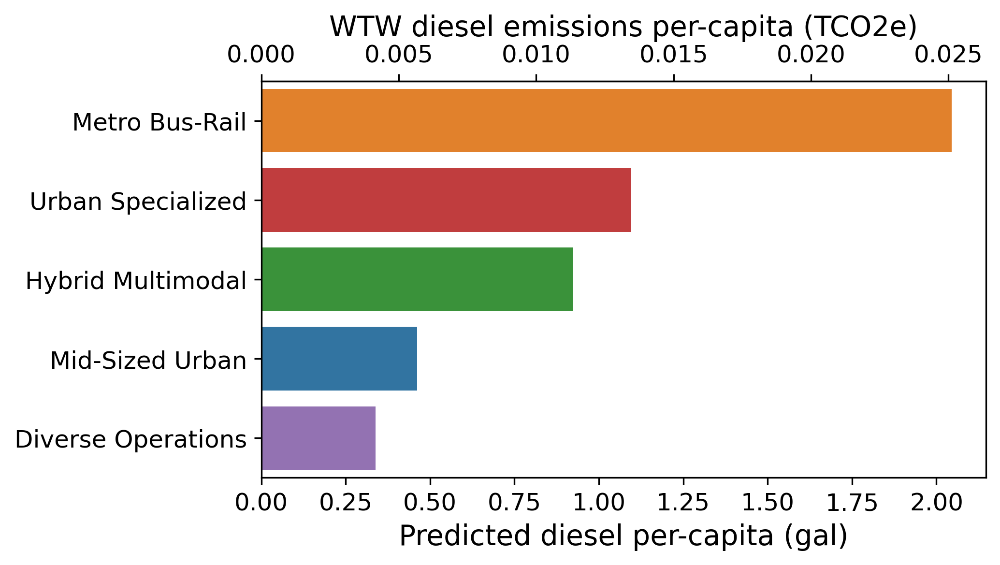

In [98]:
# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Bar plot for total predicted diesel (primary x-axis)
sns.barplot(
    y='Cluster Name', 
    x='predicted_diesel_per_capita', 
    data=aggregated_data2, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors
)

# Adjust diesel x-axis labels (primary x-axis)
ax.set_xlabel('Predicted diesel per-capita (gal)', fontsize=14)
ax.set_ylabel('', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=12)
#ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.0f}'))

# Compute the scale factor for CO2 emissions
scale_factor = aggregated_data2['toneco2_per_capita'].sum() / aggregated_data2['predicted_diesel_per_capita'].sum()

# Create secondary x-axis for CO2 emissions
secax = ax.secondary_xaxis(
    'top', 
    functions=(
        lambda x: x * scale_factor,  # Scale diesel to CO2 emissions
        lambda x: x / scale_factor   # Inverse scale
    )
)
#secax.set_xlabel('Predicted CO2 emissions per-capita (TCO2)', fontsize=14)
secax.set_xlabel('WTW diesel emissions per-capita (TCO2e)', fontsize=14)

secax.tick_params(axis='x', labelsize=12)

# Format the secondary axis tick labels with three decimals
secax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))

# Format the secondary axis tick labels
#secax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000_000:.1f}'))

# Add legend outside the plot if needed
# ax.legend(title='Cluster Name', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()


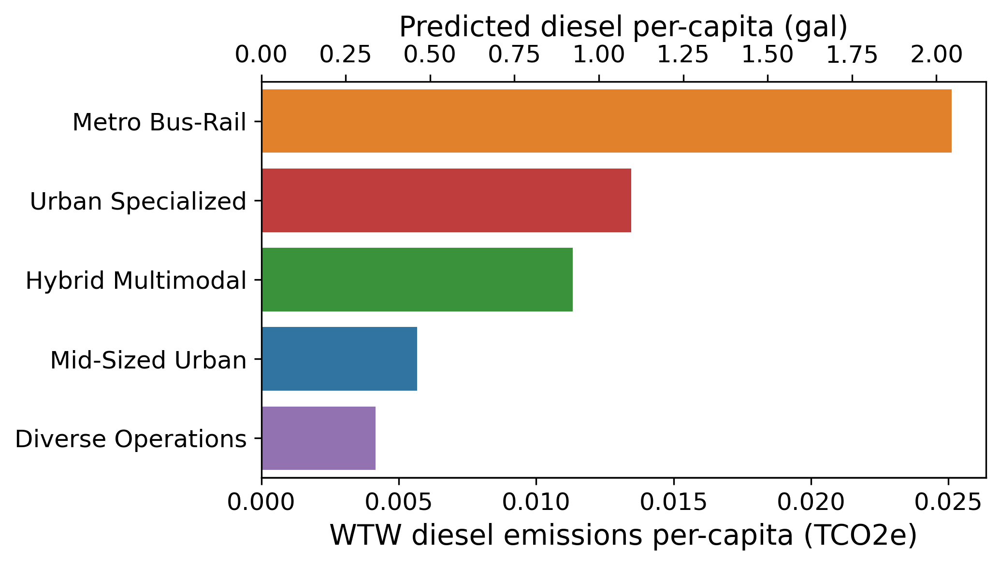

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Bar plot for total predicted diesel (now the secondary x-axis)
sns.barplot(
    y='Cluster Name', 
    x='predicted_diesel_per_capita', 
    data=aggregated_data2, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors
)

# Move primary x-axis (diesel) to the top
ax.xaxis.set_label_position('top')  # Move label to the top
ax.xaxis.tick_top()  # Move ticks to the top
ax.set_xlabel('Predicted diesel per-capita (gal)', fontsize=14)
ax.set_ylabel('', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=12)

# Compute the scale factor for CO2 emissions
scale_factor = aggregated_data2['toneco2_per_capita'].sum() / aggregated_data2['predicted_diesel_per_capita'].sum()

# Create secondary x-axis for CO2 emissions at the bottom
secax = ax.secondary_xaxis(
    'bottom',  # Move secondary axis to bottom
    functions=(
        lambda x: x * scale_factor,  # Scale diesel to CO2 emissions
        lambda x: x / scale_factor   # Inverse scale
    )
)
secax.set_xlabel('WTW diesel emissions per-capita (TCO2e)', fontsize=14)
secax.tick_params(axis='x', labelsize=12)

# Format the secondary axis tick labels with three decimals
secax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))

plt.tight_layout()
plt.show()


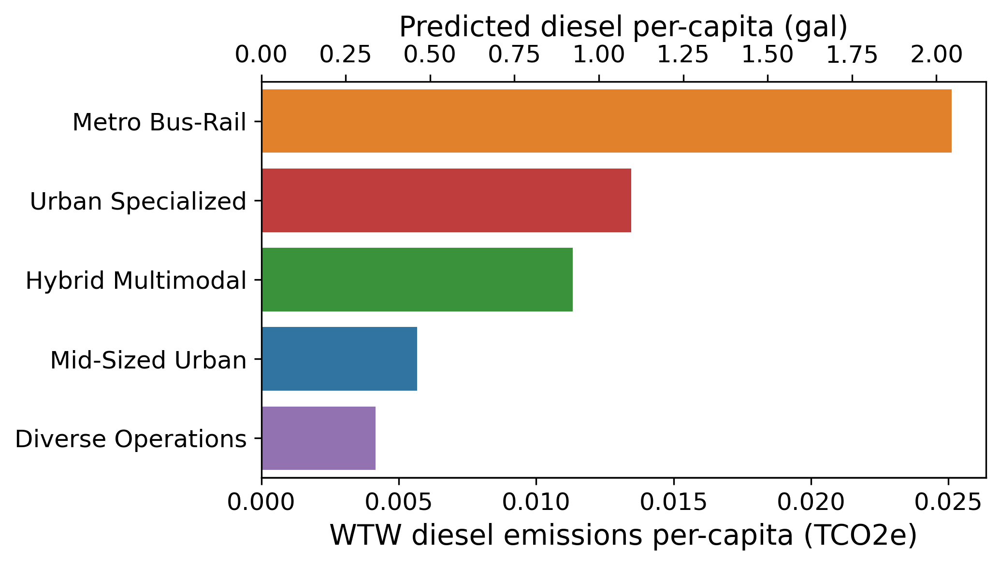

In [100]:
# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Bar plot for total predicted diesel (secondary x-axis now at the top)
sns.barplot(
    y='Cluster Name', 
    x='predicted_diesel_per_capita', 
    data=aggregated_data2, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors
)

# Move primary x-axis (diesel) to the top
ax.xaxis.set_label_position('top')  # Move label to the top
ax.xaxis.tick_top()  # Move ticks to the top
ax.set_xlabel('Predicted diesel per-capita (gal)', fontsize=14)
ax.set_ylabel('', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=12)

# Compute the scale factor for CO2 emissions
scale_factor = aggregated_data2['toneco2_per_capita'].sum() / aggregated_data2['predicted_diesel_per_capita'].sum()

# Create secondary x-axis for CO2 emissions at the bottom
secax = ax.secondary_xaxis(
    'bottom',  # Move secondary axis to bottom
    functions=(
        lambda x: x * scale_factor,  # Scale diesel to CO2 emissions
        lambda x: x / scale_factor   # Inverse scale
    )
)
secax.set_xlabel('WTW diesel emissions per-capita (TCO2e)', fontsize=14)
secax.tick_params(axis='x', labelsize=12)

# Format the secondary axis tick labels with three decimals
secax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))

plt.tight_layout()
plt.show()


In [101]:
df_all_trimmed.columns

Index(['NTD ID', 'Agency VOMS', 'Actual Vehicle/Passenger Car Miles',
       'Service Area Population', 'Primary UZA Area Sq Miles', 'Mode VOMS_AR',
       'Mode VOMS_CB', 'Mode VOMS_CC', 'Mode VOMS_CR', 'Mode VOMS_DR',
       ...
       'PC11', 'PC12', 'Cluster', 'Diesel Consumption per Capita',
       'Electricity Consumption per Capita', 'Cluster Name',
       'predicted_diesel', 'kgco2', 'WTT_kgco2', 'kgco2_WTW'],
      dtype='object', length=193)

## Lifecycle emission prediction after converting all the buses with electric buses

In [102]:
### Step 1: Assign eGRID Subregions to Transit Systems

# eGRID Subregion Mapping Dictionary
egrid_mapping = {
    'AK': 'AKMS', 'AL': 'SRSO', 'AR': 'SRMV', 'AZ': 'AZNM', 'CA': 'CAMX',
    'CO': 'RMPA', 'CT': 'NEWE', 'DE': 'RFCE', 'FL': 'FRCC', 'GA': 'SRSO',
    'HI': 'HIMS', 'IA': 'MROW', 'ID': 'NWPP', 'IL': 'SRMW', 'IN': 'SRMW',
    'KS': 'SPNO', 'KY': 'SRTV', 'LA': 'SRMV', 'MA': 'NEWE', 'MD': 'RFCE',
    'ME': 'NEWE', 'MI': 'RFCM', 'MN': 'MROW', 'MO': 'SRMV', 'MS': 'SRSO',
    'MT': 'NWPP', 'NC': 'SRVC', 'ND': 'MROW', 'NE': 'MROW', 'NH': 'NEWE',
    'NJ': 'RFCE', 'NM': 'AZNM', 'NV': 'NWPP', 'NY': 'NYUP', 'OH': 'RFCW',
    'OK': 'SPSO', 'OR': 'NWPP', 'PA': 'RFCE', 'RI': 'NEWE', 'SC': 'SRVC',
    'SD': 'MROW', 'TN': 'SRTV', 'TX': 'ERCT', 'UT': 'NWPP', 'VA': 'SRVC',
    'VT': 'NEWE', 'WA': 'NWPP', 'WI': 'MROE', 'WV': 'RFCW', 'WY': 'RMPA'
}

# Map the State to eGRID Subregion
df_all_trimmed['eGRID_Subregion'] = df_all_trimmed['State'].map(egrid_mapping)

# Display the result to verify
df_all_trimmed[['State', 'eGRID_Subregion']].head()


,State,eGRID_Subregion
0,WA,NWPP
1,WA,NWPP
2,WA,NWPP
3,WA,NWPP
4,WA,NWPP


In [103]:
### Step 2: Assign CO2 factors to eGRID Subregions

# CO2 emission factors for each subregion (in lb/MWh)
co2_factors = {
    'AKMS': 495.8,
    'SRSO': 893.3,
    'SRMV': 801.0,
    'AZNM': 776.0,
    'CAMX': 497.4,
    'RMPA': 1124.9,
    'NEWE': 536.4,
    'RFCE': 657.4,
    'FRCC': 813.8,
    'HIMS': 1155.5,
    'MROW': 936.5,
    'MROE': 1479.6,
    'NWPP': 602.1,
    'RFCW': 1000.1,
    'RFCM': 1216.4,
    'SPNO': 952.6,
    'SPSO': 970.4,
    'SRMW': 1369.9,
    'SRTV': 933.1,
    'SRVC': 623.0,
    'NYUP': 274.6,
    'US Average': 823.1
}

# Map the CO2 factors to the DataFrame
df_all_trimmed['CO2_lb_MWh'] = df_all_trimmed['eGRID_Subregion'].map(co2_factors)

# Convert lb/MWh to kg/MWh
df_all_trimmed['CO2_kg_MWh'] = df_all_trimmed['CO2_lb_MWh'] * 0.4536

# Display results
df_all_trimmed[['State', 'eGRID_Subregion', 'CO2_kg_MWh']].head()


,State,eGRID_Subregion,CO2_kg_MWh
0,WA,NWPP,273.11256
1,WA,NWPP,273.11256
2,WA,NWPP,273.11256
3,WA,NWPP,273.11256
4,WA,NWPP,273.11256


In [104]:
# Conversion constants
diesel_mpg = 4.5  # miles per gallon for diesel buses
electric_efficiency = 2.02  # kWh per mile for electric buses

# Convert predicted diesel to kWh
df_all_trimmed['predicted_kWh'] = (df_all_trimmed['predicted_diesel'] * diesel_mpg) * electric_efficiency

# Display results
df_all_trimmed[['predicted_diesel', 'predicted_kWh']].head()


,predicted_diesel,predicted_kWh
0,2.144563e+07,1.949408e+08
1,1.607244e+06,1.460984e+07
2,2.068638e+06,1.880392e+07
3,1.650525e+04,1.500328e+05
4,2.896811e+05,2.633201e+06


In [105]:
# Calculate lifecycle emissions (kg CO2)
df_all_trimmed['lifecycle_CO2_kg'] = (df_all_trimmed['predicted_kWh'] / 1000) * df_all_trimmed['CO2_kg_MWh']
df_all_trimmed['lifecycle_CO2_Mtone'] = df_all_trimmed['lifecycle_CO2_kg'] / 1000
df_all_trimmed['lifecycle_CO2_MMtone'] = df_all_trimmed['lifecycle_CO2_Mtone'] / 1000000


# Display results
df_all_trimmed[['predicted_kWh', 'CO2_kg_MWh', 'lifecycle_CO2_kg','lifecycle_CO2_Mtone', 'lifecycle_CO2_MMtone']].head()


,predicted_kWh,CO2_kg_MWh,lifecycle_CO2_kg,lifecycle_CO2_Mtone,lifecycle_CO2_MMtone
0,1.949408e+08,273.11256,5.324078e+07,53240.780083,0.053241
1,1.460984e+07,273.11256,3.990132e+06,3990.131828,0.003990
2,1.880392e+07,273.11256,5.135587e+06,5135.587241,0.005136
3,1.500328e+05,273.11256,4.097583e+04,40.975827,0.000041
4,2.633201e+06,273.11256,7.191603e+05,719.160313,0.000719


In [106]:
# Group by 'Cluster Name' and compute the mean for each cluster
average_values = df_all_trimmed.groupby('Cluster Name')[['predicted_kWh', 'CO2_kg_MWh', 'lifecycle_CO2_kg', 'lifecycle_CO2_Mtone','lifecycle_CO2_MMtone']].mean().reset_index()
average_values

,Cluster Name,predicted_kWh,CO2_kg_MWh,lifecycle_CO2_kg,lifecycle_CO2_Mtone,lifecycle_CO2_MMtone
0,Diverse Operations,3.281638e+05,353.051288,9.603711e+04,96.037106,0.000096
1,Hybrid Multimodal,2.197032e+06,369.193384,7.925052e+05,792.505156,0.000793
2,Metro Bus-Rail,4.259174e+07,318.603865,1.211794e+07,12117.937498,0.012118
3,Mid-Sized Urban,1.470851e+05,389.293563,5.514660e+04,55.146599,0.000055
4,Urban Specialized,8.683093e+06,328.397646,2.804912e+06,2804.911927,0.002805


In [107]:
sum_values = df_all_trimmed.groupby('Cluster Name')[['predicted_kWh', 'CO2_kg_MWh', 'lifecycle_CO2_kg', 'lifecycle_CO2_Mtone','lifecycle_CO2_MMtone']].sum().reset_index()
sum_values

,Cluster Name,predicted_kWh,CO2_kg_MWh,lifecycle_CO2_kg,lifecycle_CO2_Mtone,lifecycle_CO2_MMtone
0,Diverse Operations,8.794791e+07,90028.07856,2.448946e+07,24489.462139,0.024489
1,Hybrid Multimodal,6.964593e+08,110388.82176,2.369590e+08,236959.041787,0.236959
2,Metro Bus-Rail,3.535114e+09,24213.89376,9.209632e+08,920963.249861,0.920963
3,Mid-Sized Urban,1.891515e+08,475327.44000,6.733400e+07,67333.997816,0.067334
4,Urban Specialized,2.179456e+09,74874.66336,6.395199e+08,639519.919443,0.639520


In [108]:
sum_values['lifecycle_CO2_MMtone'].sum()

1.8892656710461844

In [109]:
df_all_trimmed['lifecycle_CO2_MMtone_per_capita'] = df_all_trimmed['lifecycle_CO2_MMtone'] / df_all_trimmed['Service Area Population']
df_all_trimmed['lifecycle_CO2_Mtone_per_capita'] = df_all_trimmed['lifecycle_CO2_Mtone'] / df_all_trimmed['Service Area Population']

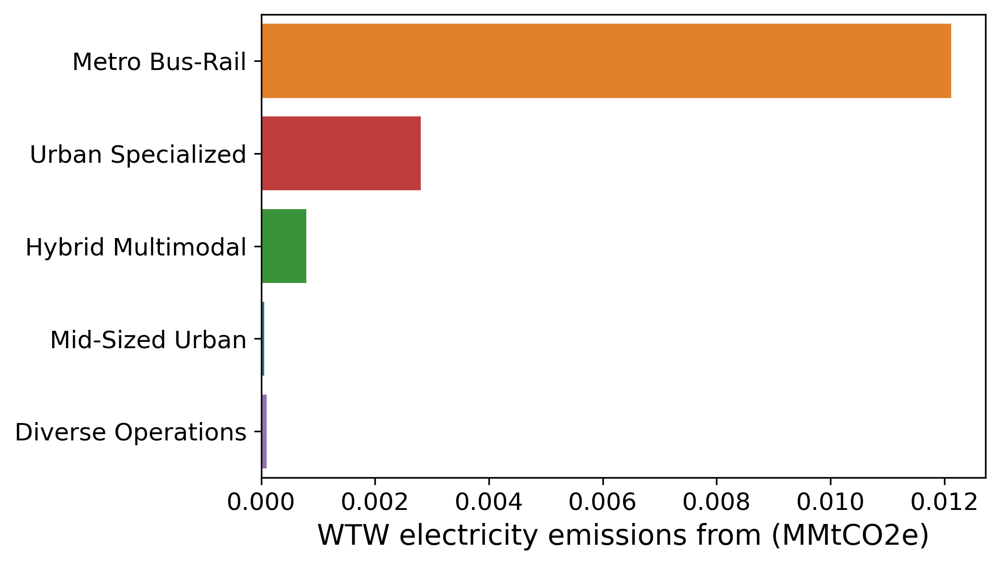

In [110]:
# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)


# Bar plot for total predicted diesel (primary x-axis)
sns.barplot(
    y='Cluster Name', 
    x='lifecycle_CO2_MMtone', 
    data=df_all_trimmed, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors,
    errorbar=None
)

# Adjust diesel x-axis labels (primary x-axis)
ax.set_xlabel('WTW electricity emissions from (MMtCO2e)', fontsize=14)
ax.set_ylabel('', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=12)

# Set x-axis limit
#ax.set_xlim(0, 4)

# Format the axis tick labels
#ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x / 1_000_000:.0f}'))

plt.tight_layout()
plt.show()


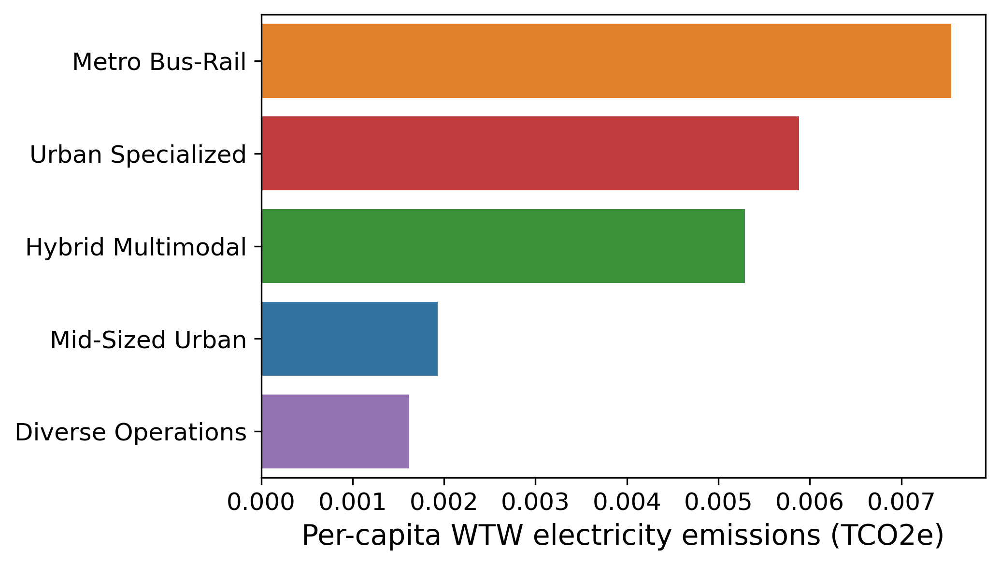

In [111]:
import matplotlib.ticker as ticker

# Create the plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)


# Bar plot for total predicted diesel (primary x-axis)
sns.barplot(
    y='Cluster Name', 
    x='lifecycle_CO2_Mtone_per_capita', 
    data=df_all_trimmed, 
    ax=ax, 
    hue='Cluster Name', 
    palette=cluster_colors,
    errorbar=None
)

# Set x-axis limit
#ax.set_xlim(0, 0.02)

# Adjust diesel x-axis labels (primary x-axis)
ax.set_xlabel('Per-capita WTW electricity emissions (TCO2e)', fontsize=14)
ax.set_ylabel('', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=12)

# Format x-axis ticks to two decimal places
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.3f'))

plt.tight_layout()
plt.show()


In [112]:
df_all_trimmed

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,kgco2_WTW,eGRID_Subregion,CO2_lb_MWh,CO2_kg_MWh,predicted_kWh,lifecycle_CO2_kg,lifecycle_CO2_Mtone,lifecycle_CO2_MMtone,lifecycle_CO2_MMtone_per_capita,lifecycle_CO2_Mtone_per_capita
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,2.633524e+08,NWPP,602.1,273.11256,1.949408e+08,5.324078e+07,53240.780083,0.053241,2.327924e-08,0.023279
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,1.973695e+07,NWPP,602.1,273.11256,1.460984e+07,3.990132e+06,3990.131828,0.003990,8.692965e-09,0.008693
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,2.540288e+07,NWPP,602.1,273.11256,1.880392e+07,5.135587e+06,5135.587241,0.005136,8.916523e-09,0.008917
3,4,10.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,2.026845e+05,NWPP,602.1,273.11256,1.500328e+05,4.097583e+04,40.975827,0.000041,inf,inf
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,3.557284e+06,NWPP,602.1,273.11256,2.633201e+06,7.191603e+05,719.160313,0.000719,6.500649e-09,0.006501
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,2.203516e+05,AZNM,776.0,351.99360,1.631104e+05,5.741383e+04,57.413827,0.000057,inf,inf
2201,99442,22.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,5.0,...,1.336813e+05,CAMX,497.4,225.62064,9.895465e+04,2.232621e+04,22.326212,0.000022,inf,inf
2202,99452,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0,...,1.317536e+05,CAMX,497.4,225.62064,9.752770e+04,2.200426e+04,22.004261,0.000022,inf,inf
2203,99453,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,2.0,...,1.423896e+05,AZNM,776.0,351.99360,1.054008e+05,3.710041e+04,37.100405,0.000037,inf,inf


In [113]:
df_all_trimmed['total_CO2_Mtone'] = df_all_trimmed['lifecycle_CO2_Mtone'] + df_all_trimmed['kgco2_WTW'] / 1000
df_all_trimmed['total_CO2_Mtone_per_capita'] = df_all_trimmed['total_CO2_Mtone'] / df_all_trimmed['Service Area Population']

In [114]:
df_all_trimmed['total_CO2_Mtone_per_capita'].replace([np.inf, -np.inf], np.nan, inplace=True)
df_all_trimmed['total_CO2_Mtone_per_capita'].fillna(0, inplace=True)

sum_values = df_all_trimmed.groupby('Cluster Name')[['total_CO2_Mtone', 'total_CO2_Mtone_per_capita']].sum().reset_index()
sum_values

,Cluster Name,total_CO2_Mtone,total_CO2_Mtone_per_capita
0,Diverse Operations,1.387958e+05,1.286632
1,Hybrid Multimodal,1.135175e+06,5.715698
2,Metro Bus-Rail,5.164423e+06,2.801245
3,Mid-Sized Urban,3.085881e+05,2.717205
4,Urban Specialized,3.392734e+06,5.935159


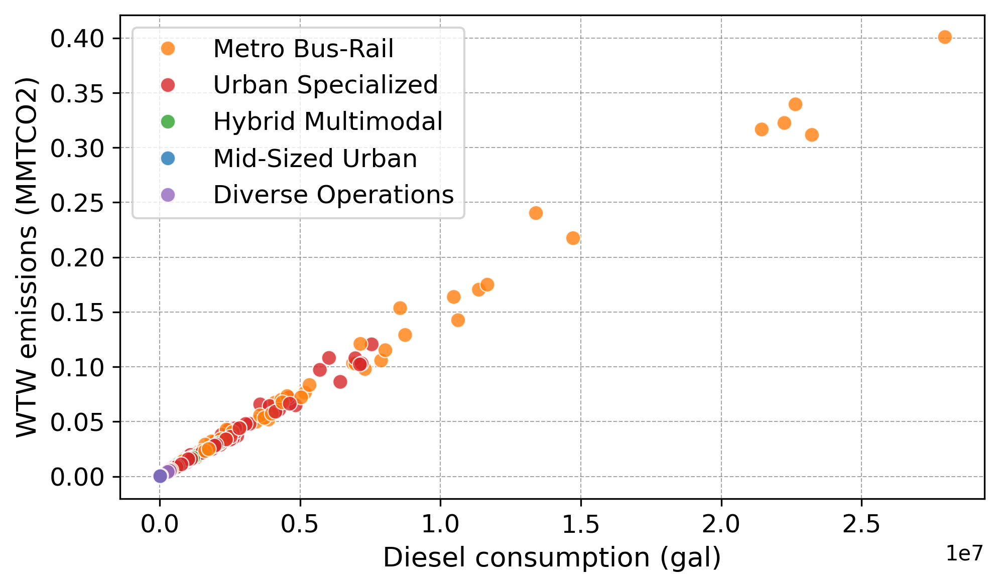

In [115]:
import matplotlib.ticker as ticker

# Create the scatter plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Scatter plot for PCERP vs Diesel Consumption
sns.scatterplot(
    x='predicted_diesel',  
    y='total_CO2_Mtone',  
    hue='Cluster Name',  # Group by clusters
    palette=cluster_colors,
    data=df_all_trimmed,
    ax=ax,
    s=50,  # Marker size
    alpha=0.8,  # Transparency,
    zorder=2
)

# Set x-axis to log scale
#ax.set_xscale('log')

# Set axis labels
ax.set_xlabel('Diesel consumption (gal)', fontsize=13)
ax.set_ylabel('WTW emissions (MMTCO2)', fontsize=13)

ax.tick_params(axis='both', which='major', labelsize=12)

# Set y-axis limits
#ax.set_ylim(0, 0.17)

# Add grid for better readability
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7, zorder=1)

# Add legend outside the plot
ax.legend(title='', bbox_to_anchor=(1.05, 1), fontsize=12)
ax.legend(title='', loc='upper left', fontsize=12, frameon=True)


# Adjust layout to prevent cutoff
plt.tight_layout()

# Format the axis tick labels
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y / 1_000_000:.2f}'))

# Save the plot
output_file = '../../figures/pcerp_vs_diesel_consumption.png'
plt.savefig(output_file, bbox_inches='tight')

# Show the plot
plt.show()


In [116]:
df_all_trimmed

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,CO2_lb_MWh,CO2_kg_MWh,predicted_kWh,lifecycle_CO2_kg,lifecycle_CO2_Mtone,lifecycle_CO2_MMtone,lifecycle_CO2_MMtone_per_capita,lifecycle_CO2_Mtone_per_capita,total_CO2_Mtone,total_CO2_Mtone_per_capita
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,602.1,273.11256,1.949408e+08,5.324078e+07,53240.780083,0.053241,2.327924e-08,0.023279,316593.123833,0.138429
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,602.1,273.11256,1.460984e+07,3.990132e+06,3990.131828,0.003990,8.692965e-09,0.008693,23727.081047,0.051692
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,602.1,273.11256,1.880392e+07,5.135587e+06,5135.587241,0.005136,8.916523e-09,0.008917,30538.466148,0.053022
3,4,10.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,602.1,273.11256,1.500328e+05,4.097583e+04,40.975827,0.000041,inf,inf,243.660352,0.000000
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,602.1,273.11256,2.633201e+06,7.191603e+05,719.160313,0.000719,6.500649e-09,0.006501,4276.444493,0.038656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,776.0,351.99360,1.631104e+05,5.741383e+04,57.413827,0.000057,inf,inf,277.765435,0.000000
2201,99442,22.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,5.0,...,497.4,225.62064,9.895465e+04,2.232621e+04,22.326212,0.000022,inf,inf,156.007517,0.000000
2202,99452,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0,...,497.4,225.62064,9.752770e+04,2.200426e+04,22.004261,0.000022,inf,inf,153.757862,0.000000
2203,99453,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,2.0,...,776.0,351.99360,1.054008e+05,3.710041e+04,37.100405,0.000037,inf,inf,179.490023,0.000000


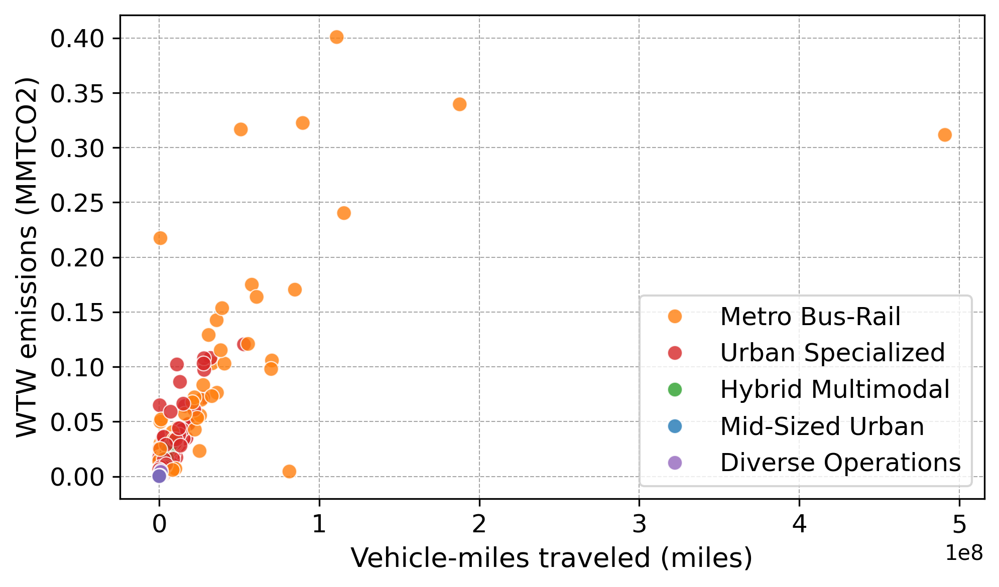

In [117]:
import matplotlib.ticker as ticker

# Create the scatter plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Scatter plot for PCERP vs Diesel Consumption
sns.scatterplot(
    x='Actual Vehicle/Passenger Car Miles',  
    y='total_CO2_Mtone',  
    hue='Cluster Name',  # Group by clusters
    palette=cluster_colors,
    data=df_all_trimmed,
    ax=ax,
    s=50,  # Marker size
    alpha=0.8,  # Transparency,
    zorder=2
)

# Set x-axis to log scale
#ax.set_xscale('log')

# Set axis labels
ax.set_xlabel('Vehicle-miles traveled (miles)', fontsize=13)
ax.set_ylabel('WTW emissions (MMTCO2)', fontsize=13)

ax.tick_params(axis='both', which='major', labelsize=12)

# Set y-axis limits
#ax.set_xlim(0, 2)

# Add grid for better readability
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7, zorder=1)

# Add legend outside the plot
ax.legend(title='', bbox_to_anchor=(1.05, 1), fontsize=12)
ax.legend(title='', loc='lower right', fontsize=12, frameon=True)


# Adjust layout to prevent cutoff
plt.tight_layout()

# Format the axis tick labels
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y / 1_000_000:.2f}'))

# Save the plot
output_file = '../../figures/emissions_vs_VMT.png'
plt.savefig(output_file, bbox_inches='tight')

# Show the plot
plt.show()


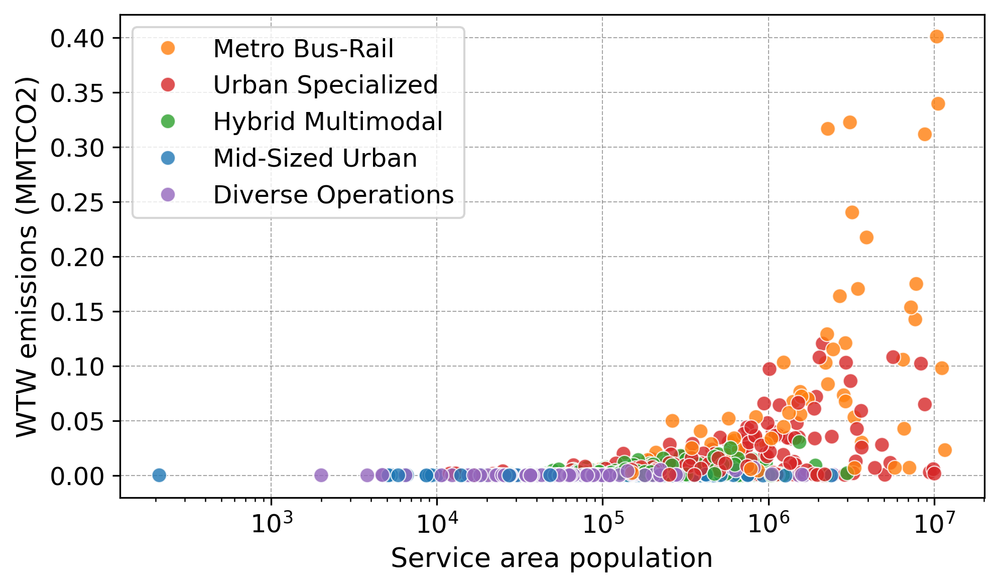

In [118]:
# Create the scatter plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=300)

# Scatter plot for PCERP vs Population Served
sns.scatterplot(
    x='Service Area Population',  
    y='total_CO2_Mtone',  
    hue='Cluster Name',  # Group by clusters
    palette=cluster_colors,
    data=df_all_trimmed,
    ax=ax,
    s=50,  # Marker size
    alpha=0.8,  # Transparency
    zorder= 2
)

# Set x-axis to log scale
ax.set_xscale('log')

# Set axis labels
ax.set_xlabel('Service area population', fontsize=13)
#ax.set_ylabel('Per-capita emissions reduction \n potential (TCO2)', fontsize=13)
ax.set_ylabel('WTW emissions (MMTCO2)', fontsize=13)

ax.tick_params(axis='both', which='major', labelsize=12)

# Set x and y-axis limits
#ax.set_ylim(0, 0.17)

# Add grid for better readability
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7, zorder=1)

# Add legend outside the plot
ax.legend(title='', bbox_to_anchor=(1.05, 1), fontsize=12)
ax.legend(title='', loc='upper left', fontsize=12, frameon=True)


# Adjust layout to prevent cutoff
plt.tight_layout()

# Format the axis tick labels
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y / 1_000_000:.2f}'))

# Save the plot
output_file = '../../figures/pcerp_vs_population_millions.png'
plt.savefig(output_file, bbox_inches='tight')

# Show the plot
plt.show()


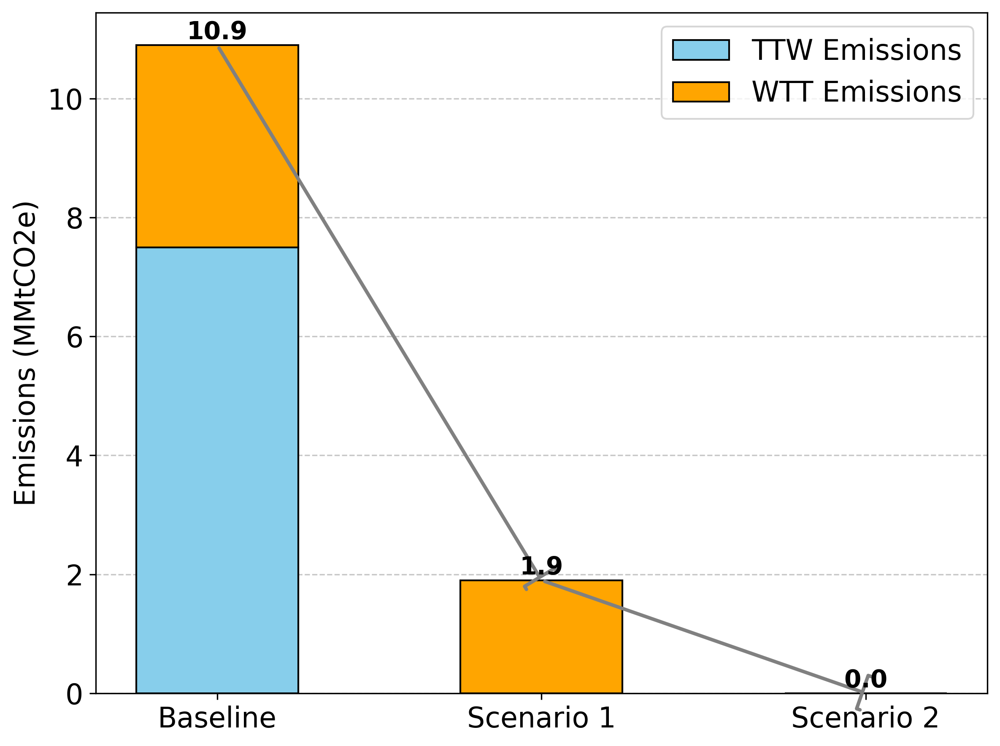

In [119]:
# Data for the scenarios
scenarios = ['Baseline', 'Scenario 1', 'Scenario 2']
ttw_emissions = [7.5, 0, 0]  # TTW emissions (MMtCO2e)
wtt_emissions = [3.4, 1.9, 0]  # WTT emissions (MMtCO2e)

# Calculate total emissions for the wedge labels
total_emissions = [ttw + wtt for ttw, wtt in zip(ttw_emissions, wtt_emissions)]

# Bar width
bar_width = 0.5

# X positions for the bars
x_pos = np.arange(len(scenarios))

# Create the plot
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

# Plot the stacked bars
ax.bar(x_pos, ttw_emissions, bar_width, label='TTW Emissions', color='skyblue', edgecolor='black', zorder=2)
ax.bar(x_pos, wtt_emissions, bar_width, bottom=ttw_emissions, label='WTT Emissions', color='orange', edgecolor='black', zorder=2)

# Add wedge arrows to show the reduction
for i in range(1, len(x_pos)):
    ax.annotate(
        '', 
        xy=(x_pos[i], total_emissions[i]), 
        xytext=(x_pos[i-1], total_emissions[i-1]), 
        arrowprops=dict(arrowstyle='-[', color='gray', lw=2, zorder=1)
    )

# Add labels for total emissions on top of each bar
for i, total in enumerate(total_emissions):
    ax.text(x_pos[i], total + 0.1, f'{total:.1f}', ha='center', fontsize=14, fontweight='bold')

# Add x-axis labels and title
ax.set_xticks(x_pos)
ax.set_xticklabels(scenarios, fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.set_ylabel('Emissions (MMtCO2e)', fontsize=16)
#ax.set_title('Emissions Reduction Across Scenarios', fontsize=14, fontweight='bold')

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better spacing
plt.tight_layout()

# Save the plot (optional)
plt.savefig('../../figures/emissions_reduction_wedge_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


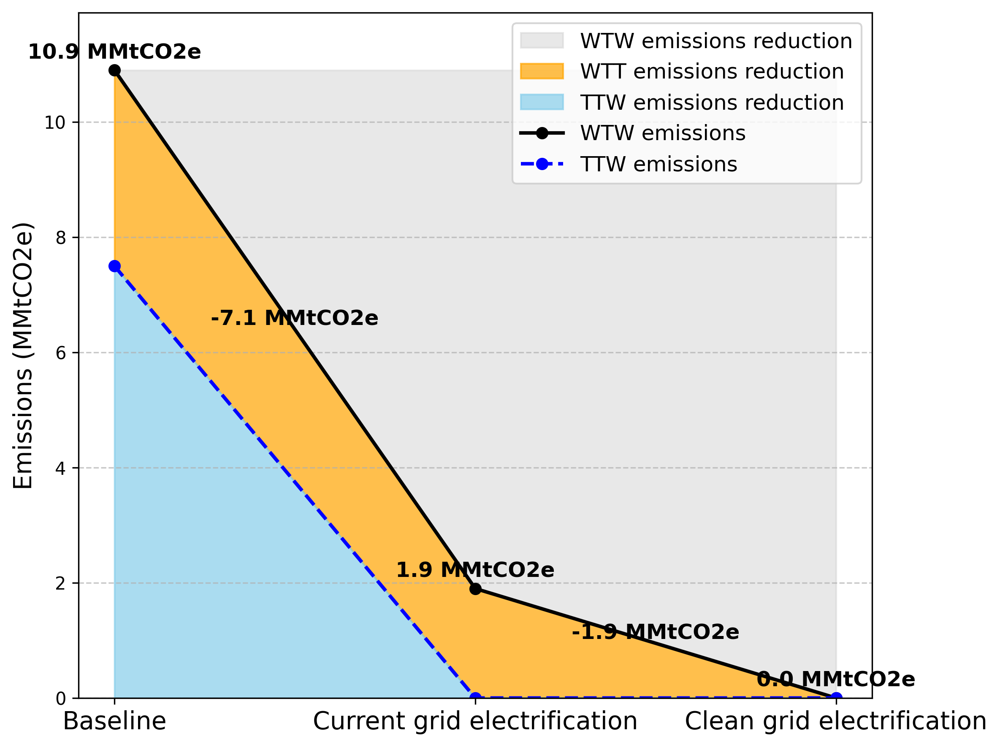

In [120]:
# Define scenarios
scenarios = ['Baseline', 'Current grid electrification', 'Clean grid electrification']
x_pos = np.array([0, 1, 2])  # X-axis positions
ttw_emissions = np.array([7.5, 0, 0])  # TTW emissions (MMtCO2e)
wtt_emissions = np.array([3.4, 1.9, 0])  # WTT emissions (MMtCO2e)
total_emissions = ttw_emissions + wtt_emissions  # Total emissions

# Create figure
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

# Plot shaded reduction regions
ax.fill_between(x_pos, total_emissions, total_emissions[0], color='lightgray', alpha=0.5, label='WTW emissions reduction')
ax.fill_between(x_pos, ttw_emissions, total_emissions, color='orange', alpha=0.7, label='WTT emissions reduction')
ax.fill_between(x_pos, 0, ttw_emissions, color='skyblue', alpha=0.7, label='TTW emissions reduction')

# Plot lines connecting scenario points
ax.plot(x_pos, total_emissions, marker='o', color='black', linewidth=2, label='WTW emissions')
ax.plot(x_pos, ttw_emissions, marker='o', linestyle='dashed', color='blue', linewidth=2, label='TTW emissions')
#ax.plot(x_pos, wtt_emissions, marker='o', linestyle='dashed', color='darkorange', linewidth=2, label='WTT')

# Add text labels for total emissions
for i, total in enumerate(total_emissions):
    ax.text(x_pos[i], total + 0.2, f'{total:.1f} MMtCO2e', ha='center', fontsize=12, fontweight='bold')

# Add labels for reductions
ax.text(0.5, (total_emissions[0] + total_emissions[1]) / 2, '-7.1 MMtCO2e', ha='center', va='bottom', fontsize=12, fontweight='bold', color='black')
ax.text(1.5, (total_emissions[1] + total_emissions[2]) / 2, '-1.9 MMtCO2e', ha='center', va='bottom', fontsize=12, fontweight='bold', color='black')

# Format plot
ax.set_xticks(x_pos)
ax.set_xticklabels(scenarios, fontsize=14)
ax.set_ylabel('Emissions (MMtCO2e)', fontsize=14)
ax.set_ylim(0, total_emissions[0] + 1)
ax.legend(loc='upper right', fontsize=12)

# Grid and layout adjustments
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Save the plot (optional)
plt.savefig('emissions_reduction_region_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


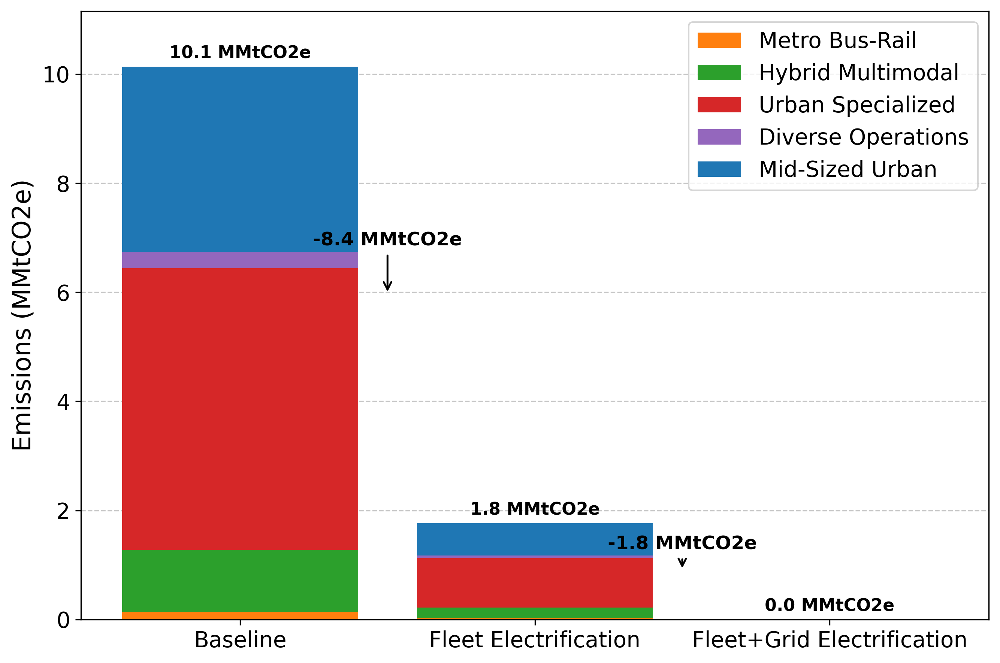

In [129]:
# Cluster baseline values (in metric tons CO2e)
baseline_values = {
    'Diverse Operations': 1.387958e+05,
    'Hybrid Multimodal': 1.135175e+06,
    'Metro Bus-Rail': 5.164423e+06,
    'Mid-Sized Urban': 3.085881e+05,
    'Urban Specialized': 3.392734e+06
}

# Convert to million metric tons (MMtCO2e)
baseline_values_mmt = {k: v / 1e6 for k, v in baseline_values.items()}

# Cluster colors
cluster_colors = {
    'Metro Bus-Rail': '#ff7f0e',   # Orange
    'Hybrid Multimodal': '#2ca02c', # Green 
    'Urban Specialized': '#d62728', # Red
    'Diverse Operations': '#9467bd', # Purple
    'Mid-Sized Urban': '#1f77b4' # Blue
}

# Scenarios
scenarios = ['Baseline', 'Fleet Electrification', 'Fleet+Grid Electrification']
x_pos = np.arange(len(scenarios))

# Values per scenario
baseline = np.array(list(baseline_values_mmt.values()))
current_grid = baseline * (1.9 / (7.5 + 3.4))  # scaled to match scenario 2 total
clean_grid = np.zeros_like(baseline)
scenario_values = [baseline, current_grid, clean_grid]

# Create stacked bar chart
fig, ax = plt.subplots(figsize=(9, 6), dpi=300)

bottom_vals = np.zeros(len(scenarios))
for cluster, color in cluster_colors.items():
    values = [scenario[list(cluster_colors.keys()).index(cluster)] for scenario in scenario_values]
    ax.bar(x_pos, values, bottom=bottom_vals, color=color, label=cluster, zorder = 2)
    bottom_vals += values

# Total emissions per scenario
totals = [np.sum(vals) for vals in scenario_values]
for i, total in enumerate(totals):
    ax.text(x_pos[i], total + 0.15, f'{total:.1f} MMtCO2e',
            ha='center', fontsize=11, fontweight='bold')

# Reduction annotations with arrows
ax.annotate(f'-{totals[0] - totals[1]:.1f} MMtCO2e',
            xy=(0.5, (totals[0] + totals[1]) / 2),
            xytext=(0.5, (totals[0] + totals[1]) / 2 + 1),
            ha='center', va='center', fontsize=12, fontweight='bold',
            arrowprops=dict(arrowstyle='->', lw=1.2, color='black'))

ax.annotate(f'-{totals[1] - totals[2]:.1f} MMtCO2e',
            xy=(1.5, (totals[1] + totals[2]) / 2),
            xytext=(1.5, (totals[1] + totals[2]) / 2 + 0.5),
            ha='center', va='center', fontsize=12, fontweight='bold',
            arrowprops=dict(arrowstyle='->', lw=1.2, color='black'))

# Formatting
ax.set_xticks(x_pos)
ax.set_xticklabels(scenarios, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_ylabel('Emissions (MMtCO2e)', fontsize=16)
ax.set_ylim(0, totals[0] * 1.1)
ax.legend(title='', fontsize=14, title_fontsize=11, loc='upper right')

ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


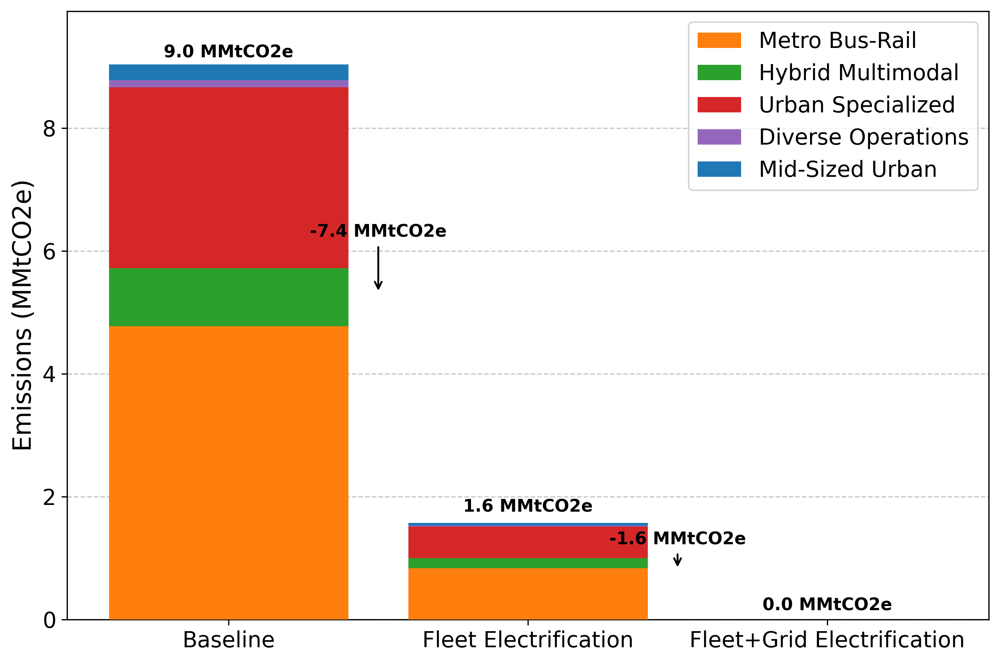

In [137]:
# Scenarios
scenarios = ['Baseline', 'Fleet Electrification', 'Fleet+Grid Electrification']

x_pos = np.arange(len(scenarios))

# Baseline values (convert to MMtCO2e)
baseline = aggregated_data2.set_index("Cluster Name")["toneco2_WTW"].reindex(cluster_colors.keys()).values / 1e6

# Current grid scaling (same ratio as before: 1.9 / (7.5+3.4))
current_grid = baseline * (1.9 / (7.5 + 3.4))
clean_grid = np.zeros_like(baseline)
scenario_values = [baseline, current_grid, clean_grid]

# Create stacked bar chart
fig, ax = plt.subplots(figsize=(9, 6), dpi=300)

bottom_vals = np.zeros(len(scenarios))
for cluster, color in cluster_colors.items():
    values = [scenario[list(cluster_colors.keys()).index(cluster)] for scenario in scenario_values]
    ax.bar(x_pos, values, bottom=bottom_vals, color=color, label=cluster, zorder=3)
    bottom_vals += values

# Compute totals rounded to one decimal first
totals = [round(np.sum(vals), 1) for vals in scenario_values]

# Use those rounded totals for annotations
for i, total in enumerate(totals):
    ax.text(x_pos[i], total + 0.15, f'{total:.1f} MMtCO2e',
            ha='center', fontsize=11, fontweight='bold')

# Reduction annotations
ax.annotate(f'-{totals[0] - totals[1]:.1f} MMtCO2e',
            xy=(0.5, (totals[0] + totals[1]) / 2),
            xytext=(0.5, (totals[0] + totals[1]) / 2 + 1),
            ha='center', va='center', fontsize=11, fontweight='bold',
            arrowprops=dict(arrowstyle='->', lw=1.2, color='black'))

ax.annotate(f'-{totals[1] - totals[2]:.1f} MMtCO2e',
            xy=(1.5, (totals[1] + totals[2]) / 2),
            xytext=(1.5, (totals[1] + totals[2]) / 2 + 0.5),
            ha='center', va='center', fontsize=11, fontweight='bold',
            arrowprops=dict(arrowstyle='->', lw=1.2, color='black'))

# Formatting
ax.set_xticks(x_pos)
ax.set_xticklabels(scenarios, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_ylabel('Emissions (MMtCO2e)', fontsize=16)
ax.set_ylim(0, totals[0] * 1.1)
ax.legend(title='', fontsize=14, title_fontsize=11, loc='upper right')

ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


In [130]:
df_all_trimmed

,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,CO2_lb_MWh,CO2_kg_MWh,predicted_kWh,lifecycle_CO2_kg,lifecycle_CO2_Mtone,lifecycle_CO2_MMtone,lifecycle_CO2_MMtone_per_capita,lifecycle_CO2_Mtone_per_capita,total_CO2_Mtone,total_CO2_Mtone_per_capita
0,1,18261.0,51015415.0,2287050.0,982.52,0.0,0.0,0.0,0.0,311.0,...,602.1,273.11256,1.949408e+08,5.324078e+07,53240.780083,0.053241,2.327924e-08,0.023279,316593.123833,0.138429
1,2,1116.0,10296150.0,459007.0,171.67,0.0,0.0,0.0,0.0,79.0,...,602.1,273.11256,1.460984e+07,3.990132e+06,3990.131828,0.003990,8.692965e-09,0.008693,23727.081047,0.051692
2,3,1910.0,9841274.0,575963.0,982.52,0.0,0.0,0.0,0.0,77.0,...,602.1,273.11256,1.880392e+07,5.135587e+06,5135.587241,0.005136,8.916523e-09,0.008917,30538.466148,0.053022
3,4,10.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,602.1,273.11256,1.500328e+05,4.097583e+04,40.975827,0.000041,inf,inf,243.660352,0.000000
4,5,84.0,1625002.0,110629.0,982.52,0.0,0.0,0.0,0.0,15.0,...,602.1,273.11256,2.633201e+06,7.191603e+05,719.160313,0.000719,6.500649e-09,0.006501,4276.444493,0.038656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,99441,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,776.0,351.99360,1.631104e+05,5.741383e+04,57.413827,0.000057,inf,inf,277.765435,0.000000
2201,99442,22.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,5.0,...,497.4,225.62064,9.895465e+04,2.232621e+04,22.326212,0.000022,inf,inf,156.007517,0.000000
2202,99452,1.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0,...,497.4,225.62064,9.752770e+04,2.200426e+04,22.004261,0.000022,inf,inf,153.757862,0.000000
2203,99453,2.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,2.0,...,776.0,351.99360,1.054008e+05,3.710041e+04,37.100405,0.000037,inf,inf,179.490023,0.000000


In [134]:
#df_all_trimmed['total_CO2_Mtone'] = df_all_trimmed['lifecycle_CO2_Mtone'] + df_all_trimmed['kgco2_WTW'] / 1000
df_all_trimmed['kgco2_WTW'].sum()/1000

9035229.184

In [132]:
df_all_trimmed['lifecycle_CO2_Mtone'].sum()

1889265.6710461844

In [133]:
df_all_trimmed['total_CO2_Mtone'].sum()

10139716.14181535

## Electrification scenario

In [201]:
df_all_trimmed.columns

Index(['NTD ID', 'Agency VOMS', 'Actual Vehicle/Passenger Car Miles',
       'Service Area Population', 'Primary UZA Area Sq Miles', 'Mode VOMS_AR',
       'Mode VOMS_CB', 'Mode VOMS_CC', 'Mode VOMS_CR', 'Mode VOMS_DR',
       ...
       'CO2_lb_MWh', 'CO2_kg_MWh', 'predicted_kWh', 'lifecycle_CO2_kg',
       'lifecycle_CO2_Mtone', 'lifecycle_CO2_MMtone',
       'lifecycle_CO2_MMtone_per_capita', 'lifecycle_CO2_Mtone_per_capita',
       'total_CO2_Mtone', 'total_CO2_Mtone_per_capita'],
      dtype='object', length=204)

In [204]:
# Group by 'Cluster Name' and calculate the sum of 'kgco2' for each group
diesel_sum_per_cluster = df_all_trimmed.groupby('Cluster Name').agg({
    'predicted_diesel': 'sum',
    'Service Area Population': 'sum'
}).reset_index()

diesel_sum_per_cluster['million_diesel'] = diesel_sum_per_cluster['predicted_diesel'] / 1e6
diesel_sum_per_cluster['percentsaving'] = diesel_sum_per_cluster['predicted_diesel'] /diesel_sum_per_cluster['predicted_diesel'].sum()*100
diesel_sum_per_cluster['million_diesel_per_capita'] = diesel_sum_per_cluster['million_diesel'] / diesel_sum_per_cluster['Service Area Population']*1e6

# Display the result
diesel_sum_per_cluster


,Cluster Name,predicted_diesel,Service Area Population,million_diesel,percentsaving,million_diesel_per_capita
0,Diverse Operations,9675238.0,28623119.0,9.675238,1.314985,0.338022
1,Hybrid Multimodal,76618184.0,83089480.0,76.618187,10.413364,0.922117
2,Metro Bus-Rail,388901472.0,190212588.0,388.901459,52.856548,2.044562
3,Mid-Sized Urban,20808744.0,45041727.0,20.808744,2.828167,0.461988
4,Urban Specialized,239764160.0,218842925.0,239.764160,32.586933,1.095599


In [205]:
diesel_sum_per_cluster

,Cluster Name,predicted_diesel,Service Area Population,million_diesel,percentsaving,million_diesel_per_capita
0,Diverse Operations,9675238.0,28623119.0,9.675238,1.314985,0.338022
1,Hybrid Multimodal,76618184.0,83089480.0,76.618187,10.413364,0.922117
2,Metro Bus-Rail,388901472.0,190212588.0,388.901459,52.856548,2.044562
3,Mid-Sized Urban,20808744.0,45041727.0,20.808744,2.828167,0.461988
4,Urban Specialized,239764160.0,218842925.0,239.764160,32.586933,1.095599


In [206]:
# Group by 'Cluster Name' and calculate the sum of 'kgco2' for each group
#kgco2_sum_per_cluster = df_all_trimmed.groupby('Cluster Name')['kgco2'].sum().reset_index()
kgco2_sum_per_cluster = df_all_trimmed.groupby('Cluster Name').agg({
    'kgco2': 'sum',
    'Service Area Population': 'sum'
}).reset_index()

kgco2_sum_per_cluster['million_metric_ton'] = kgco2_sum_per_cluster['kgco2'] / 1e9
kgco2_sum_per_cluster['percentsaving'] = kgco2_sum_per_cluster['million_metric_ton'] /kgco2_sum_per_cluster['million_metric_ton'].sum()*100
kgco2_sum_per_cluster['million_metric_ton_capita'] = kgco2_sum_per_cluster['million_metric_ton'] / kgco2_sum_per_cluster['Service Area Population']*1e6

# Display the result
kgco2_sum_per_cluster


,Cluster Name,kgco2,Service Area Population,million_metric_ton,percentsaving,million_metric_ton_capita
0,Diverse Operations,9.917118e+07,28623119.0,0.099171,1.314985,0.003465
1,Hybrid Multimodal,7.853364e+08,83089480.0,0.785336,10.413365,0.009452
2,Metro Bus-Rail,3.986240e+09,190212588.0,3.986240,52.856548,0.020957
3,Mid-Sized Urban,2.132896e+08,45041727.0,0.213290,2.828167,0.004735
4,Urban Specialized,2.457583e+09,218842925.0,2.457582,32.586933,0.011230


In [207]:
kgco2_sum_per_cluster['100PercentEmissionsReduction(million_metric_ton)']=kgco2_sum_per_cluster['million_metric_ton']
kgco2_sum_per_cluster['75PercentEmissionsReduction(million_metric_ton)'] =0.75*kgco2_sum_per_cluster['million_metric_ton']
kgco2_sum_per_cluster['50PercentEmissionsReduction(million_metric_ton)'] =0.50*kgco2_sum_per_cluster['million_metric_ton']
kgco2_sum_per_cluster

,Cluster Name,kgco2,Service Area Population,million_metric_ton,percentsaving,million_metric_ton_capita,100PercentEmissionsReduction(million_metric_ton),75PercentEmissionsReduction(million_metric_ton),50PercentEmissionsReduction(million_metric_ton)
0,Diverse Operations,9.917118e+07,28623119.0,0.099171,1.314985,0.003465,0.099171,0.074378,0.049586
1,Hybrid Multimodal,7.853364e+08,83089480.0,0.785336,10.413365,0.009452,0.785336,0.589002,0.392668
2,Metro Bus-Rail,3.986240e+09,190212588.0,3.986240,52.856548,0.020957,3.986240,2.989680,1.993120
3,Mid-Sized Urban,2.132896e+08,45041727.0,0.213290,2.828167,0.004735,0.213290,0.159967,0.106645
4,Urban Specialized,2.457583e+09,218842925.0,2.457582,32.586933,0.011230,2.457582,1.843187,1.228791


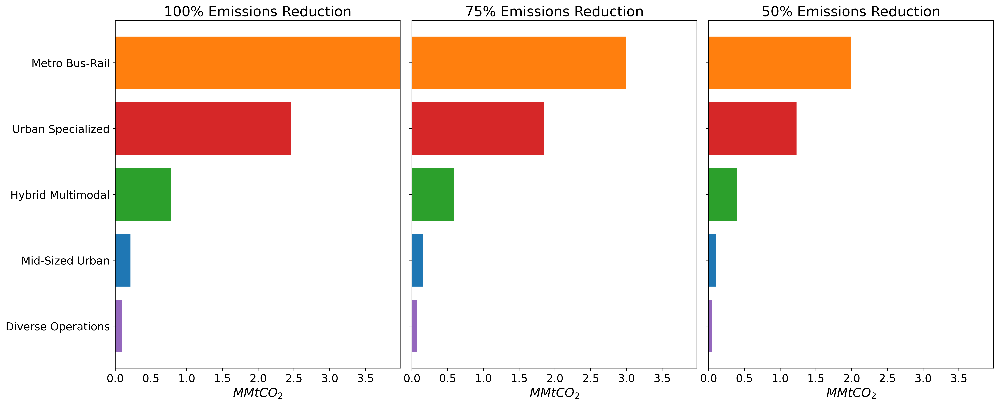

In [209]:
# Define color palette corresponding to cluster names
cluster_colors = {
    'Metro Bus-Rail': '#ff7f0e',   # Orange
    'Hybrid Multimodal': '#2ca02c', # Green 
    'Urban Specialized': '#d62728', # Red
    'Diverse Operations': '#9467bd', # Purple
    'Mid-Sized Urban': '#1f77b4' # Blue,
}

# Sort data by 100PercentEmissionsReduction column in descending order
kgco2_sum_per_cluster = kgco2_sum_per_cluster.sort_values(
    "100PercentEmissionsReduction(million_metric_ton)", ascending=True
)

# Define updated titles for each subplot
titles = ["100% Emissions Reduction", "75% Emissions Reduction", "50% Emissions Reduction"]

# Calculate the max x-axis limit based on the first scenario
x_limit = kgco2_sum_per_cluster["100PercentEmissionsReduction(million_metric_ton)"].max()

# Define figure and subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharey=True, dpi=400)
#fig.suptitle("Emissions Reduction by Cluster for Different Reduction Scenarios", fontsize=16)

# Plot each reduction scenario as a separate horizontal bar chart
scenarios = [
    "100PercentEmissionsReduction(million_metric_ton)",
    "75PercentEmissionsReduction(million_metric_ton)",
    "50PercentEmissionsReduction(million_metric_ton)"
]

for i, (scenario, title) in enumerate(zip(scenarios, titles)):
    # Select the current subplot
    ax = axes[i]
    
    # Plot horizontal bar for the current scenario
    ax.barh(
        kgco2_sum_per_cluster["Cluster Name"], 
        kgco2_sum_per_cluster[scenario], 
        color=[cluster_colors[cluster] for cluster in kgco2_sum_per_cluster["Cluster Name"]]
    )
    
    # Set titles and labels
    ax.set_title(title, fontsize=18)
    ax.set_xlabel("$MMtCO_2$", fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # Apply the same x-axis limit for all subplots
    ax.set_xlim(0, x_limit)

# Increase font size for y-axis labels
#axes[0].set_ylabel("Cluster Name", fontsize=16)

# Tight layout for better spacing
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


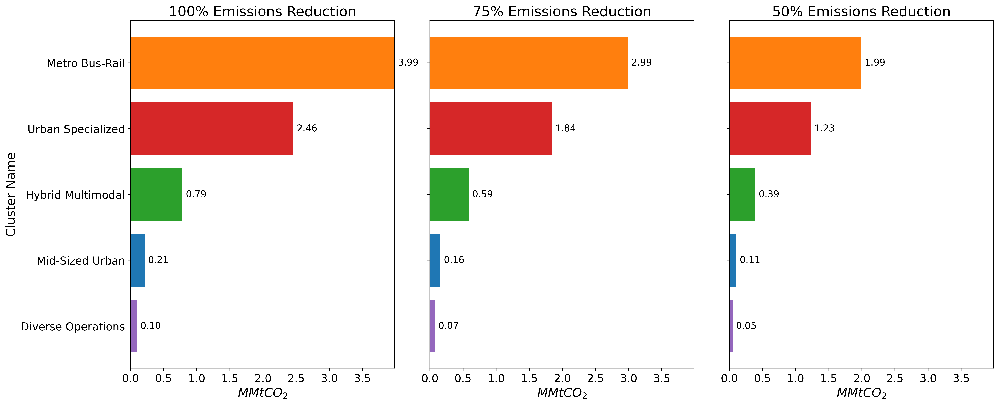

In [210]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 8), sharey=True, dpi=400)

# Plot each reduction scenario as a separate horizontal bar chart
for i, (scenario, title) in enumerate(zip(scenarios, titles)):
    # Select the current subplot
    ax = axes[i]
    
    # Plot horizontal bar for the current scenario
    bars = ax.barh(
        kgco2_sum_per_cluster["Cluster Name"], 
        kgco2_sum_per_cluster[scenario], 
        color=[cluster_colors[cluster] for cluster in kgco2_sum_per_cluster["Cluster Name"]]
    )
    
    # Set titles and labels
    ax.set_title(title, fontsize=18)
    ax.set_xlabel("$MMtCO_2$", fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # Apply the same x-axis limit for all subplots
    ax.set_xlim(0, x_limit)
    
    # Annotate the values on each bar
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.05, bar.get_y() + bar.get_height() / 2, f"{width:.2f}", 
                va='center', fontsize=12)

# Increase font size for y-axis labels
axes[0].set_ylabel("Cluster Name", fontsize=16)

# Tight layout for better spacing
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


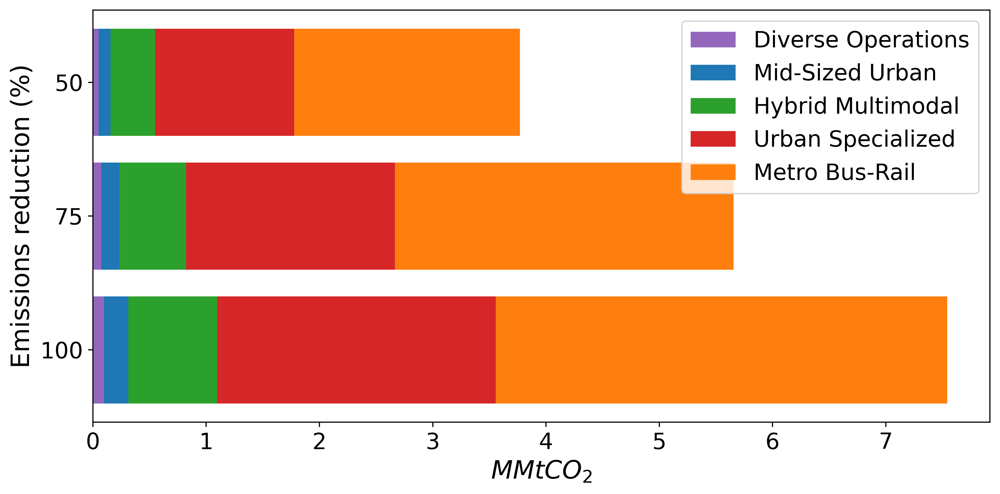

In [211]:
# Modified plot

# Define figure for single horizontal stacked bar plot
fig, ax = plt.subplots(figsize=(10, 5), dpi=400)

# Bar names and scenarios to plot in horizontal layout
bar_labels = ["100", "75", "50"]  # Order with 100% at the top and 50% at the bottom
scenarios = [
    "100PercentEmissionsReduction(million_metric_ton)",
    "75PercentEmissionsReduction(million_metric_ton)",
    "50PercentEmissionsReduction(million_metric_ton)"
]

# Initialize a position tracker for stacking
bottoms = [0, 0, 0]

# Plot horizontal stacked bars for each scenario
for cluster in kgco2_sum_per_cluster["Cluster Name"]:
    values = [kgco2_sum_per_cluster.loc[kgco2_sum_per_cluster["Cluster Name"] == cluster, scenario].values[0] for scenario in scenarios]
    color = cluster_colors[cluster]
    ax.barh(bar_labels, values, left=bottoms, label=cluster, color=color)
    # Update bottoms for stacking
    bottoms = [bottoms[j] + values[j] for j in range(len(values))]

# Set labels and title
ax.set_xlabel("$MMtCO_2$", fontsize=18)
ax.set_ylabel("Emissions reduction (%)", fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=16)

# Add legend
ax.legend(title="", fontsize=16, title_fontsize=16, loc='upper right')


plt.tight_layout()
plt.show()


## Model 2: a) Predict gal, b) using variables, c)without clusters 

In [ ]:
df_model1

In [ ]:
# Show rows where total_diesel(gal) is zero
zero_diesel_rows = df[df['total_diesel(gal)'] == 0]
print("Rows where total_diesel(gal) is zero:")
zero_diesel_rows

In [ ]:
# Drop rows where total_diesel(gal) is zero
df_model2 = df[df['total_diesel(gal)'] != 0]

In [ ]:
# Define the columns to exclude
columns_to_exclude = ['total_kWh', 'total_diesel(gal)', 'NTD ID', 'City', 'State', 'UZA', 'Latitude', 'Longitude', 'PC1', 'Diesel Consumption per Capita', 'Diesel Consumption per Capita', 'Cluster', 'PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12', 'Cluster Name']


# Select features (X) and target variables (y)
X_model2 = df_model2.drop(columns=columns_to_exclude)
y_model2 = df_model2['total_diesel(gal)']

In [ ]:
# Split data into training and test sets
X_train_model2, X_test_model2, y_train_model2, y_test_model2 = train_test_split(X_model2, y_model2, test_size=0.2, random_state=42)


In [ ]:
# Identify categorical and numerical columns
numerical_features = [col for col in X_model2.columns]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model2, y_train_model2)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model2)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model2, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features)
    ])

# Define the XGBoost model
xgboost_model2 = XGBRegressor(n_estimators=50, max_depth=7, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline2 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model2)])

# Train the XGBoost model
xgboost_pipeline2.fit(X_train_model2, y_train_model2)

# Make predictions
y_pred_xgb_model2 = xgboost_pipeline2.predict(X_test_model2)

# Evaluate the XGBoost model
mse_xgb_model2 = mean_squared_error(y_test_model2, y_pred_xgb_model2)
mape_xgb_model2 = mean_absolute_percentage_error(y_test_model2, y_pred_xgb_model2)

print(f'Mean Squared Error for XGBoost model1: {mse_xgb_model2}')
print(f'Mean Absolute Percentage Error for XGBoost model1: {mape_xgb_model2}')


In [ ]:
# Compute Absolute Percentage Error (APE)
ape = np.abs((y_test_model2 - y_pred_xgb_model2) / y_test_model2) * 100

# Compute Median Absolute Percentage Error (MdAPE)
mdape_xgb_model2 = np.median(ape)

# Print results
print(f'Median Absolute Percentage Error (MdAPE) for XGBoost model1: {mdape_xgb_model2}')


In [ ]:
# Scatter plot for actual vs. predicted values
plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(y_test_model2, y_pred_xgb_model2, alpha=0.6)
plt.plot([y_test_model2.min(), y_test_model2.max()], [y_test_model2.min(), y_test_model2.max()], 'k--', lw=2)
plt.xlabel('Observed values')
plt.ylabel('Predicted values')
#plt.title('Actual vs Predicted Values')
plt.show()


In [ ]:
# Create a SHAP explainer object for the XGBoost model
explainer2 = shap.Explainer(xgboost_model2, X_train_model2)

# Calculate SHAP values for the test data
shap_values2 = explainer2(X_test_model2)


plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot
shap.summary_plot(shap_values2, X_test_model2, show=False)

plt.xlabel("SHAP value", fontsize=14)

In [ ]:
plt.figure(figsize=(8, 6), dpi=200)


# Plot SHAP bar plot for feature importance
shap.summary_plot(shap_values2, X_test_model2, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()



## Model 3: a) Predict gal, b) using PCs, c)with clusters 

In [ ]:
# Show rows where total_diesel(gal) is zero
zero_diesel_rows = df[df['total_diesel(gal)'] == 0]
print("Rows where total_diesel(gal) is zero:")
zero_diesel_rows

In [ ]:
# Drop rows where total_diesel(gal) is zero
df_model3 = df[df['total_diesel(gal)'] != 0]

In [ ]:
# Define the columns to exclude
columns_to_include = ['PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12', 'Cluster Name']

# Select features (X) and target variables (y)
X_model3 = df_model3[columns_to_include]
y_model3 = df_model3['total_diesel(gal)']

In [ ]:
# Split data into training and test sets
X_train_model3, X_test_model3, y_train_model3, y_test_model3 = train_test_split(X_model3, y_model3, test_size=0.2, random_state=42)


In [ ]:
# Identify categorical and numerical columns
categorical_features = ['Cluster Name']  
numerical_features = [col for col in X_model3.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [ ]:
# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model3, y_train_model3)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model3)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model3, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model3 = XGBRegressor(n_estimators=50, max_depth=0, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline3 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model3)])

# Train the XGBoost model
xgboost_pipeline3.fit(X_train_model3, y_train_model3)

# Make predictions
y_pred_xgb_model3 = xgboost_pipeline3.predict(X_test_model3)

# Evaluate the XGBoost model
mse_xgb_model3 = mean_squared_error(y_test_model3, y_pred_xgb_model3)
mape_xgb_model3 = mean_absolute_percentage_error(y_test_model3, y_pred_xgb_model3)

print(f'Mean Squared Error for XGBoost model1: {mse_xgb_model3}')
print(f'Mean Absolute Percentage Error for XGBoost model1: {mape_xgb_model3}')


In [ ]:
# Get feature names for the transformed data
# Numerical feature names remain the same
numerical_features_transformed = numerical_features

# Get the categorical feature names after encoding
categorical_features_transformed = xgboost_pipeline3.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features)

# Combine both numerical and categorical feature names
feature_names = list(numerical_features_transformed) + list(categorical_features_transformed)

# Transform the training and test data using the pipeline's preprocessor step (without fitting the model)
X_train_transformed3 = xgboost_pipeline3.named_steps['preprocessor'].transform(X_train_model3)
X_test_transformed3 = xgboost_pipeline3.named_steps['preprocessor'].transform(X_test_model3)

# Create a SHAP explainer object for the XGBoost model
explainer3 = shap.Explainer(xgboost_pipeline3.named_steps['model'], X_train_transformed3)

# Calculate SHAP values for the test data
shap_values3 = explainer3(X_test_transformed3)

plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot with proper feature names
shap.summary_plot(shap_values3, X_test_transformed3, feature_names=feature_names, show=False)

plt.xlabel("SHAP value", fontsize=14)


In [ ]:
plt.figure(figsize=(10, 6), dpi=300)

# Plot SHAP bar plot for feature importance with proper feature names
shap.summary_plot(shap_values3, X_test_transformed3, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()


## Model 4: a) Predict gal, b) using PCs, c)without clusters 

In [ ]:
# Show rows where total_diesel(gal) is zero
zero_diesel_rows = df[df['total_diesel(gal)'] == 0]
print("Rows where total_diesel(gal) is zero:")
zero_diesel_rows

In [ ]:
# Drop rows where total_diesel(gal) is zero
df_model4 = df[df['total_diesel(gal)'] != 0]

In [ ]:
# Define the columns to exclude
columns_to_include = ['PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12']

# Select features (X) and target variables (y)
X_model4 = df_model4[columns_to_include]
y_model4 = df_model4['total_diesel(gal)']

In [ ]:
# Split data into training and test sets
X_train_model4, X_test_model4, y_train_model4, y_test_model4 = train_test_split(X_model4, y_model4, test_size=0.2, random_state=42)


In [ ]:
# Identify categorical and numerical columns
numerical_features = [col for col in X_model4.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        #('cat', categorical_transformer, categorical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model4, y_train_model4)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model4)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model4, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        #('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model4 = XGBRegressor(n_estimators=50, max_depth=9, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline4 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model4)])

# Train the XGBoost model
xgboost_pipeline4.fit(X_train_model4, y_train_model4)

# Make predictions
y_pred_xgb_model4 = xgboost_pipeline4.predict(X_test_model4)

# Evaluate the XGBoost model
mse_xgb_model4 = mean_squared_error(y_test_model4, y_pred_xgb_model4)
mape_xgb_model4 = mean_absolute_percentage_error(y_test_model4, y_pred_xgb_model4)

print(f'Mean Squared Error for XGBoost model1: {mse_xgb_model4}')
print(f'Mean Absolute Percentage Error for XGBoost model1: {mape_xgb_model4}')


In [ ]:
# Create a SHAP explainer object for the XGBoost model
explainer4 = shap.Explainer(xgboost_model4, X_train_model4)

# Calculate SHAP values for the test data
shap_values4 = explainer4(X_test_model4)


plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot
shap.summary_plot(shap_values4, X_test_model4, show=False)

plt.xlabel("SHAP value", fontsize=14)

In [ ]:
plt.figure(figsize=(8, 6), dpi=200)


# Plot SHAP bar plot for feature importance
shap.summary_plot(shap_values4, X_test_model4, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()



## Model 5: a) Predict kwh, b) using variables, c)with clusters 

In [164]:
# Show rows where total_diesel(gal) is zero
zero_kwh_rows = df[df['total_kWh'] == 0]
print("Rows where total_kWh is zero:")
zero_kwh_rows

Rows where total_kWh is zero:


,NTD ID,Agency VOMS,Actual Vehicle/Passenger Car Miles,Service Area Population,Primary UZA Area Sq Miles,Mode VOMS_AR,Mode VOMS_CB,Mode VOMS_CC,Mode VOMS_CR,Mode VOMS_DR,...,PC7,PC8,PC9,PC10,PC11,PC12,Cluster,Diesel Consumption per Capita,Electricity Consumption per Capita,Cluster Name
5,6,132.0,1153763.0,100715.0,55.77,0.0,2.0,0.0,0.0,24.0,...,-0.073681,0.003547,-0.012568,0.016142,-0.021283,-0.021290,3,2.038247,0.0,Urban Specialized
11,12,504.0,4833875.0,291247.0,91.69,0.0,0.0,0.0,0.0,33.0,...,0.057989,-0.029634,0.013268,0.023526,-0.015368,-0.003053,3,2.665449,0.0,Urban Specialized
14,16,63.0,511329.0,61598.0,35.19,0.0,1.0,0.0,0.0,10.0,...,-0.067942,0.003934,-0.013447,0.005532,-0.018585,-0.014949,3,1.729456,0.0,Urban Specialized
16,18,1072.0,8174668.0,307750.0,112.21,0.0,0.0,0.0,0.0,100.0,...,0.052675,0.066764,0.013035,0.027872,-0.008302,0.003599,3,3.402619,0.0,Urban Specialized
17,19,960.0,6046657.0,198000.0,106.21,0.0,2.0,0.0,0.0,45.0,...,0.093915,-0.014356,0.019642,0.038023,-0.029649,0.002536,3,4.071399,0.0,Urban Specialized
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2152,91092,39.0,465640.0,150242.0,37.00,0.0,3.0,0.0,0.0,3.0,...,-0.179529,-0.056267,0.003312,-0.043746,-0.198930,-0.214480,0,0.431131,0.0,Metro Bus-Rail
2190,99422,360.0,8391406.0,784298.0,92.46,0.0,0.0,0.0,0.0,0.0,...,0.027498,-0.059492,0.003513,-0.065132,-0.193448,-0.128592,0,0.499378,0.0,Metro Bus-Rail
2191,99423,82.0,1021685.0,223467.0,1636.83,0.0,0.0,0.0,0.0,6.0,...,-0.038826,0.007923,-0.006094,0.045507,-0.054193,-0.021899,4,1.646274,0.0,Diverse Operations
2192,99424,66.0,958967.0,141371.0,1636.83,0.0,0.0,0.0,0.0,9.0,...,-0.042809,0.005793,-0.005777,0.045915,-0.055537,-0.022500,4,2.053929,0.0,Diverse Operations


In [165]:
# Drop rows where total_diesel(gal) is zero
df_model5 = df[df['total_kWh'] != 0]

In [166]:
# Define the columns to exclude
columns_to_exclude = ['total_kWh', 'total_diesel(gal)', 'NTD ID', 'City', 'State', 'UZA', 'Latitude', 'Longitude', 'PC1', 'Diesel Consumption per Capita', 'Diesel Consumption per Capita', 'Cluster', 'PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12']

# Select features (X) and target variables (y)
X_model5 = df_model5.drop(columns=columns_to_exclude)
y_model5 = df_model5['total_kWh']

In [167]:
# Split data into training and test sets
X_train_model5, X_test_model5, y_train_model5, y_test_model5 = train_test_split(X_model5, y_model5, test_size=0.2, random_state=42)


In [168]:
# Identify categorical and numerical columns
categorical_features = ['Cluster Name']  
numerical_features = [col for col in X_model5.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [169]:
# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


In [170]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model5, y_train_model5)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model5)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model5, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


n_estimators: 50, max_depth: 2 => MAPE: 14.441393310079548
n_estimators: 50, max_depth: 3 => MAPE: 11.669214175970907
n_estimators: 50, max_depth: 4 => MAPE: 17.81406221914997
n_estimators: 50, max_depth: 5 => MAPE: 34.24158143561834
n_estimators: 50, max_depth: 6 => MAPE: 24.658411836169318
n_estimators: 50, max_depth: 7 => MAPE: 3.411195265490273
n_estimators: 50, max_depth: 8 => MAPE: 1.4599476121278532
n_estimators: 50, max_depth: 9 => MAPE: 2.529391934808383
n_estimators: 100, max_depth: 2 => MAPE: 37.26425898632688
n_estimators: 100, max_depth: 3 => MAPE: 8.563400957450936
n_estimators: 100, max_depth: 4 => MAPE: 38.26997164148341
n_estimators: 100, max_depth: 5 => MAPE: 35.43554336961056
n_estimators: 100, max_depth: 6 => MAPE: 23.329904799723575
n_estimators: 100, max_depth: 7 => MAPE: 3.705715422439344
n_estimators: 100, max_depth: 8 => MAPE: 1.2626645613366205
n_estimators: 100, max_depth: 9 => MAPE: 2.2203975523192794
n_estimators: 150, max_depth: 2 => MAPE: 36.7375368438706

In [171]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model5 = XGBRegressor(n_estimators=150, max_depth=8, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline5 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model5)])

# Train the XGBoost model
xgboost_pipeline5.fit(X_train_model5, y_train_model5)

# Make predictions
y_pred_xgb_model5 = xgboost_pipeline5.predict(X_test_model5)

# Evaluate the XGBoost model
mse_xgb_model5 = mean_squared_error(y_test_model5, y_pred_xgb_model5)
mape_xgb_model5 = mean_absolute_percentage_error(y_test_model5, y_pred_xgb_model5)

print(f'Mean Squared Error for XGBoost model5: {mse_xgb_model5}')
print(f'Mean Absolute Percentage Error for XGBoost model5: {mape_xgb_model5}')


Mean Squared Error for XGBoost model5: 1.2044149807919952e+16
Mean Absolute Percentage Error for XGBoost model5: 1.2612945619556695


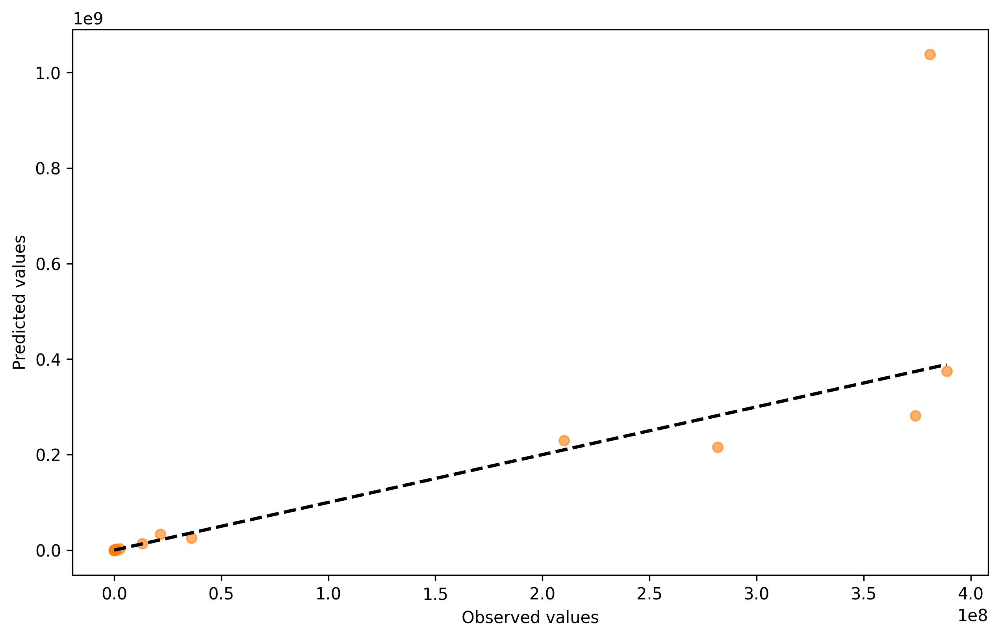

In [173]:
# Scatter plot for actual vs. predicted values
plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(y_test_model5, y_pred_xgb_model5, alpha=0.6)
plt.plot([y_test_model5.min(), y_test_model5.max()], [y_test_model5.min(), y_test_model5.max()], 'k--', lw=2)
plt.xlabel('Observed values')
plt.ylabel('Predicted values')
#plt.title('Actual vs Predicted Values')
plt.show()


In [176]:
y_test_model5

164        108587.0
380           206.0
1945       527196.0
1004     13144250.0
1932       258194.0
146         40597.0
237         27415.0
523         10456.0
1360        41205.0
993     374029990.0
988        192714.0
1957        41109.0
524        698851.0
1349     21545505.0
392        302500.0
148     210022952.0
421       2613717.0
1547     36092205.0
997          3563.0
494         46944.0
1989       456345.0
1416       301900.0
1928    281734585.0
250     380816628.0
21         491162.0
1542       247712.0
503          8743.0
157         50599.0
1968       202556.0
1927       450193.0
1987       920976.0
493        654000.0
960        298264.0
940         93588.0
519         49380.0
249     388728660.0
1367       251820.0
Name: total_kWh, dtype: float64

In [177]:
y_train_model5

516       170577.0
522     75860587.0
255     93339968.0
37        213262.0
373     95702744.0
           ...    
1296       17529.0
117          675.0
981        47520.0
2034       17567.0
1012       17737.0
Name: total_kWh, Length: 145, dtype: float64

In [175]:
y_pred_xgb_model5

array([ 6.7890781e+04,  1.3840765e+03,  5.7905844e+05,  1.3524183e+07,
        1.3799283e+05, -3.7968539e+04,  5.5977277e+04,  8.1012453e+04,
        2.5292697e+05,  2.8171533e+08,  1.8434498e+05, -3.5342457e+04,
        2.3789132e+06,  3.3634560e+07,  1.0976392e+05,  2.2947712e+08,
        2.6962215e+06,  2.5369266e+07, -2.0827730e+04,  1.6337098e+04,
        5.0358791e+05,  6.3937094e+05,  2.1545952e+08,  1.0379944e+09,
        4.1419031e+05,  5.2189734e+05,  9.1380625e+03,  5.2040547e+03,
        3.8523388e+05, -3.5207772e+05,  6.2107675e+05,  1.2005398e+06,
        2.3951036e+05,  4.7888031e+04,  5.5517583e+03,  3.7485066e+08,
        9.9451117e+04], dtype=float32)

In [ ]:
# Get feature names for the transformed data
# Numerical feature names remain the same
numerical_features_transformed = numerical_features

# Get the categorical feature names after encoding
categorical_features_transformed = xgboost_pipeline5.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features)

# Combine both numerical and categorical feature names
feature_names = list(numerical_features_transformed) + list(categorical_features_transformed)

# Transform the training and test data using the pipeline's preprocessor step (without fitting the model)
X_train_transformed5 = xgboost_pipeline5.named_steps['preprocessor'].transform(X_train_model5)
X_test_transformed5 = xgboost_pipeline5.named_steps['preprocessor'].transform(X_test_model5)

# Create a SHAP explainer object for the XGBoost model
explainer5 = shap.Explainer(xgboost_pipeline5.named_steps['model'], X_train_transformed5)

# Calculate SHAP values for the test data
shap_values5 = explainer5(X_test_transformed5)

plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot with proper feature names
shap.summary_plot(shap_values5, X_test_transformed5, feature_names=feature_names, show=False)

plt.xlabel("SHAP value", fontsize=14)


In [ ]:
import matplotlib.ticker as mticker

plt.figure(figsize=(10, 6), dpi=300)

# Plot SHAP bar plot for feature importance with proper feature names
shap.summary_plot(shap_values5, X_test_transformed5, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()


## Model 6: a) Predict kwh, b) using variables, c)without clusters 

In [ ]:
# Drop rows where total_diesel(gal) is zero
df_model6 = df[df['total_kWh'] != 0]

In [ ]:
# Define the columns to exclude
columns_to_exclude = ['total_kWh', 'total_diesel(gal)', 'NTD ID', 'City', 'State', 'UZA', 'Latitude', 'Longitude', 'PC1', 'Diesel Consumption per Capita', 'Diesel Consumption per Capita', 'Cluster', 'PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12', 'Cluster Name']


# Select features (X) and target variables (y)
X_model6 = df_model6.drop(columns=columns_to_exclude)
y_model6 = df_model6['total_kWh']

In [ ]:
# Split data into training and test sets
X_train_model6, X_test_model6, y_train_model6, y_test_model6 = train_test_split(X_model6, y_model6, test_size=0.2, random_state=42)


In [ ]:
# Identify categorical and numerical columns
numerical_features = [col for col in X_model6.columns]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model6, y_train_model6)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model6)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model6, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features)
    ])

# Define the XGBoost model
xgboost_model6 = XGBRegressor(n_estimators=100, max_depth=7, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline6 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model6)])

# Train the XGBoost model
xgboost_pipeline6.fit(X_train_model6, y_train_model6)

# Make predictions
y_pred_xgb_model6 = xgboost_pipeline6.predict(X_test_model6)

# Evaluate the XGBoost model
mse_xgb_model6 = mean_squared_error(y_test_model6, y_pred_xgb_model6)
mape_xgb_model6 = mean_absolute_percentage_error(y_test_model6, y_pred_xgb_model6)

print(f'Mean Squared Error for XGBoost model6: {mse_xgb_model6}')
print(f'Mean Absolute Percentage Error for XGBoost model6: {mape_xgb_model6}')


In [ ]:
# Scatter plot for actual vs. predicted values
plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(y_test_model6, y_pred_xgb_model6, alpha=0.6)
plt.plot([y_test_model6.min(), y_test_model6.max()], [y_test_model6.min(), y_test_model6.max()], 'k--', lw=2)
plt.xlabel('Observed values')
plt.ylabel('Predicted values')
#plt.title('Actual vs Predicted Values')
plt.show()


In [ ]:
# Create a SHAP explainer object for the XGBoost model
explainer6 = shap.Explainer(xgboost_model6, X_train_model6)

# Calculate SHAP values for the test data
shap_values6 = explainer6(X_test_model6)


plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot
shap.summary_plot(shap_values6, X_test_model6, show=False)

plt.xlabel("SHAP value", fontsize=14)

In [ ]:
plt.figure(figsize=(8, 6), dpi=200)


# Plot SHAP bar plot for feature importance
shap.summary_plot(shap_values6, X_test_model6, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()



## Model 7: a) Predict kwh, b) using PCs, c)with clusters 

In [ ]:
# Drop rows where total_diesel(gal) is zero
df_model7 = df[df['total_kWh'] != 0]

In [ ]:
# Define the columns to exclude
columns_to_include = ['PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12', 'Cluster Name']

# Select features (X) and target variables (y)
X_model7 = df_model7[columns_to_include]
y_model7 = df_model7['total_kWh']

In [ ]:
# Split data into training and test sets
X_train_model7, X_test_model7, y_train_model7, y_test_model7 = train_test_split(X_model7, y_model7, test_size=0.2, random_state=42)


In [ ]:
# Identify categorical and numerical columns
categorical_features = ['Cluster Name']  
numerical_features = [col for col in X_model7.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [ ]:
# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model7, y_train_model7)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model7)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model7, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model7 = XGBRegressor(n_estimators=100, max_depth=8, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline7 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model7)])

# Train the XGBoost model
xgboost_pipeline7.fit(X_train_model7, y_train_model7)

# Make predictions
y_pred_xgb_model7 = xgboost_pipeline7.predict(X_test_model7)

# Evaluate the XGBoost model
mse_xgb_model7 = mean_squared_error(y_test_model7, y_pred_xgb_model7)
mape_xgb_model7 = mean_absolute_percentage_error(y_test_model7, y_pred_xgb_model7)

print(f'Mean Squared Error for XGBoost model7: {mse_xgb_model7}')
print(f'Mean Absolute Percentage Error for XGBoost model7: {mape_xgb_model7}')


In [ ]:
# Get feature names for the transformed data
# Numerical feature names remain the same
numerical_features_transformed = numerical_features

# Get the categorical feature names after encoding
categorical_features_transformed = xgboost_pipeline7.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features)

# Combine both numerical and categorical feature names
feature_names = list(numerical_features_transformed) + list(categorical_features_transformed)

# Transform the training and test data using the pipeline's preprocessor step (without fitting the model)
X_train_transformed7 = xgboost_pipeline7.named_steps['preprocessor'].transform(X_train_model7)
X_test_transformed7 = xgboost_pipeline7.named_steps['preprocessor'].transform(X_test_model7)

# Create a SHAP explainer object for the XGBoost model
explainer7 = shap.Explainer(xgboost_pipeline7.named_steps['model'], X_train_transformed7)

# Calculate SHAP values for the test data
shap_values7 = explainer7(X_test_transformed7)

plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot with proper feature names
shap.summary_plot(shap_values7, X_test_transformed7, feature_names=feature_names, show=False)

plt.xlabel("SHAP value", fontsize=14)


In [ ]:
import matplotlib.ticker as mticker

plt.figure(figsize=(10, 6), dpi=300)

# Plot SHAP bar plot for feature importance with proper feature names
shap.summary_plot(shap_values7, X_test_transformed7, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()


## Model 8: a) Predict kwh, b) using PCs, c)without clusters 

In [ ]:
# Drop rows where total_diesel(gal) is zero
df_model8 = df[df['total_kWh'] != 0]

In [ ]:
# Define the columns to exclude
columns_to_include = ['PC1', 'PC2', 'PC3',  'PC4', 'PC5',  'PC6', 'PC7',  'PC8', 'PC9',  'PC10', 'PC11',  'PC12']

# Select features (X) and target variables (y)
X_model8 = df_model8[columns_to_include]
y_model8 = df_model8['total_kWh']

In [ ]:
# Split data into training and test sets
X_train_model8, X_test_model8, y_train_model8, y_test_model8 = train_test_split(X_model8, y_model8, test_size=0.2, random_state=42)


In [ ]:
# Identify categorical and numerical columns
numerical_features = [col for col in X_model8.columns if col not in categorical_features]

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler())
])

In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        #('cat', categorical_transformer, categorical_features)
    ])

# Define the parameter grid
n_estimators_list = [50, 100, 150, 200, 250, 300]
max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize variables to store the best parameters and lowest MAPE
best_mape = float('inf')
best_params = {}

# Loop through all combinations of n_estimators and max_depth
for n_estimators in n_estimators_list:
    for max_depth in max_depth_list:
        # Update the model with current parameters
        xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

        # Create a new pipeline with updated model
        xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', xgboost_model)])

        # Train the model
        xgboost_pipeline.fit(X_train_model8, y_train_model8)

        # Make predictions
        y_pred = xgboost_pipeline.predict(X_test_model8)

        # Calculate MAPE
        mape = mean_absolute_percentage_error(y_test_model8, y_pred)

        # Print the results
        print(f'n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

        # Update the best parameters if current MAPE is lower than the best MAPE
        if mape < best_mape:
            best_mape = mape
            best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

# Print the best parameters and lowest MAPE
print(f'Best parameters: {best_params}')
print(f'Lowest MAPE: {best_mape}')


In [ ]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        #('cat', categorical_transformer, categorical_features)
    ])

# Define the XGBoost model
xgboost_model8 = XGBRegressor(n_estimators=50, max_depth=9, random_state=42)

# Create a pipeline with the preprocessor and XGBoost model
xgboost_pipeline8 = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', xgboost_model8)])

# Train the XGBoost model
xgboost_pipeline8.fit(X_train_model8, y_train_model8)

# Make predictions
y_pred_xgb_model8 = xgboost_pipeline8.predict(X_test_model8)

# Evaluate the XGBoost model
mse_xgb_model8 = mean_squared_error(y_test_model8, y_pred_xgb_model8)
mape_xgb_model8 = mean_absolute_percentage_error(y_test_model8, y_pred_xgb_model8)

print(f'Mean Squared Error for XGBoost model8: {mse_xgb_model8}')
print(f'Mean Absolute Percentage Error for XGBoost model8: {mape_xgb_model8}')


In [ ]:
# Create a SHAP explainer object for the XGBoost model
explainer8 = shap.Explainer(xgboost_model8, X_train_model8)

# Calculate SHAP values for the test data
shap_values8 = explainer8(X_test_model8)


plt.figure(figsize=(8, 6), dpi=200)

# Plot SHAP summary plot
shap.summary_plot(shap_values8, X_test_model8, show=False)

plt.xlabel("SHAP value", fontsize=14)

In [ ]:
plt.figure(figsize=(8, 6), dpi=200)


# Plot SHAP bar plot for feature importance
shap.summary_plot(shap_values8, X_test_model8, feature_names=feature_names, plot_type="bar", show=False)

# Set x-axis label
plt.xlabel("Average SHAP value", fontsize=14)

# Apply scientific notation to x-axis
ax = plt.gca()
ax.xaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.show()



## Model 9: train the models for each cluster

In [ ]:
# Define the columns to exclude from features
columns_to_exclude = ['total_kWh', 'total_diesel(gal)', 'NTD ID', 'City', 'State', 'UZA', 'Latitude', 'Longitude', 'Cluster', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'Diesel Consumption per Capita']

# Initialize an empty list to store results for each cluster
results = []

# Get unique clusters
unique_clusters = df_model1['Cluster'].unique()

# Loop through each cluster
for cluster in unique_clusters:
    print(f"Training model for Cluster: {cluster}")
    
    # Subset data for the current cluster
    df_cluster = df_model1[df_model1['Cluster'] == cluster]
    
    # Define X (features) and y (target)
    X_cluster = df_cluster.drop(columns=columns_to_exclude)
    y_cluster = df_cluster['total_diesel(gal)']
    
    # Identify categorical and numerical columns
    categorical_features = ['Cluster Name']  # Adjust as per your actual categorical column
    numerical_features = [col for col in X_cluster.columns if col not in categorical_features]

    # Preprocessing for numerical data
    numerical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
        ('scaler', StandardScaler())
    ])

    # Preprocessing for categorical data
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

    # Bundle preprocessing for numerical and categorical data
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Split data into training and test sets
    X_train_cluster, X_test_cluster, y_train_cluster, y_test_cluster = train_test_split(X_cluster, y_cluster, test_size=0.2, random_state=42)
    
    # Initialize variables to store the best parameters and lowest MAPE for this cluster
    best_mape = float('inf')
    best_params = {}

    # Define model hyperparameters for grid search
    n_estimators_list = [50, 100, 150, 200, 250, 300]
    max_depth_list = [2, 3, 4, 5, 6, 7, 8, 9]

    # Loop through all combinations of n_estimators and max_depth
    for n_estimators in n_estimators_list:
        for max_depth in max_depth_list:
            # Define the XGBoost model with current parameters
            xgboost_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

            # Create a pipeline with the preprocessor and the model
            xgboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                               ('model', xgboost_model)])

            # Train the model
            xgboost_pipeline.fit(X_train_cluster, y_train_cluster)

            # Make predictions
            y_pred = xgboost_pipeline.predict(X_test_cluster)

            # Calculate MAPE
            mape = mean_absolute_percentage_error(y_test_cluster, y_pred)

            # Print the results
            print(f'Cluster: {cluster}, n_estimators: {n_estimators}, max_depth: {max_depth} => MAPE: {mape}')

            # Update the best parameters if current MAPE is lower than the best MAPE
            if mape < best_mape:
                best_mape = mape
                best_params = {'n_estimators': n_estimators, 'max_depth': max_depth}

    # Append the best results for this cluster to the results list
    results.append({
        'Cluster': cluster,
        'Best n_estimators': best_params['n_estimators'],
        'Best max_depth': best_params['max_depth'],
        'Lowest MAPE': best_mape
    })

# Convert results list into a DataFrame for analysis
results_df = pd.DataFrame(results)

results_df


In [ ]:
# Count the number of data points for each cluster
cluster_counts = df_model1.groupby('Cluster').size()

# Print the results
print("Number of data points for each cluster:")
print(cluster_counts)


# Try to improve model 1

In [ ]:
# Define parameter grid for GridSearchCV
param_grid = {
    'model__n_estimators': [100, 150, 200],
    'model__max_depth': [3, 5, 7, 9],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__subsample': [0.6, 0.8, 1.0]
}

# Create a new pipeline with the preprocessor and model
xgboost_pipeline_cv = Pipeline(steps=[('preprocessor', preprocessor),
                                      ('model', XGBRegressor(random_state=42))])

# Initialize GridSearchCV
grid_search = GridSearchCV(xgboost_pipeline_cv, param_grid, cv=5, scoring='neg_mean_absolute_percentage_error', verbose=1)

# Fit GridSearchCV
grid_search.fit(X_train_model1, y_train_model1)

# Best parameters and results
print(f'Best Parameters: {grid_search.best_params_}')
print(f'Best MAPE: {abs(grid_search.best_score_)}')
